In [1]:
import pennylane as qml
from pennylane import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, mean_squared_error
import torch
import torch.nn as nn
import pandas as pd
from tqdm import tqdm
from torchsummary import summary
import time
torch.manual_seed(42)
# from torchviz import make_dot

# lr = 0.01 different encoding

In [2]:

# Configuration
n_qubits = 2
input_dim = 2
res = 30  # resolution of x1, x2 grid
X_vals = np.linspace(0, 2 * np.pi, res)
X1, X2 = np.meshgrid(X_vals, X_vals)
inputs = np.stack([X1.ravel(), X2.ravel()], axis=1)


In [3]:

# Encoding
def encoding_layer(x, n_qubits):
    for i in range(n_qubits):
        qml.RX(x[0], wires=i)
        qml.RX(x[1], wires=i)

def variational_block(weights, n_qubits):
    for i in range(n_qubits):
        qml.RZ(weights[i, 0], wires=i)
        qml.RY(weights[i, 1], wires=i)
        qml.RZ(weights[i, 2], wires=i)
    if n_qubits > 1:
        for i in range(n_qubits):
            qml.CNOT(wires=[i, (i + 1) % n_qubits])


# Create circuit
def create_qnode(depth, weights, dev, n_qubits):
    @qml.qnode(dev)
    def circuit(x):
        encoding_layer(x, n_qubits)
        for d in range(depth):
            variational_block(weights[d], n_qubits)
        return qml.expval(qml.PauliZ(0))  # Output from qubit 0
    return circuit


In [4]:

# Label from circuit
def generate_labels(circuit, X):
    return np.array([1 if circuit(x) > 0 else 0 for x in X])


In [5]:
def get_torch_model(depth, dev, n_qubits):
    weight_shapes = {"weights": (depth, n_qubits, 3)}

    @qml.qnode(dev, interface="torch")
    def circuit(inputs, weights):
        encoding_layer(inputs, n_qubits)
        for d in range(depth):
            for i in range(n_qubits):
                qml.RZ(weights[d, i, 0], wires=i)
                qml.RY(weights[d, i, 1], wires=i)
                qml.RZ(weights[d, i, 2], wires=i)
            if n_qubits > 1:
                for i in range(n_qubits):
                    qml.CNOT(wires=[i, (i + 1) % n_qubits])
        return qml.expval(qml.PauliZ(0))

    return qml.qnn.TorchLayer(circuit, weight_shapes)


In [6]:
def create_mlp(input_dim, total_params, hidden_layers):
    """Create a classical MLP with given total parameters and depth."""
    n_layers = hidden_layers
    out_dim = 1
    input_to_hidden = input_dim

    def estimate_hidden_dim(p):
        for h in range(1, 200):
            est = input_to_hidden * h + h * h * (n_layers - 1) + h * out_dim
            if est > p:
                return h - 1
        return 50  # fallback

    hidden_dim = estimate_hidden_dim(total_params)

    layers = [nn.Linear(input_dim, hidden_dim), nn.ReLU()]
    for _ in range(n_layers - 1):
        layers += [nn.Linear(hidden_dim, hidden_dim), nn.ReLU()]
    layers += [nn.Linear(hidden_dim, out_dim)]  # Tanh constrains output to [-1, 1]

    return nn.Sequential(*layers)

In [7]:

# Training loop
def train_model(model, X_train, y_train, epochs=100, lr=0.01,gen_type=None):
    opt = torch.optim.Adam(model.parameters(), lr=lr)
    loss_fn = nn.BCEWithLogitsLoss()
    for _ in range(epochs):
        opt.zero_grad()
        outputs = torch.stack([model(x) for x in X_train])
        if gen_type == "pqc":
            loss = loss_fn(outputs, y_train.squeeze())
        else:
            loss = loss_fn(outputs, y_train)
        loss.backward()
        opt.step()
    return model


In [8]:
def plot_generator_A(generator_labels, title, X=None, train_idx=None):
    plt.figure(figsize=(6, 5))
    Z = generator_labels.reshape(res, res)
    plt.contourf(X1, X2, Z, levels=2, cmap='RdBu', alpha=0.4)
    plt.contour(X1, X2, Z, levels=2, colors='black', linewidths=0.5)

    # Optional: overlay generated class markers on the full grid
    X_flat = X1.ravel(), X2.ravel()
    labels_flat = generator_labels.ravel()
    for cls, marker in zip([0, 1], ['o', 's']):
        idx = labels_flat == cls
        plt.scatter(X_flat[0][idx], X_flat[1][idx], marker=marker, color='black', s=5, alpha=0.3, label=f'Class {cls}')

    # Optional: training points overlay
    if X is not None and train_idx is not None:
        X_train = X[train_idx]
        y_train = generator_labels[train_idx]
        for i, pt in enumerate(X_train):
            marker = 'o' if y_train[i] == 0 else 's'
            plt.scatter(pt[0], pt[1], marker=marker, color='yellow', edgecolor='black', s=40, label="Train point" if i == 0 else None)

    plt.title(title)
    plt.xlabel(r'$x_1$')
    plt.ylabel(r'$x_2$')
    plt.legend()
    plt.tight_layout()
    plt.show()


In [9]:

# Plot contours
def plot_results(generator_labels, predicted_labels, title, X, train_idx=None):
    plt.figure(figsize=(6, 5))
    Z = predicted_labels.reshape(res, res)
    plt.contourf(X1, X2, Z, levels=2, alpha=0.3, cmap='RdBu')
    plt.contour(X1, X2, generator_labels.reshape(res, res), levels=2, colors='black', linewidths=0.5)

    # Plot training points
    if train_idx is not None:
        X_train_pts = X[train_idx]
        y_true = generator_labels[train_idx]
        y_pred = predicted_labels[train_idx]

        for i, pt in enumerate(X_train_pts):
            marker = 'o' if y_true[i] == 0 else 's'
            color = 'green' if y_pred[i] == y_true[i] else 'red'
            label = None

            # Add legend once
            if i == 0 and y_true[i] == 0:
                label = 'Class 0 (circle)'
            elif i == 0 and y_true[i] == 1:
                label = 'Class 1 (square)'

            plt.scatter(pt[0], pt[1], color=color, marker=marker, s=40, edgecolor='black', label=label)

        # Ensure both classes appear in legend even if only one example is shown
        from matplotlib.lines import Line2D
        legend_elements = [
            Line2D([0], [0], marker='o', color='w', label='Class 0 (circle)', markerfacecolor='gray', markeredgecolor='black', markersize=8),
            Line2D([0], [0], marker='s', color='w', label='Class 1 (square)', markerfacecolor='gray', markeredgecolor='black', markersize=8),
            Line2D([0], [0], marker='o', color='w', label='Correct (green)', markerfacecolor='green', markersize=8),
            Line2D([0], [0], marker='o', color='w', label='Wrong (red)', markerfacecolor='red', markersize=8)
        ]
        plt.legend(handles=legend_elements)
    if train_idx is None:
        X_train_pts = X
        y_true = generator_labels
        y_pred = predicted_labels

        for i, pt in enumerate(X_train_pts):
            marker = 'o' if y_true[i] == 0 else 's'
            color = 'green' if y_pred[i] == y_true[i] else 'red'
            label = None

            # Add legend once
            if i == 0 and y_true[i] == 0:
                label = 'Class 0 (circle)'
            elif i == 0 and y_true[i] == 1:
                label = 'Class 1 (square)'

            plt.scatter(pt[0], pt[1], color=color, marker=marker, s=40, edgecolor='black', label=label)

        # Ensure both classes appear in legend even if only one example is shown
        from matplotlib.lines import Line2D
        legend_elements = [
            Line2D([0], [0], marker='o', color='w', label='Class 0 (circle)', markerfacecolor='gray', markeredgecolor='black', markersize=8),
            Line2D([0], [0], marker='s', color='w', label='Class 1 (square)', markerfacecolor='gray', markeredgecolor='black', markersize=8),
            Line2D([0], [0], marker='o', color='w', label='Correct (green)', markerfacecolor='green', markersize=8),
            Line2D([0], [0], marker='o', color='w', label='Wrong (red)', markerfacecolor='red', markersize=8)
        ]
        plt.legend(handles=legend_elements)

    plt.title(title)
    plt.xlabel('x1')
    plt.ylabel('x2')
    plt.tight_layout()
    plt.show()



In [10]:

# Main experiment
# depths = [1, 2, 3, 4] # depths of reupload
depth = 3  # fixed
qubit_counts = [1, 2, 3, 4]
train_idx = np.random.choice(len(inputs), size=300, replace=False)
X_train = torch.tensor(inputs[train_idx], dtype=torch.float32)
test_idx = np.setdiff1d(np.arange(len(inputs)), train_idx)
X_test = torch.tensor(inputs[test_idx], dtype=torch.float32)

results = []


In [11]:
generators = []

# Create 8 classical generators (MLPs)
for n_qubits in qubit_counts:
    pqc_params = depth * n_qubits * 3
    for d_mlp in [1, depth]:
        model = create_mlp(input_dim, pqc_params, d_mlp)
        def label_fn(X, m=model): 
            return (m(torch.tensor(X, dtype=torch.float32)).detach().numpy().flatten() > 0).astype(int)
        if d_mlp == 1:
            generators.append({
                "type": "mlp_shallow",
                "width": n_qubits,
                "depth": d_mlp,
                "label_fn": label_fn,
                "model": model
            })
        else:
            generators.append({
                "type": "mlp_deep",
                "width": n_qubits,
                "depth": d_mlp,
                "label_fn": label_fn,
                "model": model
            })

# Create 4 PQC generators
for n_qubits in qubit_counts:
    dev = qml.device("default.qubit", wires=n_qubits)
    weights = np.random.uniform(0, 2 * np.pi, size=(depth, n_qubits, 3))
    circuit = create_qnode(depth, weights, dev, n_qubits)
    label_fn = lambda X, circ=circuit: generate_labels(circ, X)
    generators.append({
        "type": "pqc",
        "width": n_qubits,
        "depth": depth,
        "label_fn": label_fn,
        "circuit": circuit
    })


Generators:   0%|          | 0/12 [00:00<?, ?it/s]

Classical MLP used to generate data (width=1, depth=1):
Sequential(
  (0): Linear(in_features=2, out_features=3, bias=True)
  (1): ReLU()
  (2): Linear(in_features=3, out_features=1, bias=True)
)
Layer (type:depth-idx)                   Param #
├─Linear: 1-1                            9
├─ReLU: 1-2                              --
├─Linear: 1-3                            4
Total params: 13
Trainable params: 13
Non-trainable params: 0


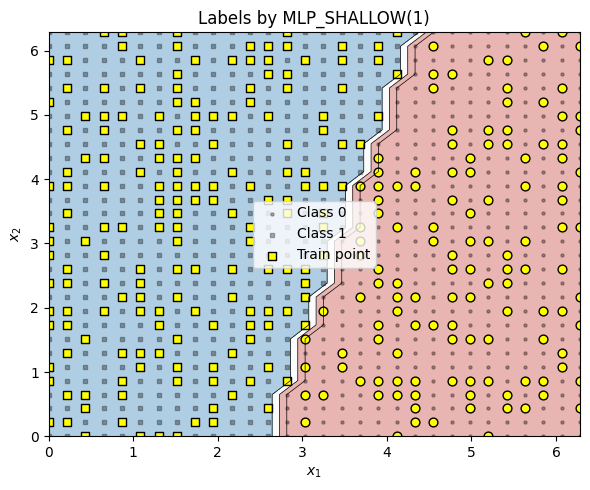

Training MLP_SHALLOW(1) on data from MLP_SHALLOW(1)
Time taken: 4.39 seconds


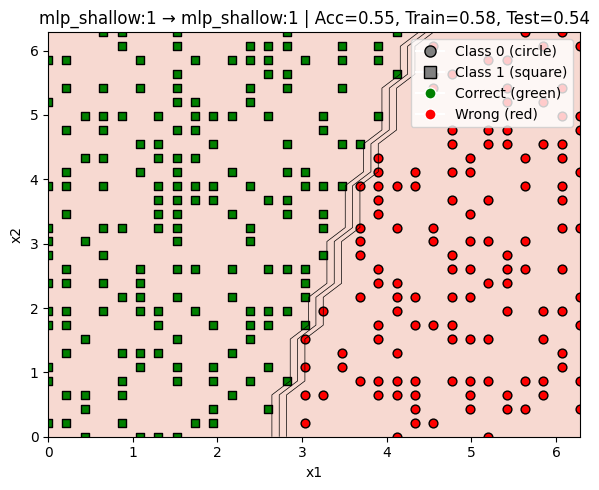

Training MLP_DEEP(1) on data from MLP_SHALLOW(1)
Time taken: 3.88 seconds


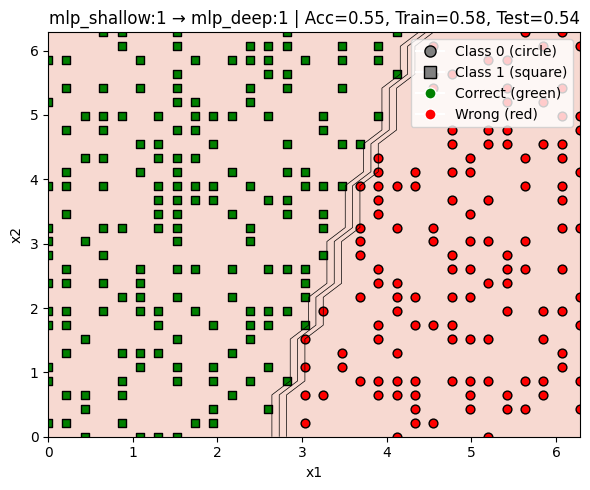

Training MLP_SHALLOW(2) on data from MLP_SHALLOW(1)
Time taken: 1.84 seconds


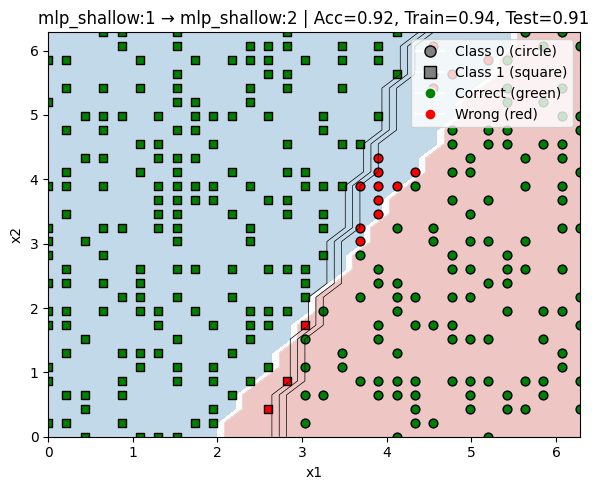

Training MLP_DEEP(2) on data from MLP_SHALLOW(1)
Time taken: 6.97 seconds


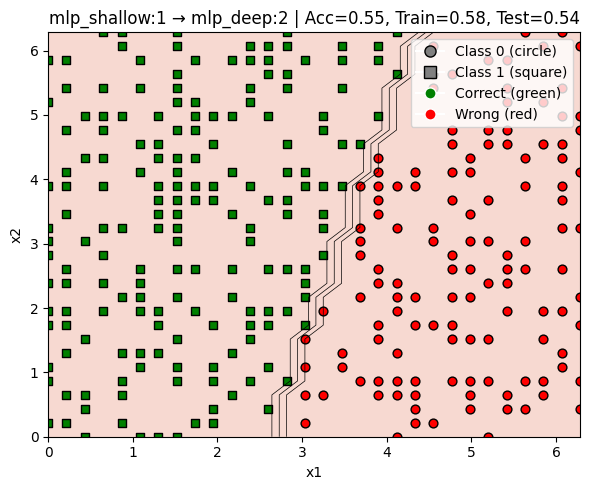

Training MLP_SHALLOW(3) on data from MLP_SHALLOW(1)
Time taken: 5.08 seconds


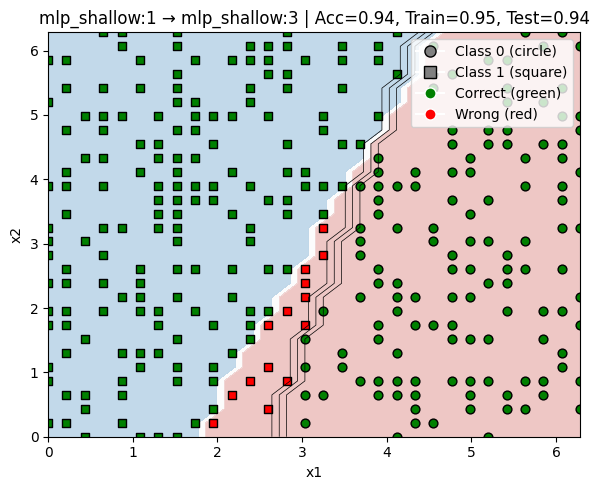

Training MLP_DEEP(3) on data from MLP_SHALLOW(1)
Time taken: 10.81 seconds


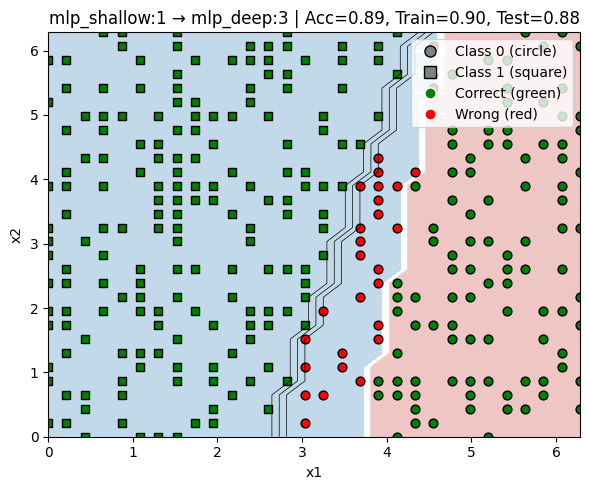

Training MLP_SHALLOW(4) on data from MLP_SHALLOW(1)
Time taken: 4.92 seconds


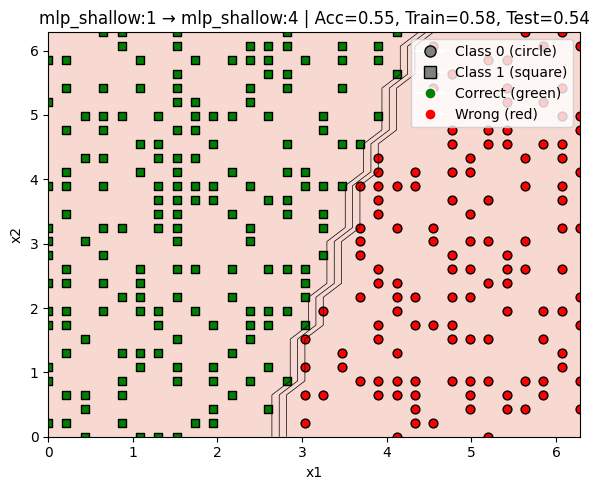

Training MLP_DEEP(4) on data from MLP_SHALLOW(1)
Time taken: 10.82 seconds


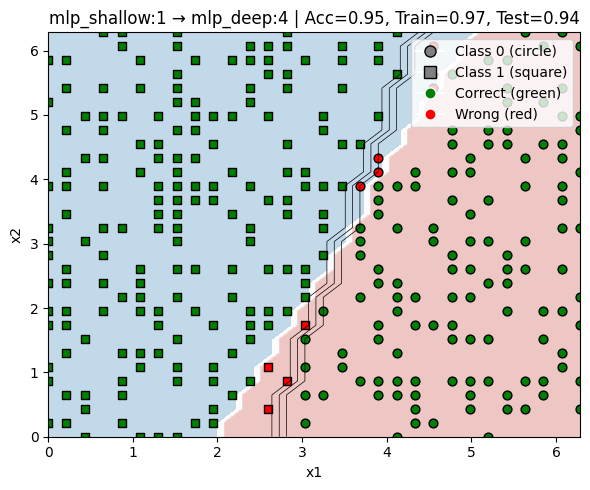

Training PQC(1) on data from MLP_SHALLOW(1)
Time taken: 197.11 seconds


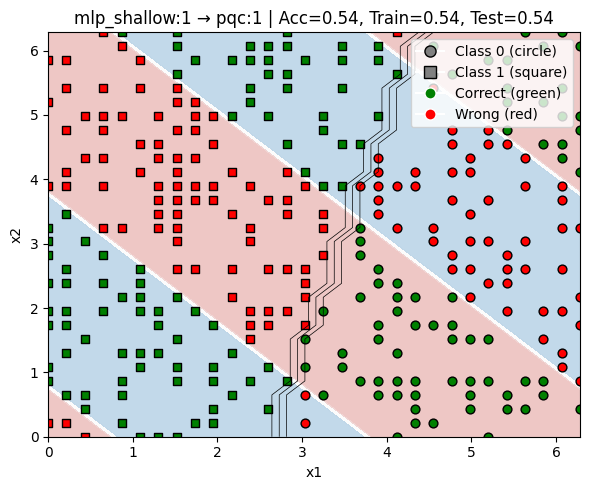

Training PQC(2) on data from MLP_SHALLOW(1)
Time taken: 380.58 seconds


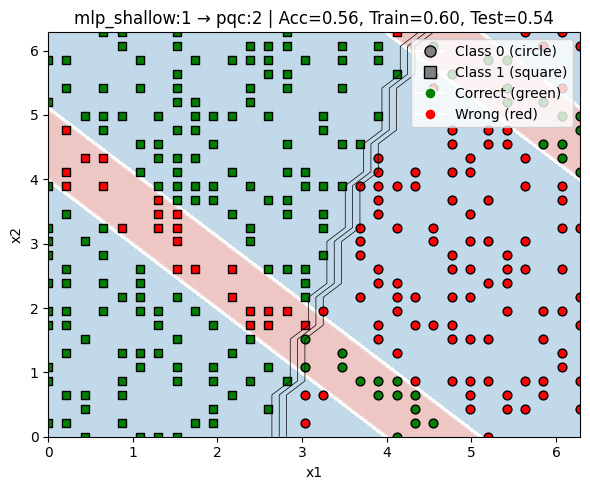

Training PQC(3) on data from MLP_SHALLOW(1)
Time taken: 264.26 seconds


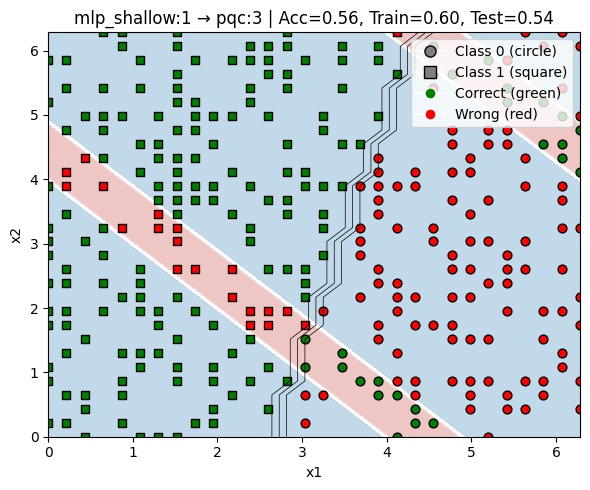

Training PQC(4) on data from MLP_SHALLOW(1)
Time taken: 390.95 seconds


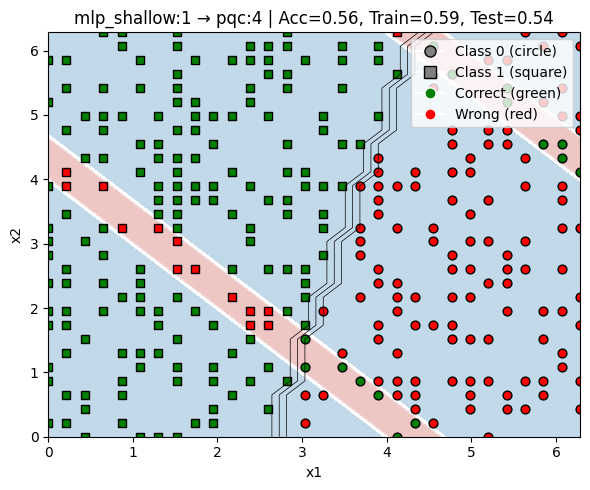

Generators:   8%|▊         | 1/12 [21:34<3:57:24, 1294.99s/it]

Classical MLP used to generate data (width=1, depth=3):
Sequential(
  (0): Linear(in_features=2, out_features=1, bias=True)
  (1): ReLU()
  (2): Linear(in_features=1, out_features=1, bias=True)
  (3): ReLU()
  (4): Linear(in_features=1, out_features=1, bias=True)
  (5): ReLU()
  (6): Linear(in_features=1, out_features=1, bias=True)
)
Layer (type:depth-idx)                   Param #
├─Linear: 1-1                            3
├─ReLU: 1-2                              --
├─Linear: 1-3                            2
├─ReLU: 1-4                              --
├─Linear: 1-5                            2
├─ReLU: 1-6                              --
├─Linear: 1-7                            2
Total params: 9
Trainable params: 9
Non-trainable params: 0


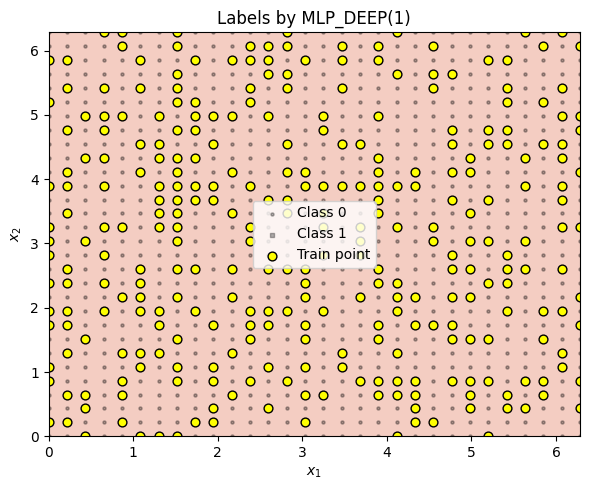

Training MLP_SHALLOW(1) on data from MLP_DEEP(1)
Time taken: 5.01 seconds


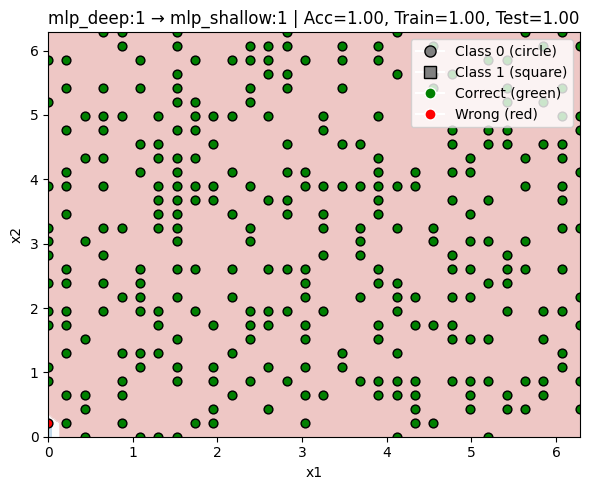

Training MLP_DEEP(1) on data from MLP_DEEP(1)
Time taken: 10.58 seconds


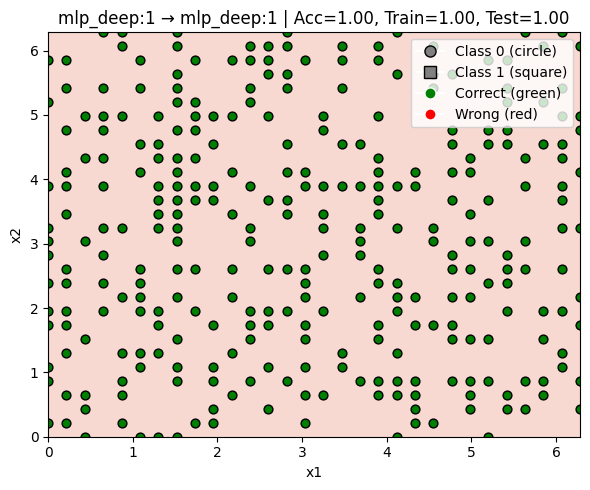

Training MLP_SHALLOW(2) on data from MLP_DEEP(1)
Time taken: 4.80 seconds


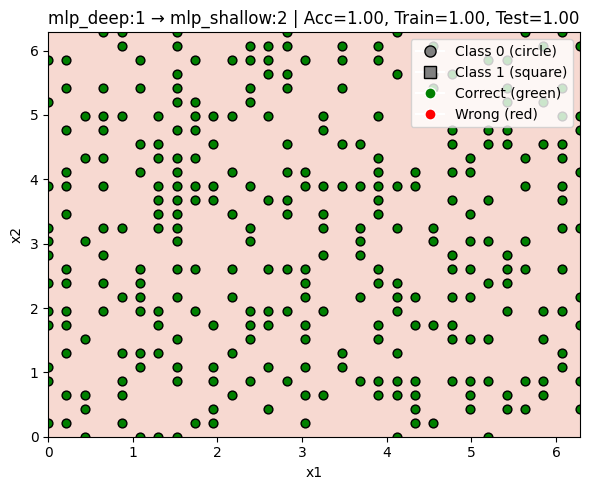

Training MLP_DEEP(2) on data from MLP_DEEP(1)
Time taken: 10.74 seconds


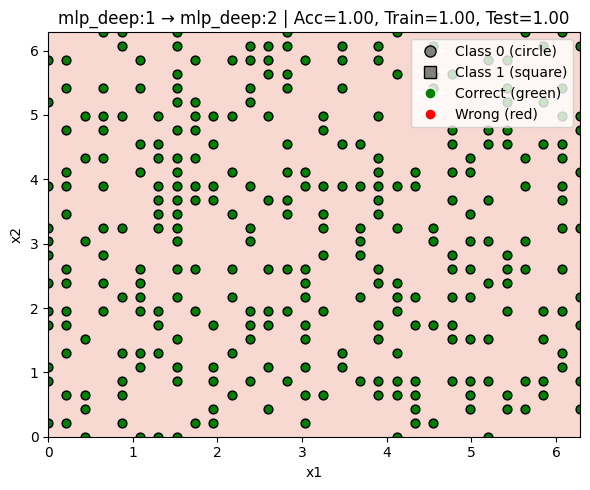

Training MLP_SHALLOW(3) on data from MLP_DEEP(1)
Time taken: 5.07 seconds


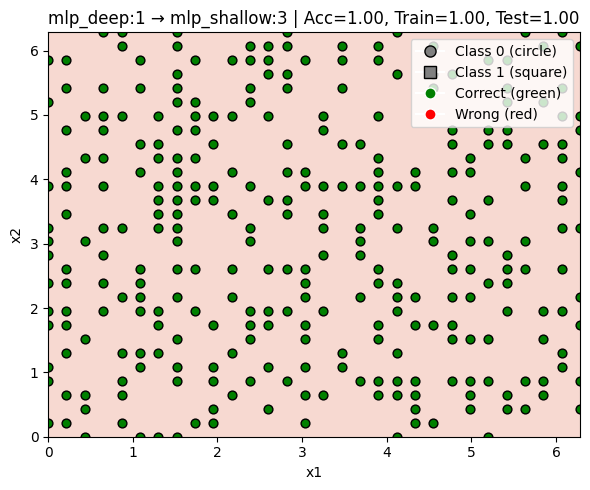

Training MLP_DEEP(3) on data from MLP_DEEP(1)
Time taken: 10.79 seconds


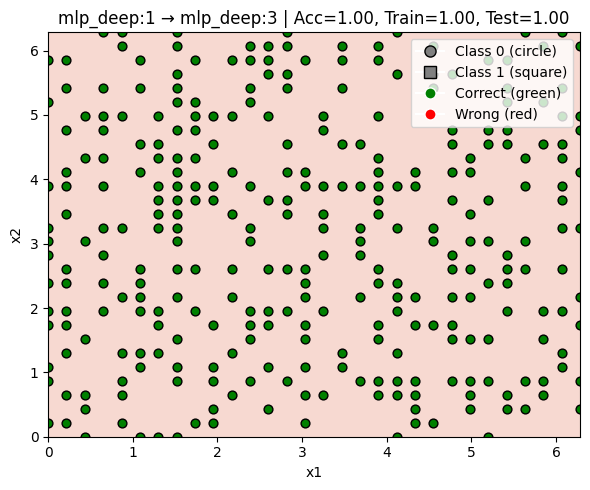

Training MLP_SHALLOW(4) on data from MLP_DEEP(1)
Time taken: 4.89 seconds


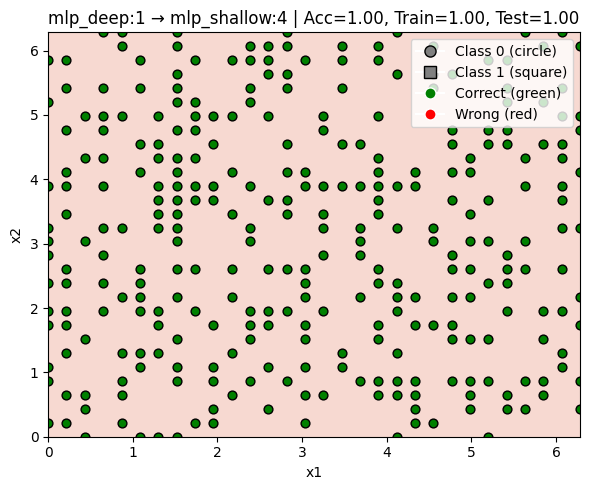

Training MLP_DEEP(4) on data from MLP_DEEP(1)
Time taken: 10.72 seconds


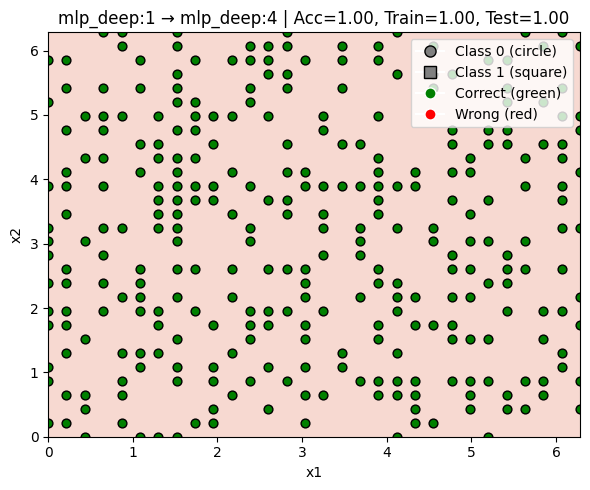

Training PQC(1) on data from MLP_DEEP(1)
Time taken: 175.25 seconds


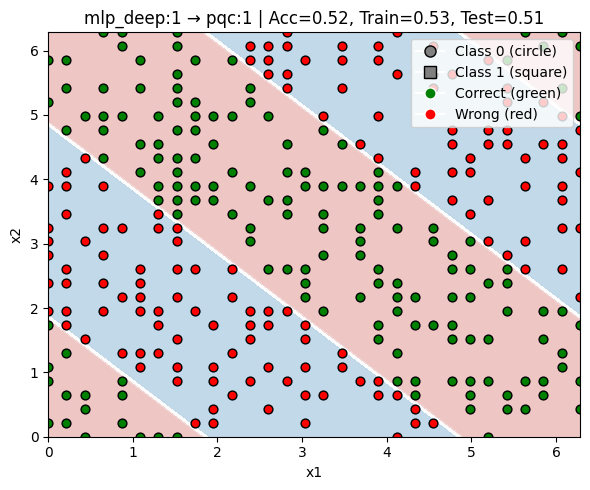

Training PQC(2) on data from MLP_DEEP(1)
Time taken: 175.99 seconds


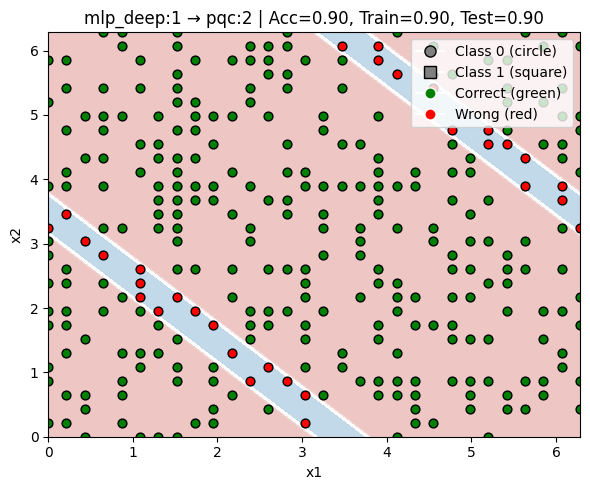

Training PQC(3) on data from MLP_DEEP(1)
Time taken: 264.44 seconds


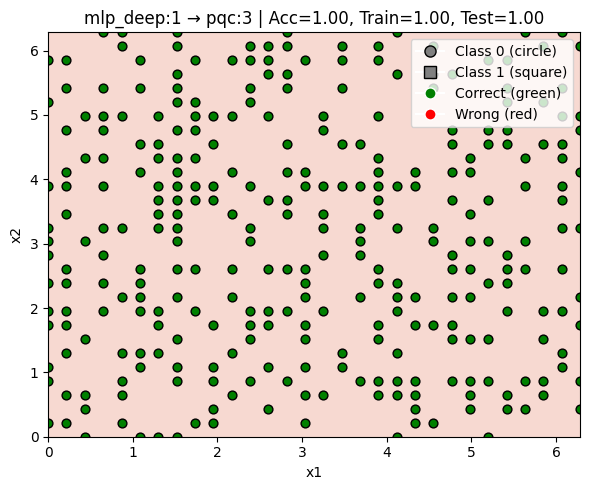

Training PQC(4) on data from MLP_DEEP(1)
Time taken: 354.58 seconds


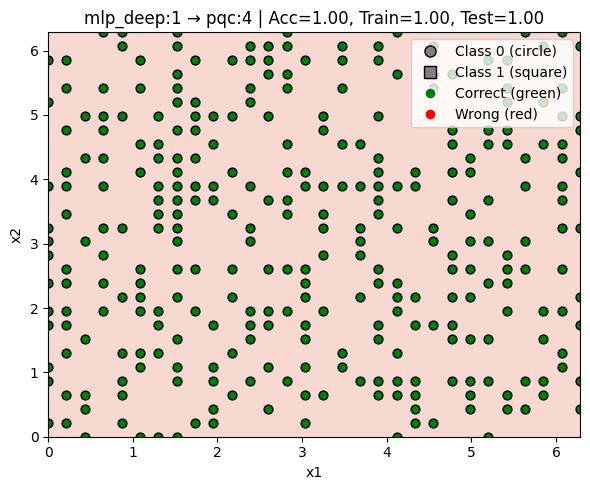

Generators:  17%|█▋        | 2/12 [39:10<3:12:20, 1154.00s/it]

Classical MLP used to generate data (width=2, depth=1):
Sequential(
  (0): Linear(in_features=2, out_features=6, bias=True)
  (1): ReLU()
  (2): Linear(in_features=6, out_features=1, bias=True)
)
Layer (type:depth-idx)                   Param #
├─Linear: 1-1                            18
├─ReLU: 1-2                              --
├─Linear: 1-3                            7
Total params: 25
Trainable params: 25
Non-trainable params: 0


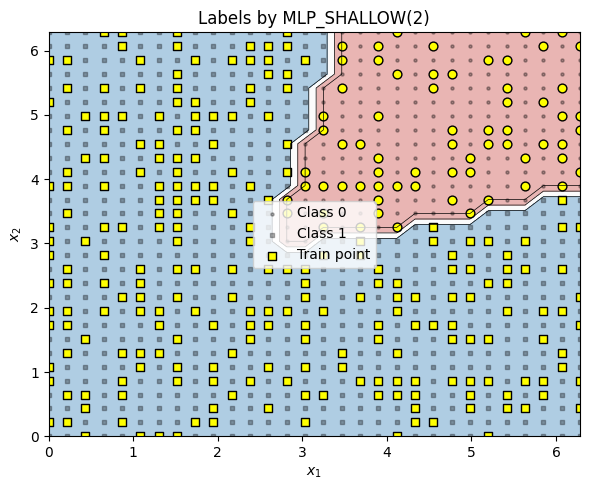

Training MLP_SHALLOW(1) on data from MLP_SHALLOW(2)
Time taken: 1.66 seconds


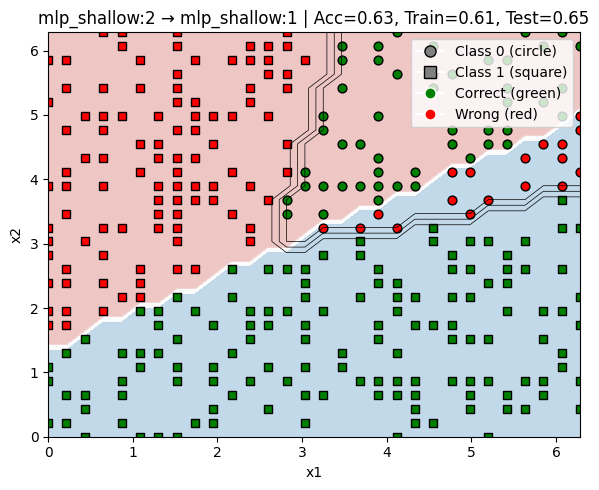

Training MLP_DEEP(1) on data from MLP_SHALLOW(2)
Time taken: 3.57 seconds


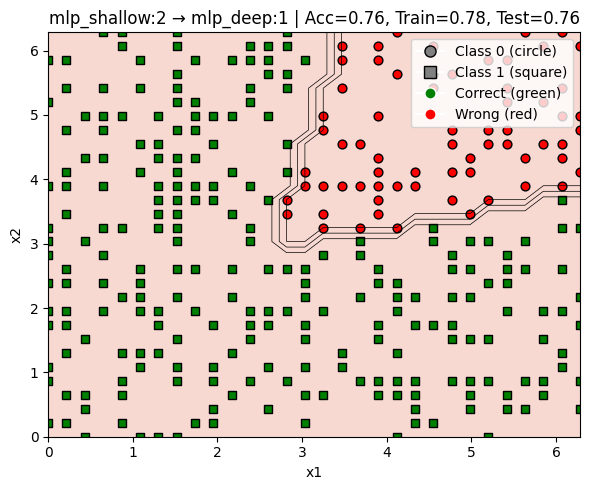

Training MLP_SHALLOW(2) on data from MLP_SHALLOW(2)
Time taken: 1.69 seconds


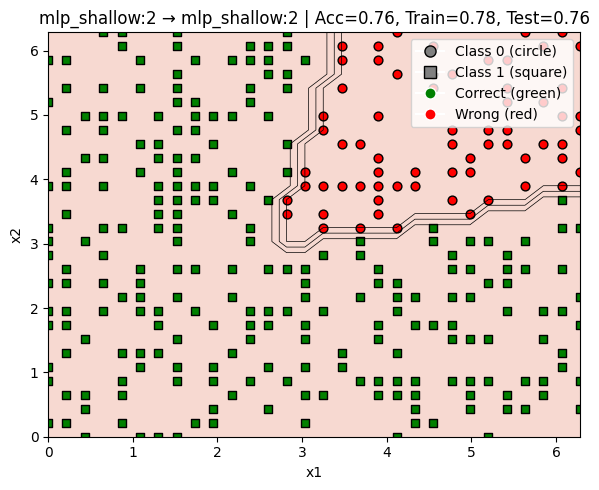

Training MLP_DEEP(2) on data from MLP_SHALLOW(2)
Time taken: 3.57 seconds


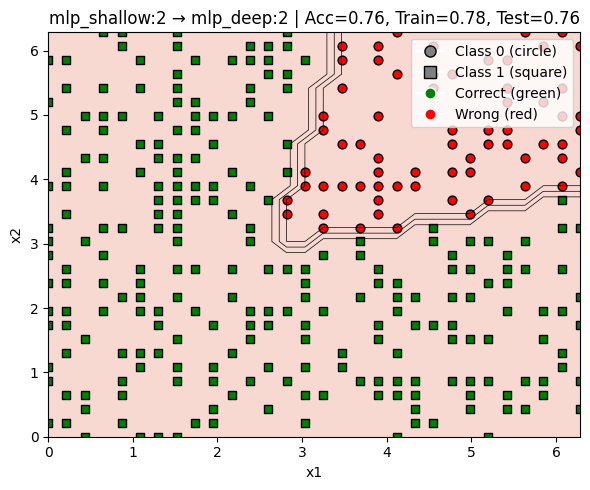

Training MLP_SHALLOW(3) on data from MLP_SHALLOW(2)
Time taken: 1.67 seconds


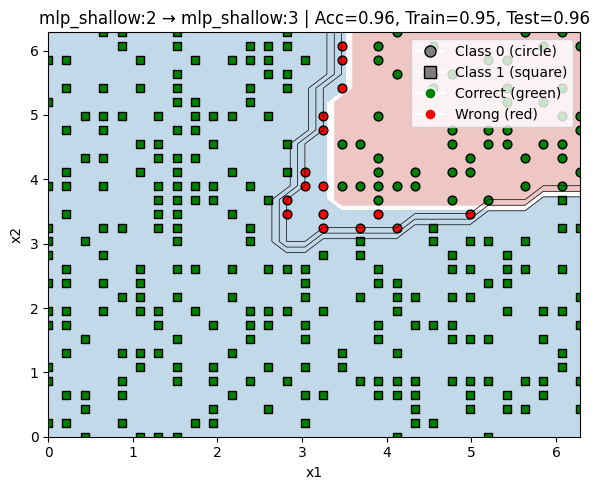

Training MLP_DEEP(3) on data from MLP_SHALLOW(2)
Time taken: 3.69 seconds


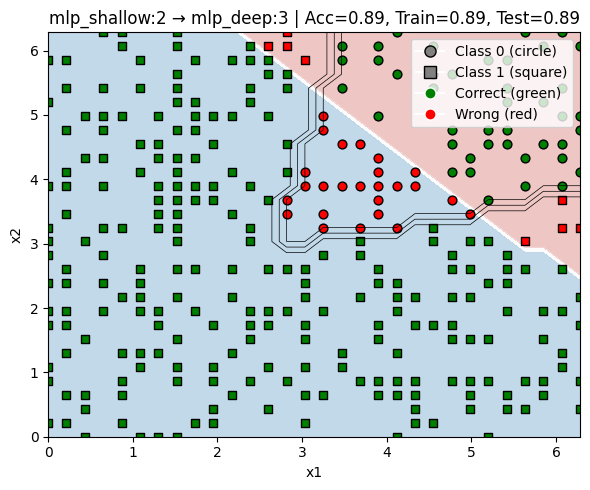

Training MLP_SHALLOW(4) on data from MLP_SHALLOW(2)
Time taken: 1.62 seconds


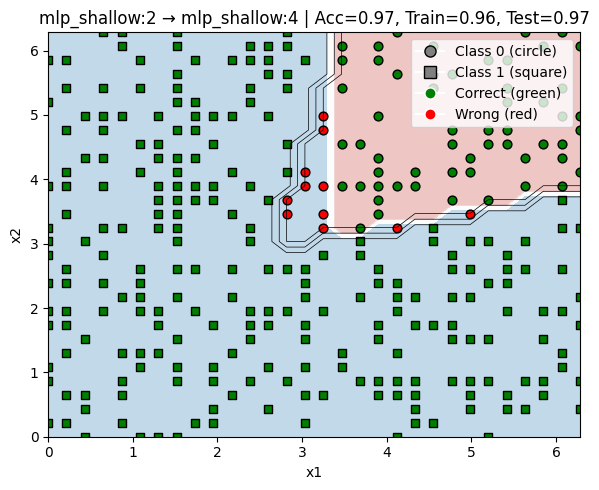

Training MLP_DEEP(4) on data from MLP_SHALLOW(2)
Time taken: 3.62 seconds


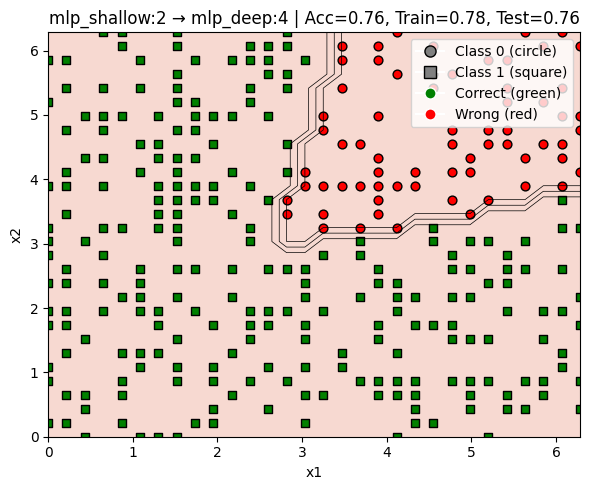

Training PQC(1) on data from MLP_SHALLOW(2)
Time taken: 79.48 seconds


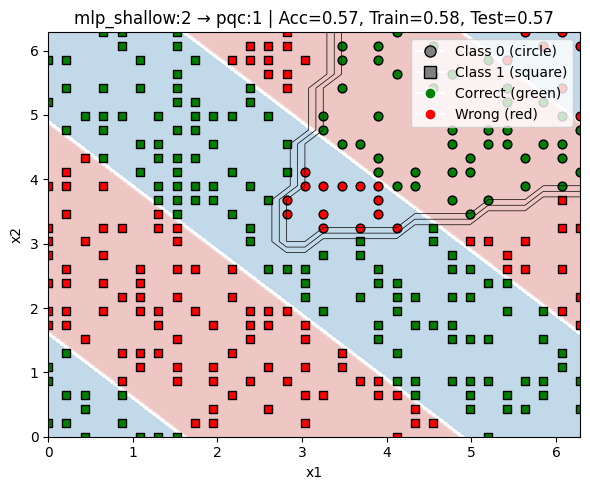

Training PQC(2) on data from MLP_SHALLOW(2)
Time taken: 173.12 seconds


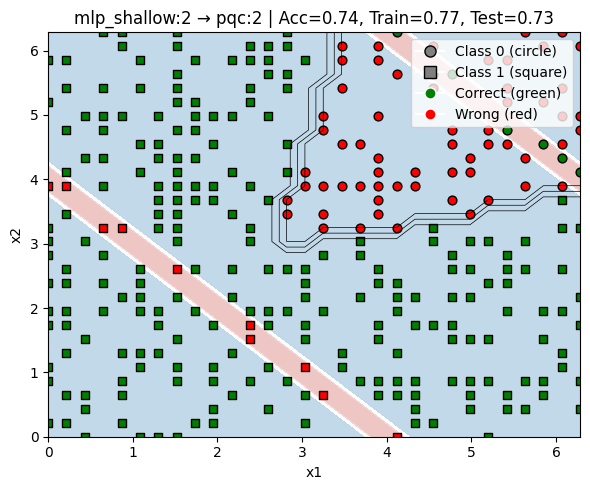

Training PQC(3) on data from MLP_SHALLOW(2)
Time taken: 261.06 seconds


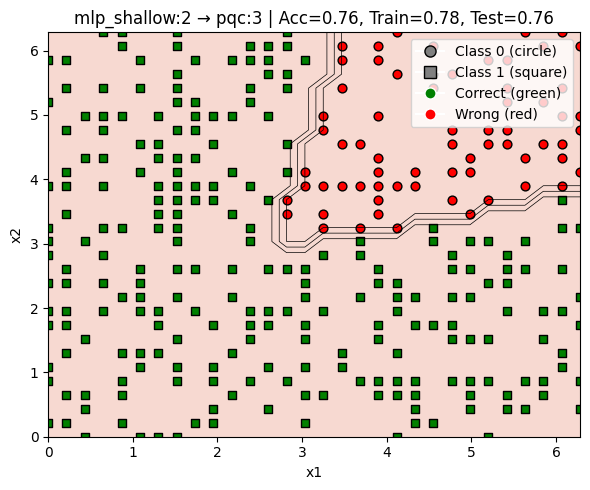

Training PQC(4) on data from MLP_SHALLOW(2)
Time taken: 355.60 seconds


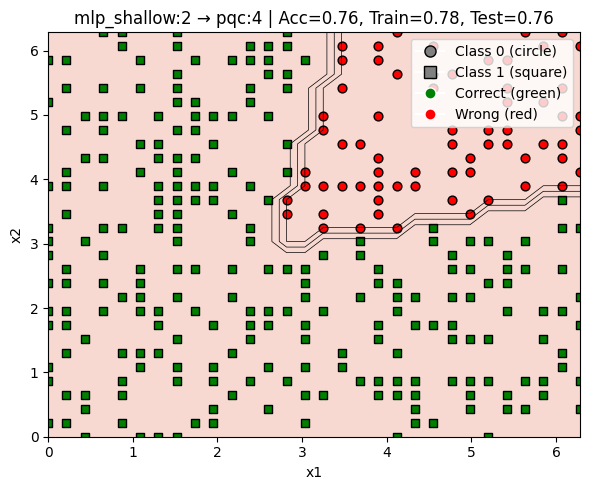

Generators:  25%|██▌       | 3/12 [54:07<2:35:31, 1036.87s/it]

Classical MLP used to generate data (width=2, depth=3):
Sequential(
  (0): Linear(in_features=2, out_features=2, bias=True)
  (1): ReLU()
  (2): Linear(in_features=2, out_features=2, bias=True)
  (3): ReLU()
  (4): Linear(in_features=2, out_features=2, bias=True)
  (5): ReLU()
  (6): Linear(in_features=2, out_features=1, bias=True)
)
Layer (type:depth-idx)                   Param #
├─Linear: 1-1                            6
├─ReLU: 1-2                              --
├─Linear: 1-3                            6
├─ReLU: 1-4                              --
├─Linear: 1-5                            6
├─ReLU: 1-6                              --
├─Linear: 1-7                            3
Total params: 21
Trainable params: 21
Non-trainable params: 0


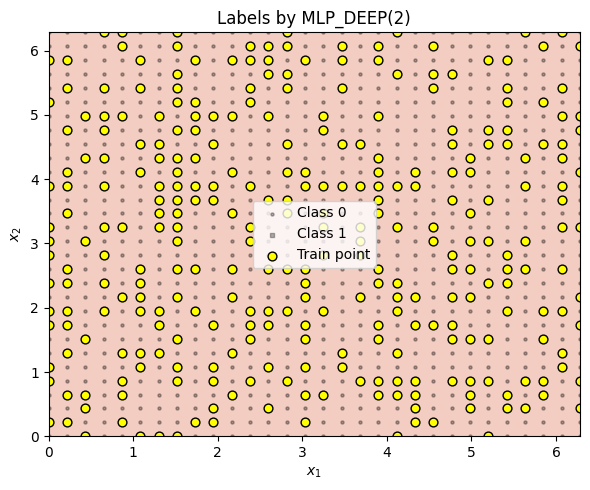

Training MLP_SHALLOW(1) on data from MLP_DEEP(2)
Time taken: 1.71 seconds


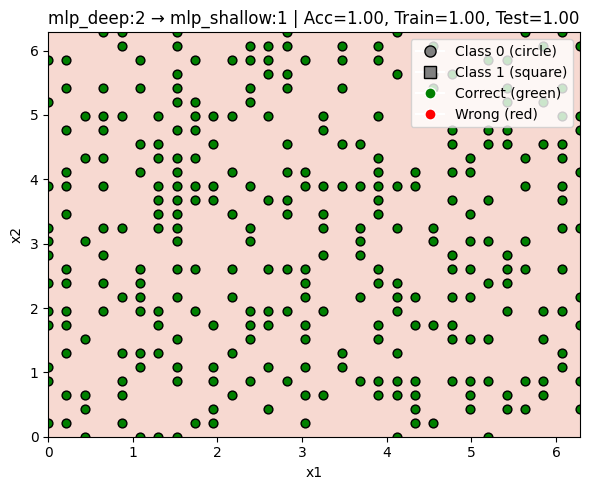

Training MLP_DEEP(1) on data from MLP_DEEP(2)
Time taken: 3.60 seconds


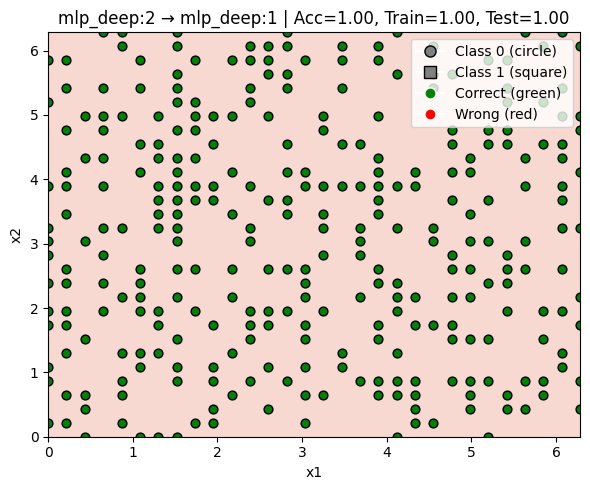

Training MLP_SHALLOW(2) on data from MLP_DEEP(2)
Time taken: 1.75 seconds


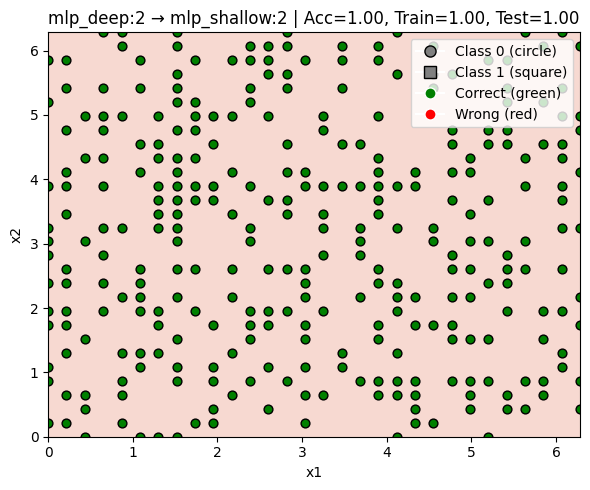

Training MLP_DEEP(2) on data from MLP_DEEP(2)
Time taken: 3.68 seconds


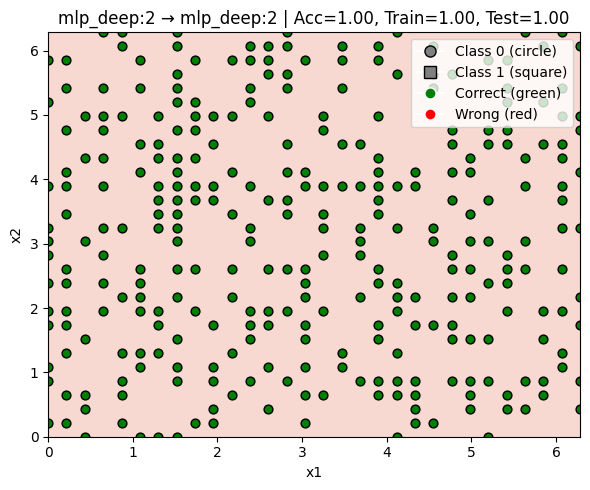

Training MLP_SHALLOW(3) on data from MLP_DEEP(2)
Time taken: 1.72 seconds


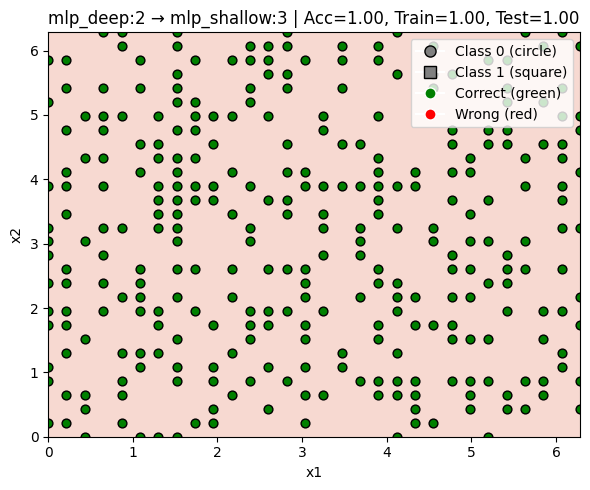

Training MLP_DEEP(3) on data from MLP_DEEP(2)
Time taken: 3.58 seconds


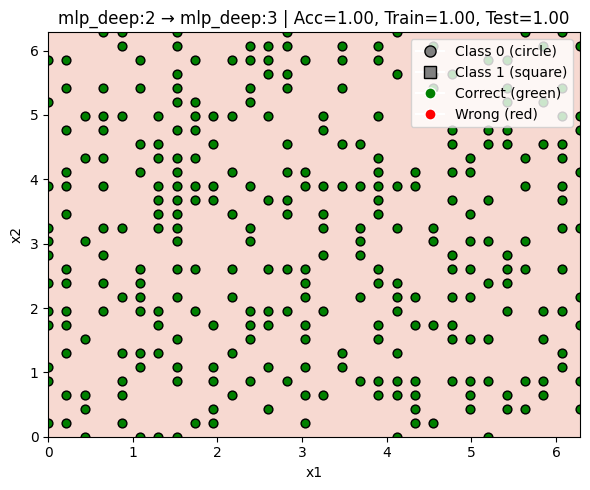

Training MLP_SHALLOW(4) on data from MLP_DEEP(2)
Time taken: 1.67 seconds


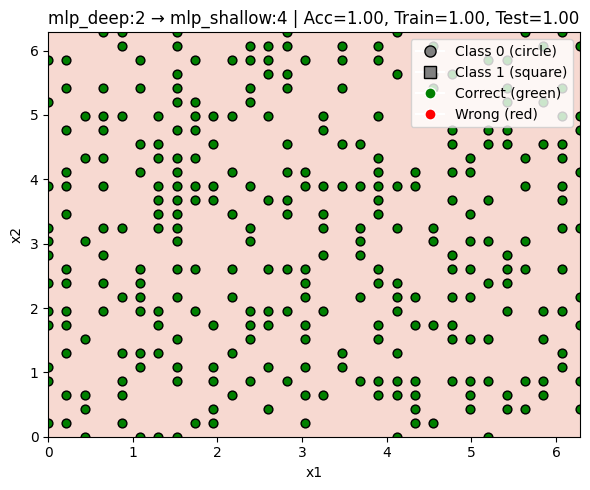

Training MLP_DEEP(4) on data from MLP_DEEP(2)
Time taken: 3.63 seconds


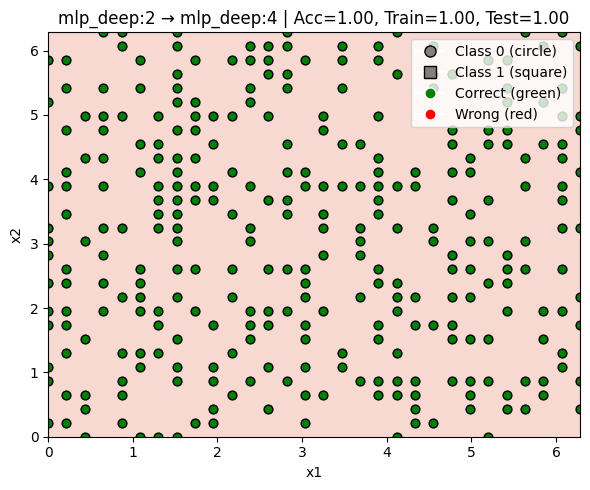

Training PQC(1) on data from MLP_DEEP(2)
Time taken: 83.27 seconds


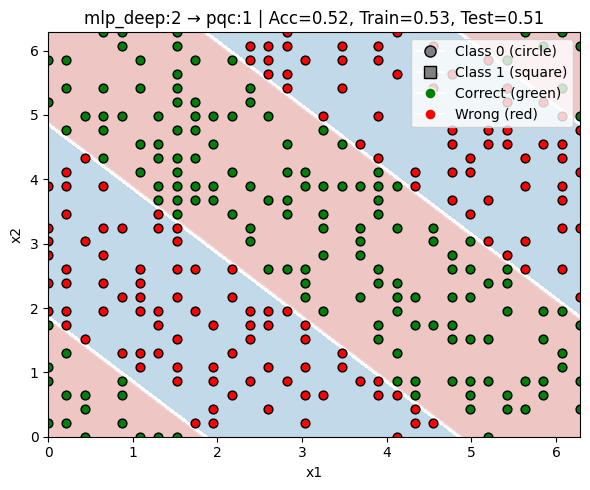

Training PQC(2) on data from MLP_DEEP(2)
Time taken: 170.06 seconds


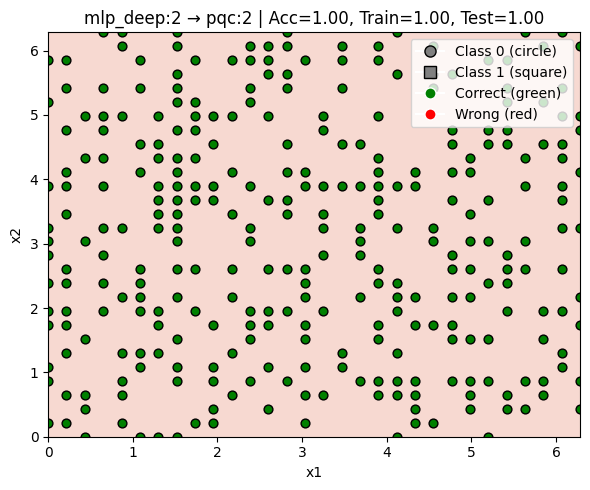

Training PQC(3) on data from MLP_DEEP(2)
Time taken: 255.30 seconds


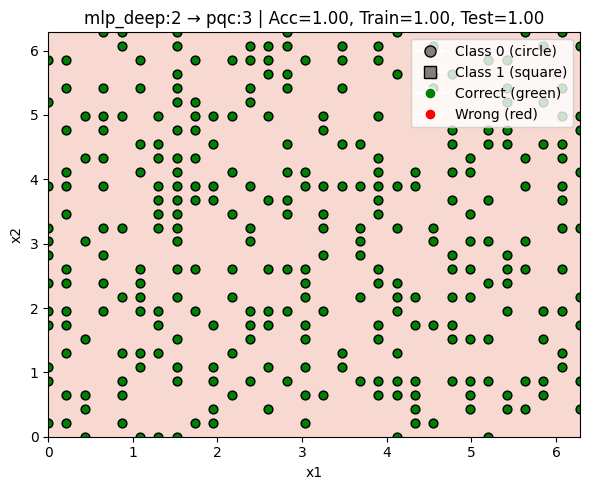

Training PQC(4) on data from MLP_DEEP(2)
Time taken: 347.04 seconds


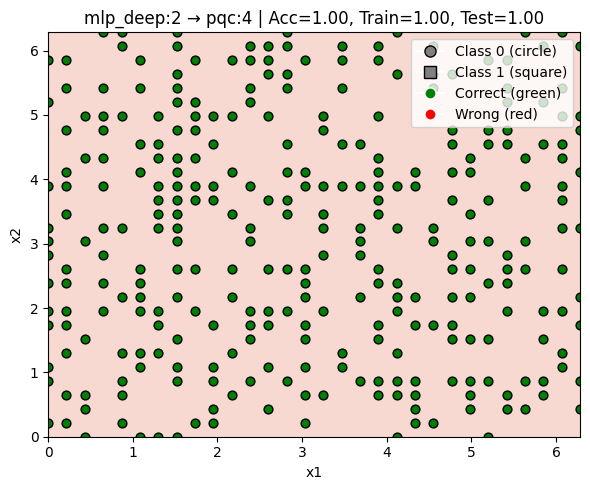

Generators:  33%|███▎      | 4/12 [1:08:56<2:10:25, 978.23s/it]

Classical MLP used to generate data (width=3, depth=1):
Sequential(
  (0): Linear(in_features=2, out_features=9, bias=True)
  (1): ReLU()
  (2): Linear(in_features=9, out_features=1, bias=True)
)
Layer (type:depth-idx)                   Param #
├─Linear: 1-1                            27
├─ReLU: 1-2                              --
├─Linear: 1-3                            10
Total params: 37
Trainable params: 37
Non-trainable params: 0


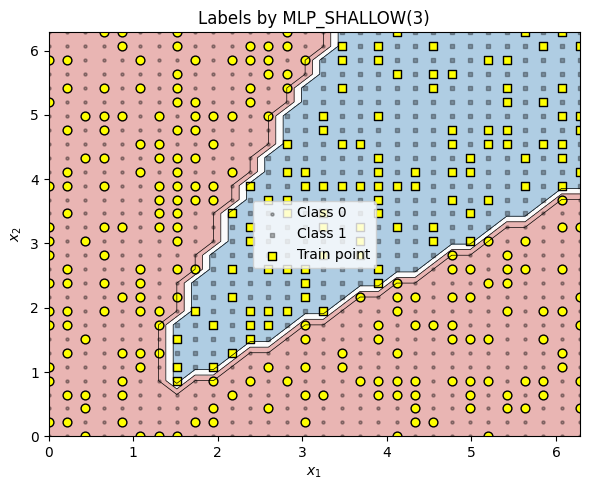

Training MLP_SHALLOW(1) on data from MLP_SHALLOW(3)
Time taken: 1.65 seconds


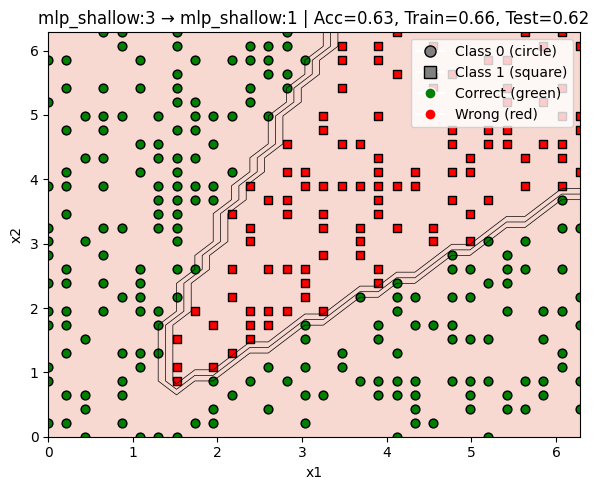

Training MLP_DEEP(1) on data from MLP_SHALLOW(3)
Time taken: 3.54 seconds


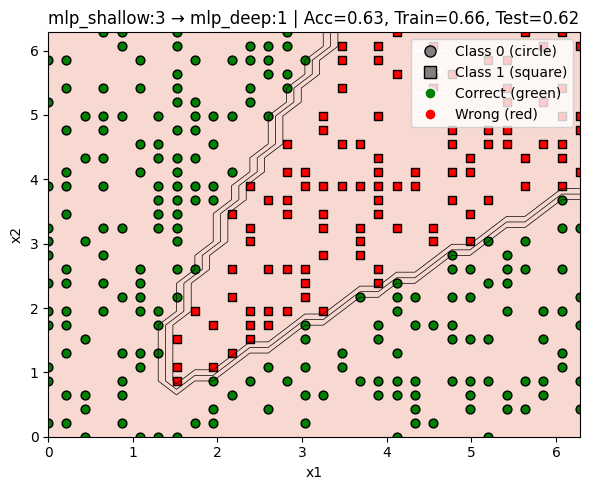

Training MLP_SHALLOW(2) on data from MLP_SHALLOW(3)
Time taken: 1.63 seconds


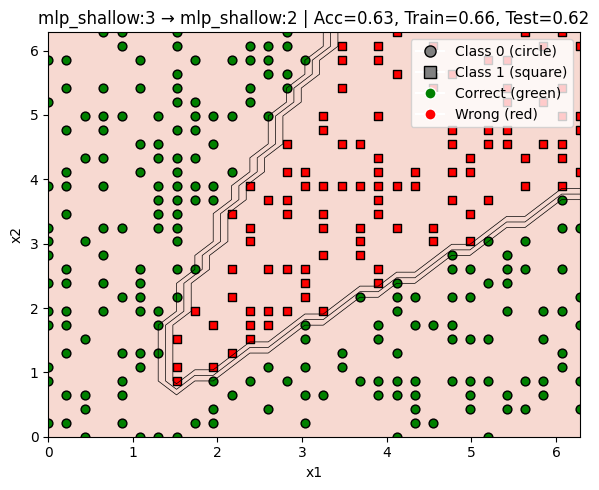

Training MLP_DEEP(2) on data from MLP_SHALLOW(3)
Time taken: 3.53 seconds


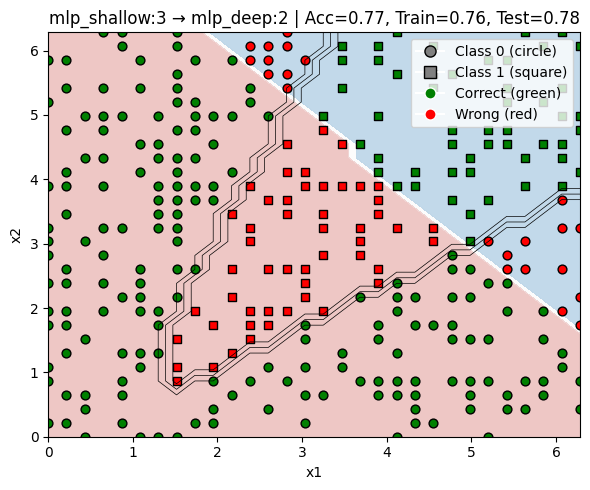

Training MLP_SHALLOW(3) on data from MLP_SHALLOW(3)
Time taken: 1.63 seconds


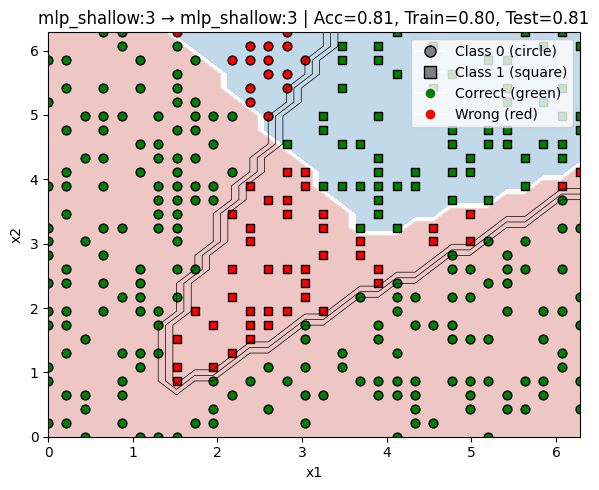

Training MLP_DEEP(3) on data from MLP_SHALLOW(3)
Time taken: 3.55 seconds


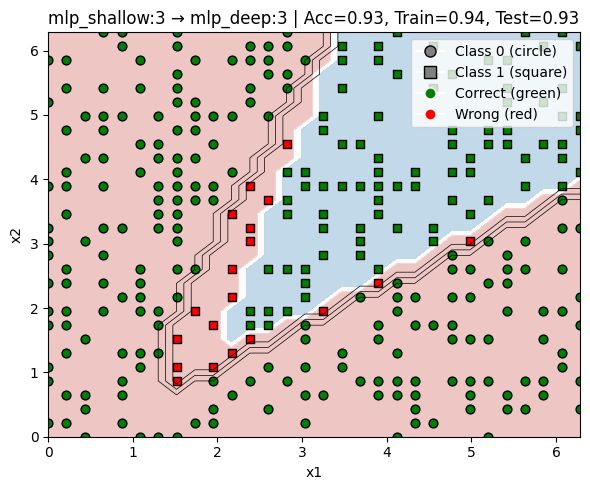

Training MLP_SHALLOW(4) on data from MLP_SHALLOW(3)
Time taken: 1.65 seconds


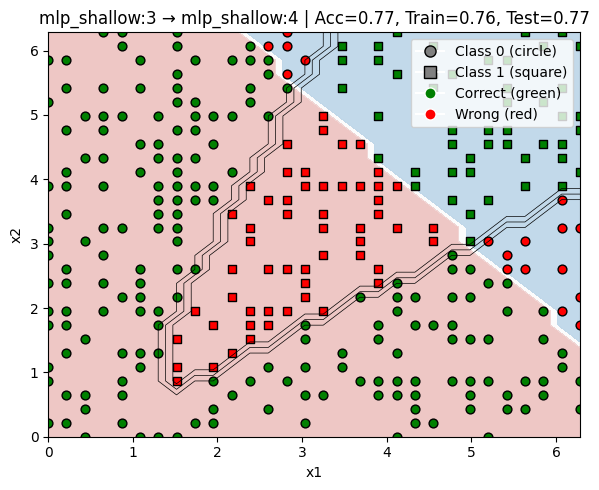

Training MLP_DEEP(4) on data from MLP_SHALLOW(3)
Time taken: 3.62 seconds


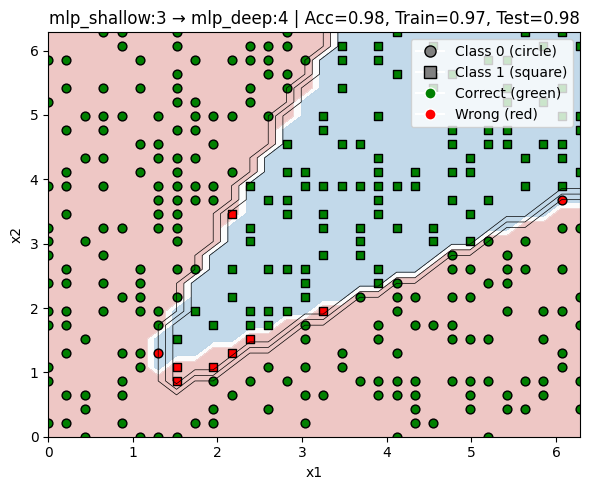

Training PQC(1) on data from MLP_SHALLOW(3)
Time taken: 78.46 seconds


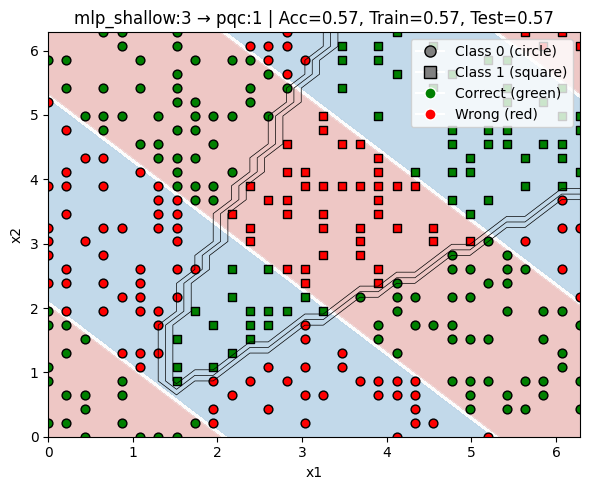

Training PQC(2) on data from MLP_SHALLOW(3)
Time taken: 170.46 seconds


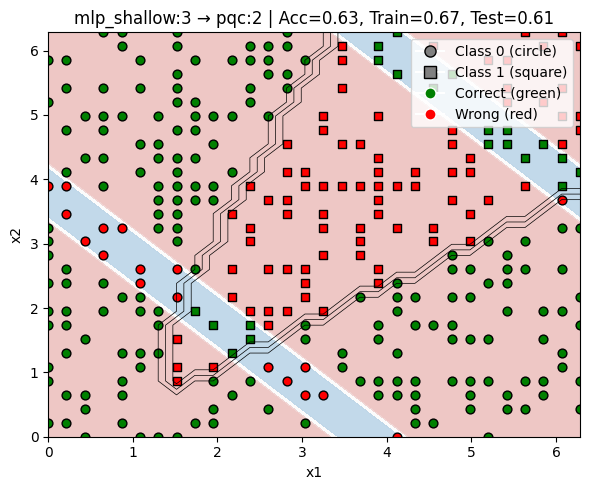

Training PQC(3) on data from MLP_SHALLOW(3)
Time taken: 255.83 seconds


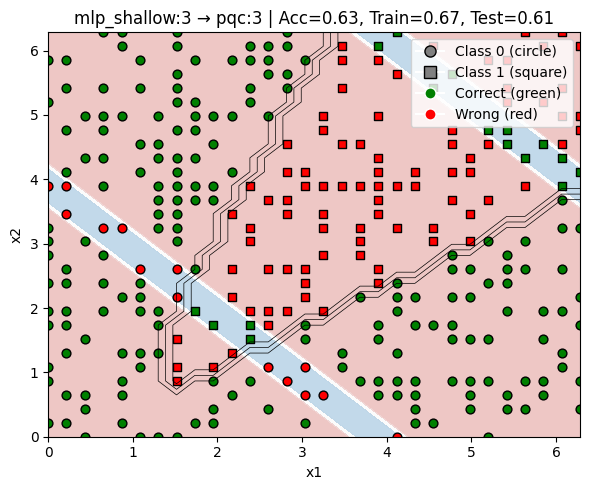

Training PQC(4) on data from MLP_SHALLOW(3)
Time taken: 349.12 seconds


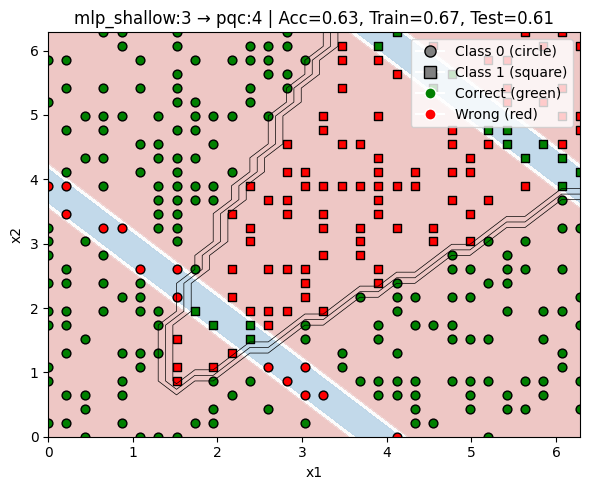

Generators:  42%|████▏     | 5/12 [1:23:40<1:50:09, 944.23s/it]

Classical MLP used to generate data (width=3, depth=3):
Sequential(
  (0): Linear(in_features=2, out_features=3, bias=True)
  (1): ReLU()
  (2): Linear(in_features=3, out_features=3, bias=True)
  (3): ReLU()
  (4): Linear(in_features=3, out_features=3, bias=True)
  (5): ReLU()
  (6): Linear(in_features=3, out_features=1, bias=True)
)
Layer (type:depth-idx)                   Param #
├─Linear: 1-1                            9
├─ReLU: 1-2                              --
├─Linear: 1-3                            12
├─ReLU: 1-4                              --
├─Linear: 1-5                            12
├─ReLU: 1-6                              --
├─Linear: 1-7                            4
Total params: 37
Trainable params: 37
Non-trainable params: 0


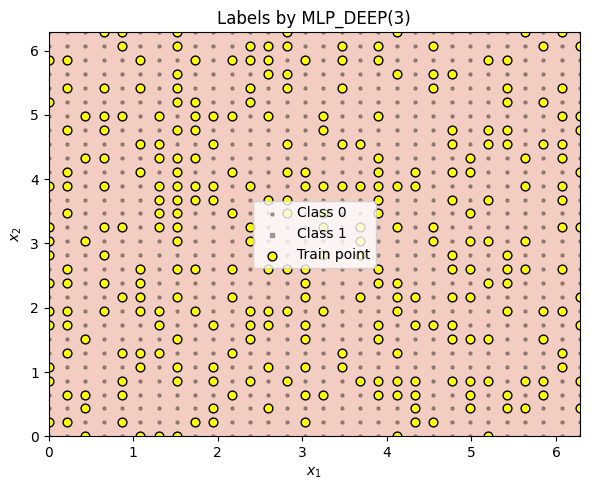

Training MLP_SHALLOW(1) on data from MLP_DEEP(3)
Time taken: 1.68 seconds


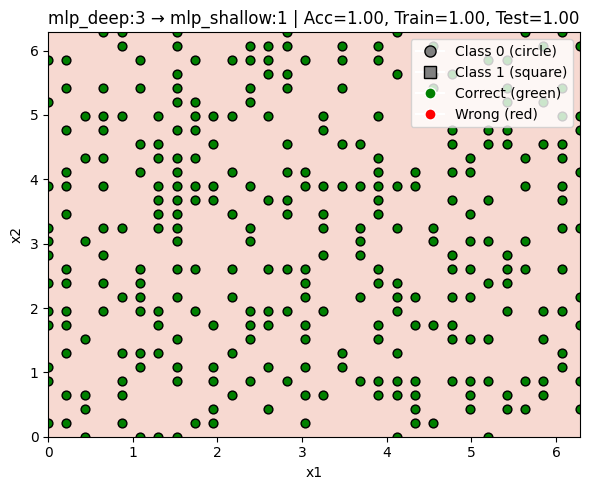

Training MLP_DEEP(1) on data from MLP_DEEP(3)
Time taken: 3.54 seconds


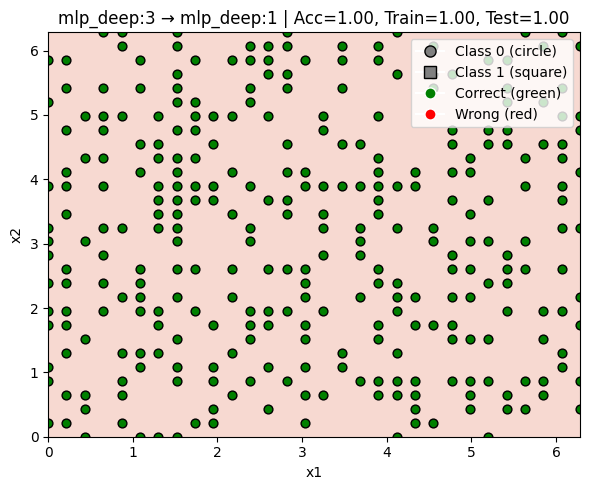

Training MLP_SHALLOW(2) on data from MLP_DEEP(3)
Time taken: 1.65 seconds


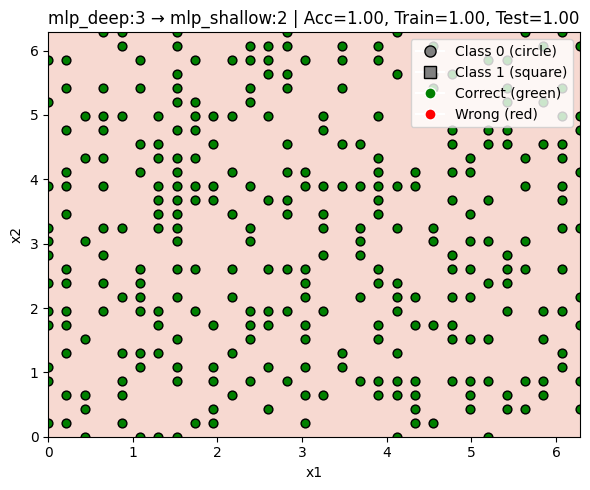

Training MLP_DEEP(2) on data from MLP_DEEP(3)
Time taken: 3.51 seconds


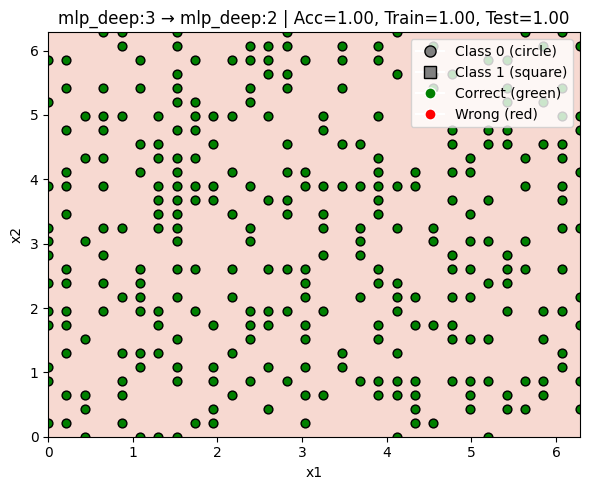

Training MLP_SHALLOW(3) on data from MLP_DEEP(3)
Time taken: 1.64 seconds


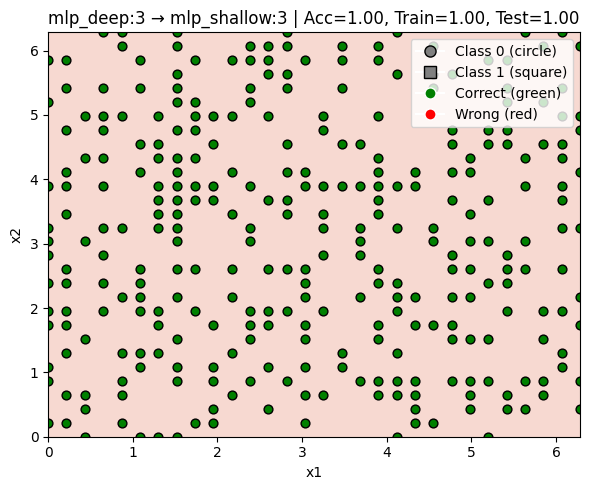

Training MLP_DEEP(3) on data from MLP_DEEP(3)
Time taken: 3.54 seconds


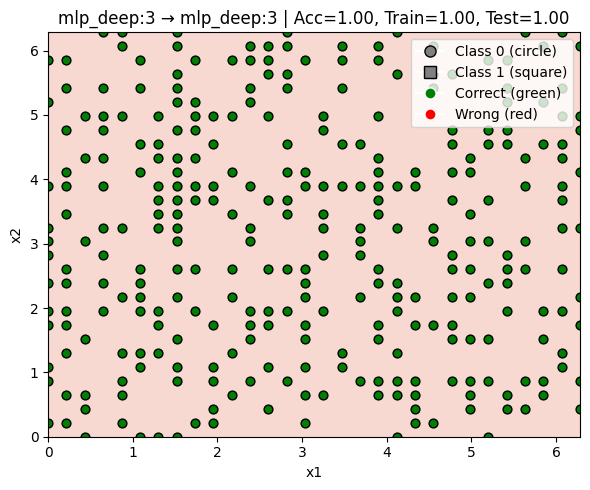

Training MLP_SHALLOW(4) on data from MLP_DEEP(3)
Time taken: 1.63 seconds


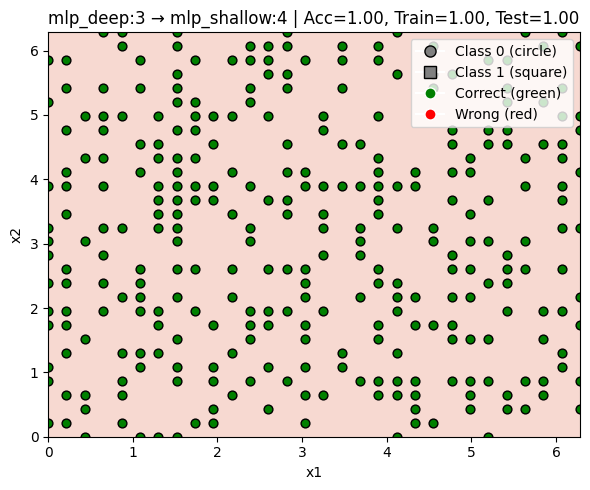

Training MLP_DEEP(4) on data from MLP_DEEP(3)
Time taken: 3.62 seconds


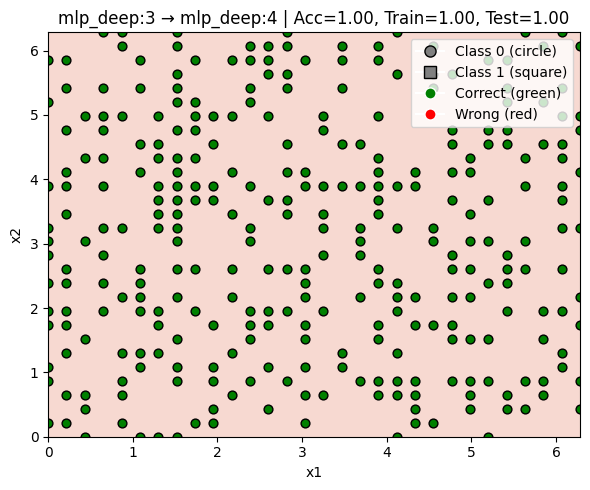

Training PQC(1) on data from MLP_DEEP(3)
Time taken: 78.40 seconds


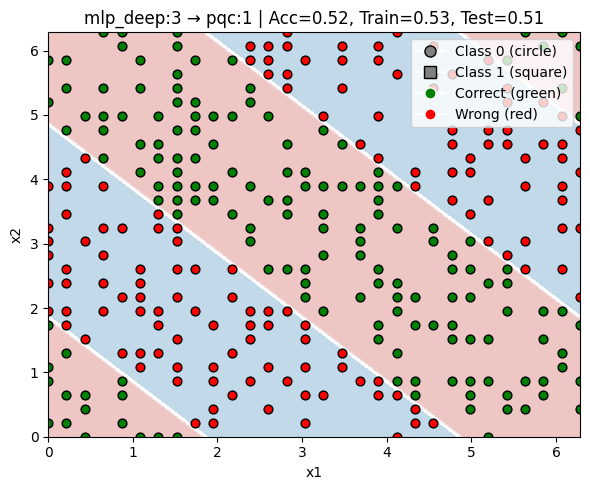

Training PQC(2) on data from MLP_DEEP(3)
Time taken: 170.99 seconds


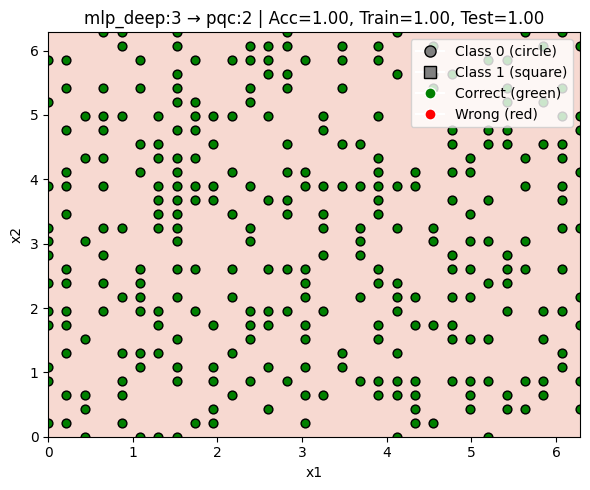

Training PQC(3) on data from MLP_DEEP(3)
Time taken: 256.60 seconds


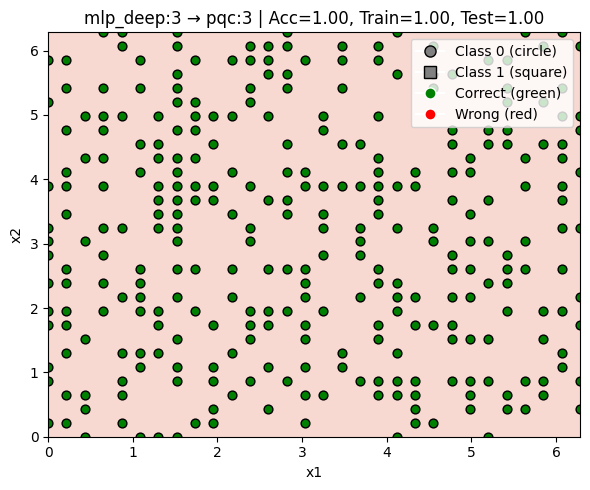

Training PQC(4) on data from MLP_DEEP(3)
Time taken: 348.08 seconds


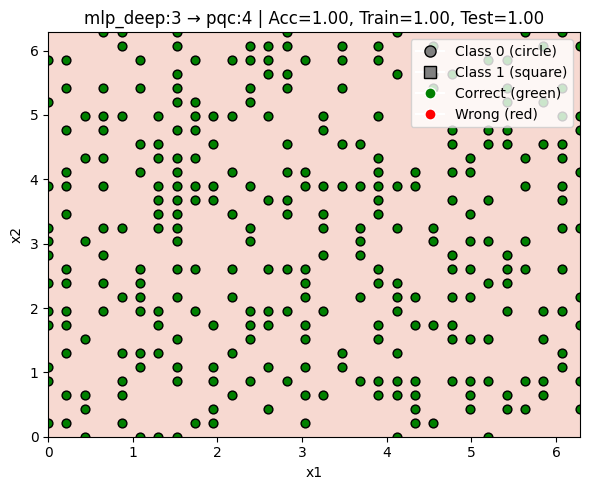

Generators:  50%|█████     | 6/12 [1:38:26<1:32:27, 924.52s/it]

Classical MLP used to generate data (width=4, depth=1):
Sequential(
  (0): Linear(in_features=2, out_features=12, bias=True)
  (1): ReLU()
  (2): Linear(in_features=12, out_features=1, bias=True)
)
Layer (type:depth-idx)                   Param #
├─Linear: 1-1                            36
├─ReLU: 1-2                              --
├─Linear: 1-3                            13
Total params: 49
Trainable params: 49
Non-trainable params: 0


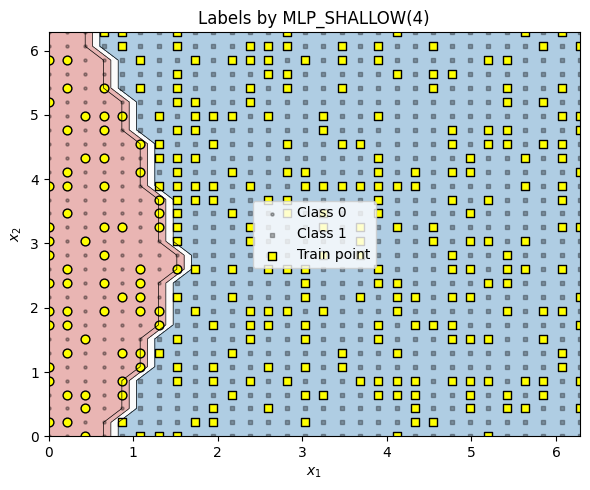

Training MLP_SHALLOW(1) on data from MLP_SHALLOW(4)
Time taken: 1.66 seconds


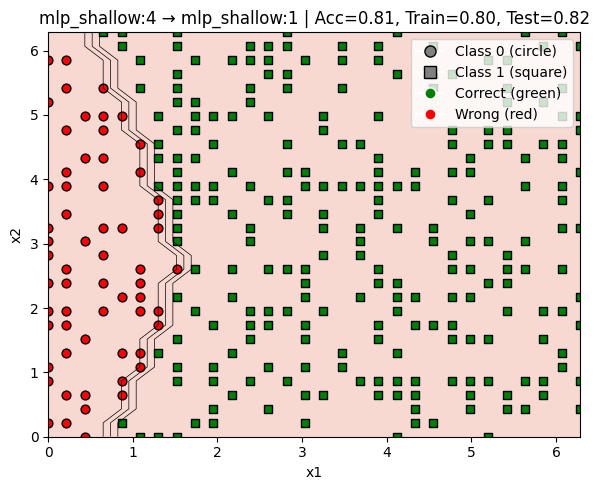

Training MLP_DEEP(1) on data from MLP_SHALLOW(4)
Time taken: 3.59 seconds


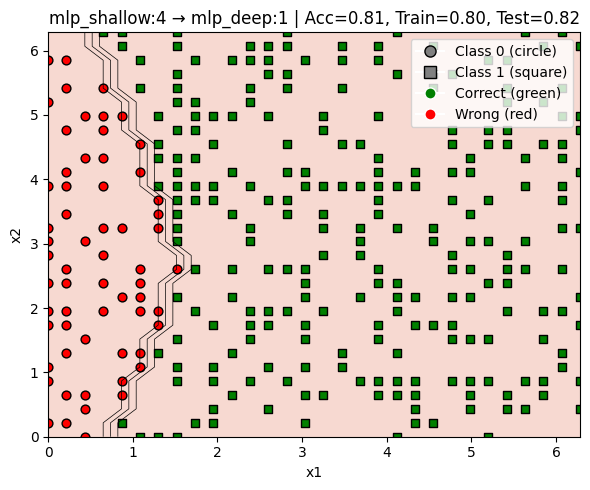

Training MLP_SHALLOW(2) on data from MLP_SHALLOW(4)
Time taken: 1.71 seconds


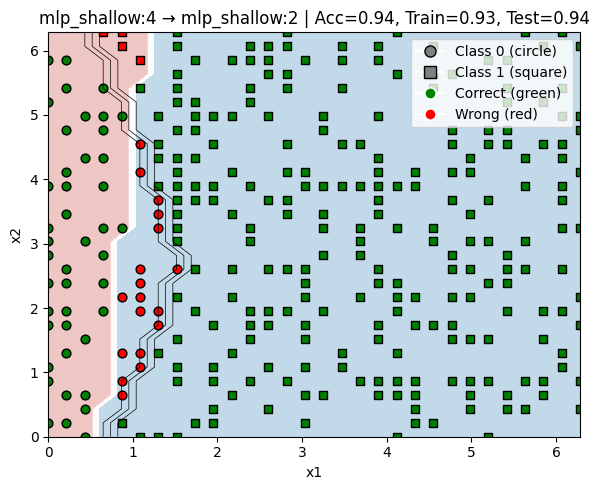

Training MLP_DEEP(2) on data from MLP_SHALLOW(4)
Time taken: 3.57 seconds


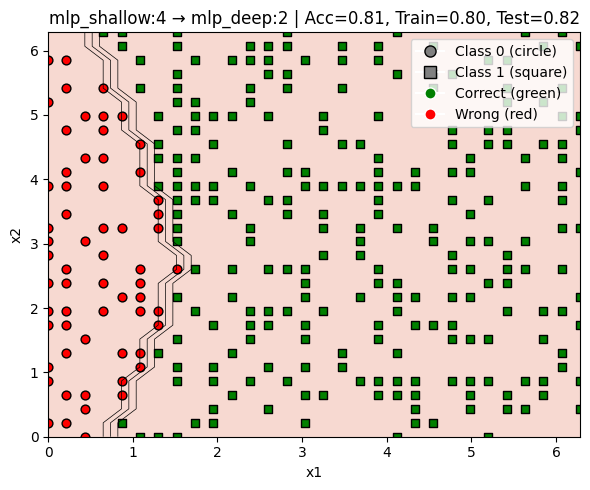

Training MLP_SHALLOW(3) on data from MLP_SHALLOW(4)
Time taken: 1.71 seconds


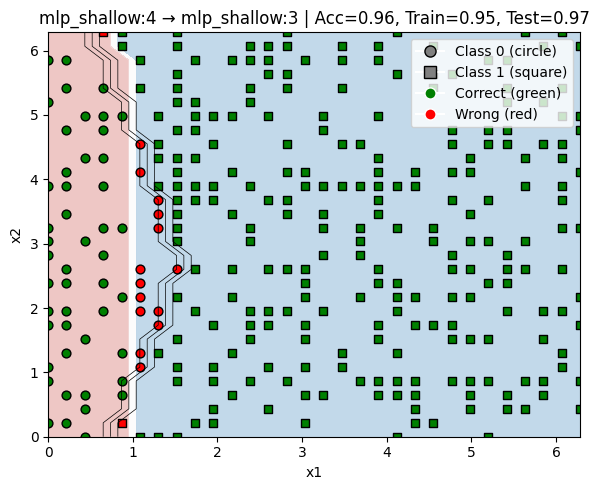

Training MLP_DEEP(3) on data from MLP_SHALLOW(4)
Time taken: 3.51 seconds


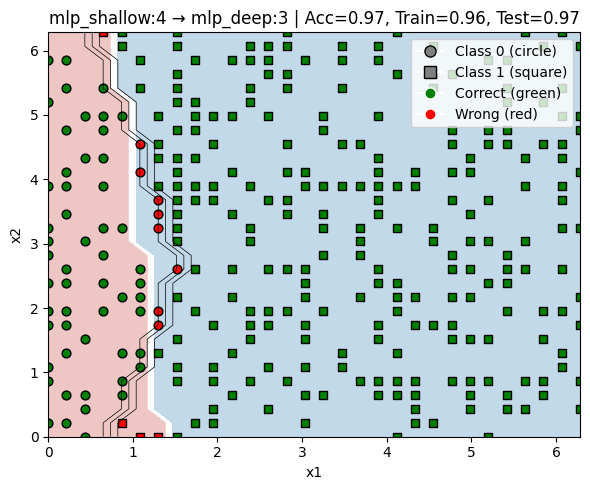

Training MLP_SHALLOW(4) on data from MLP_SHALLOW(4)
Time taken: 1.65 seconds


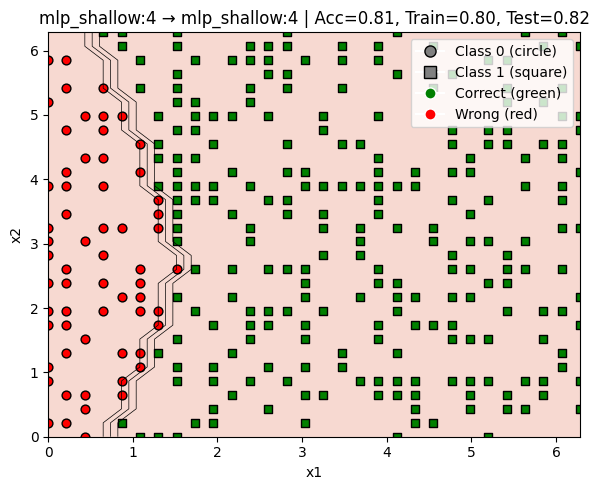

Training MLP_DEEP(4) on data from MLP_SHALLOW(4)
Time taken: 3.63 seconds


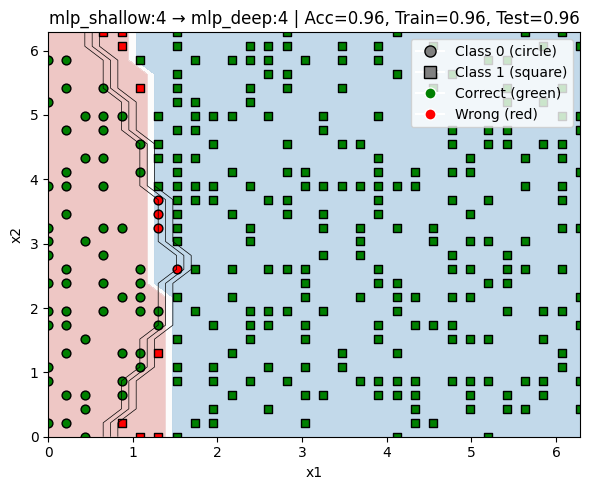

Training PQC(1) on data from MLP_SHALLOW(4)
Time taken: 78.62 seconds


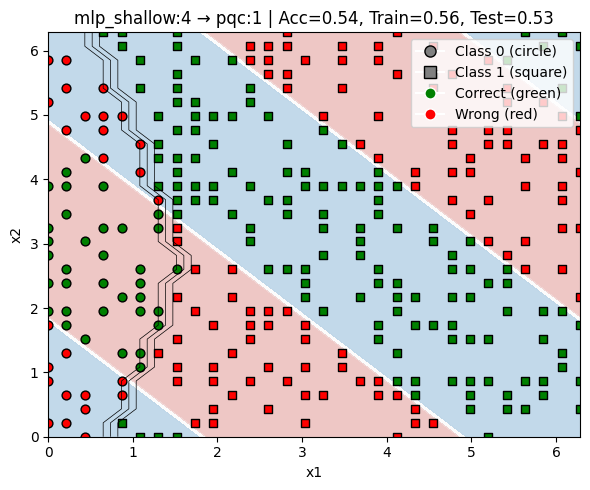

Training PQC(2) on data from MLP_SHALLOW(4)
Time taken: 171.07 seconds


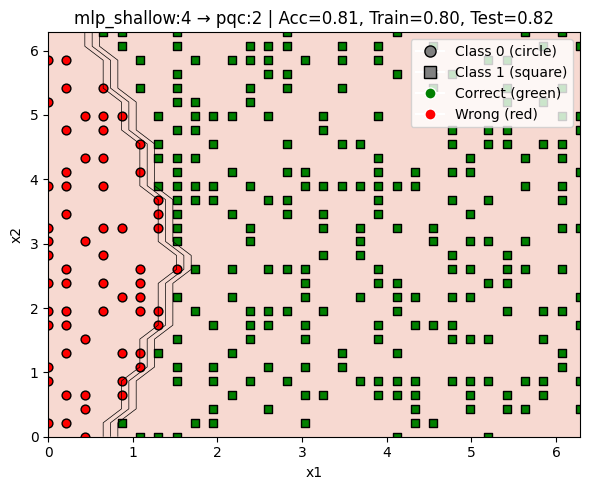

Training PQC(3) on data from MLP_SHALLOW(4)
Time taken: 255.91 seconds


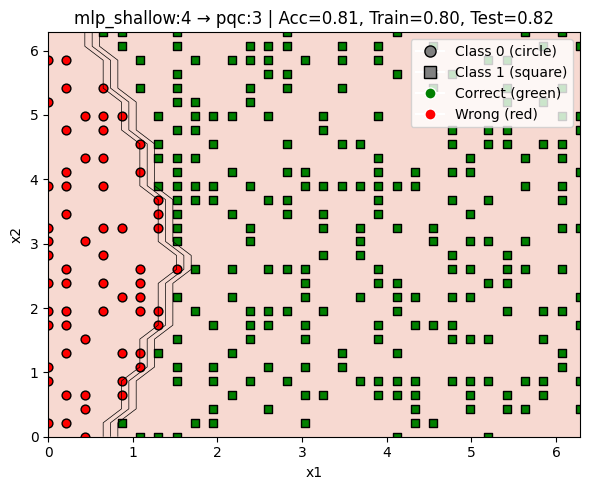

Training PQC(4) on data from MLP_SHALLOW(4)
Time taken: 347.68 seconds


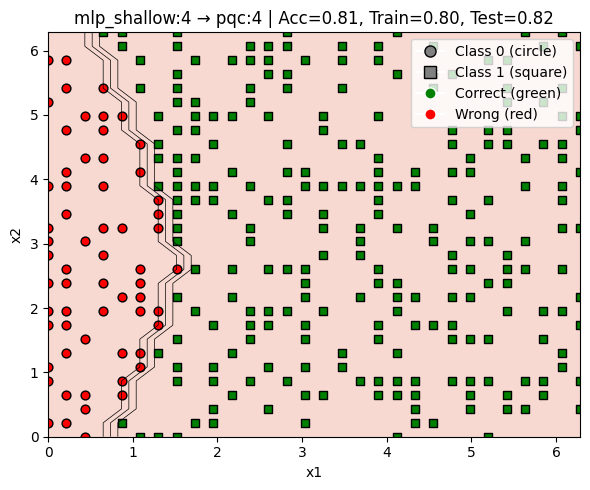

Generators:  58%|█████▊    | 7/12 [1:53:07<1:15:51, 910.29s/it]

Classical MLP used to generate data (width=4, depth=3):
Sequential(
  (0): Linear(in_features=2, out_features=3, bias=True)
  (1): ReLU()
  (2): Linear(in_features=3, out_features=3, bias=True)
  (3): ReLU()
  (4): Linear(in_features=3, out_features=3, bias=True)
  (5): ReLU()
  (6): Linear(in_features=3, out_features=1, bias=True)
)
Layer (type:depth-idx)                   Param #
├─Linear: 1-1                            9
├─ReLU: 1-2                              --
├─Linear: 1-3                            12
├─ReLU: 1-4                              --
├─Linear: 1-5                            12
├─ReLU: 1-6                              --
├─Linear: 1-7                            4
Total params: 37
Trainable params: 37
Non-trainable params: 0


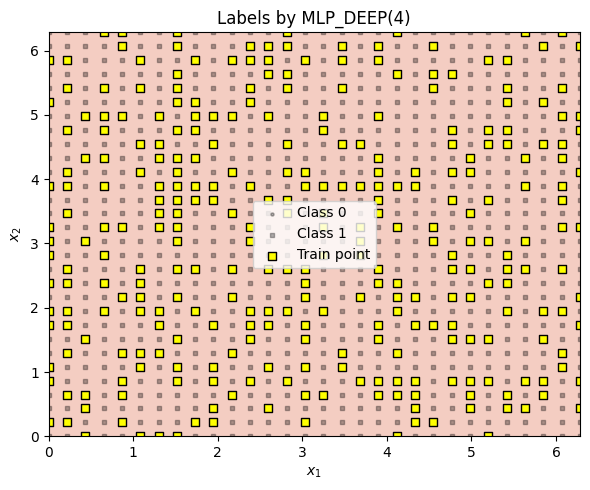

Training MLP_SHALLOW(1) on data from MLP_DEEP(4)
Time taken: 1.68 seconds


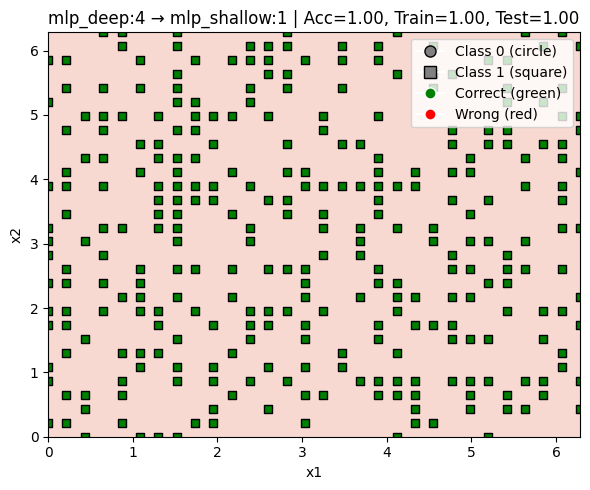

Training MLP_DEEP(1) on data from MLP_DEEP(4)
Time taken: 3.50 seconds


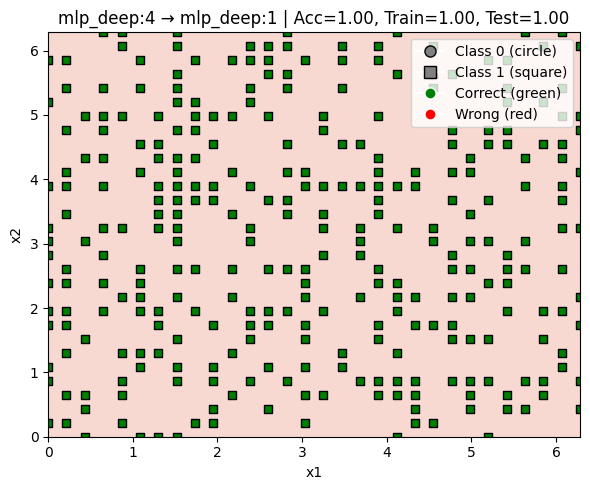

Training MLP_SHALLOW(2) on data from MLP_DEEP(4)
Time taken: 1.69 seconds


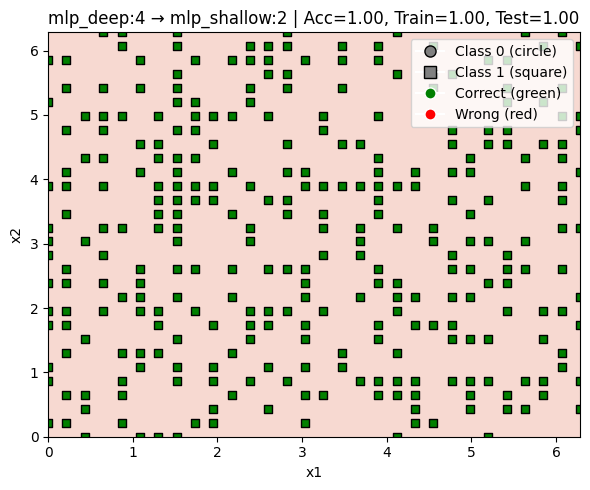

Training MLP_DEEP(2) on data from MLP_DEEP(4)
Time taken: 3.67 seconds


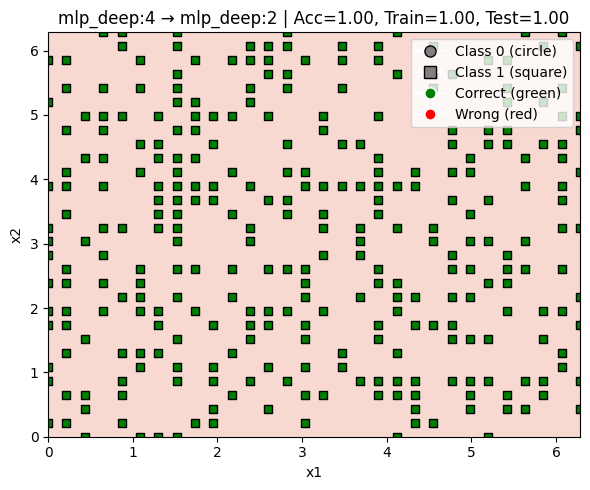

Training MLP_SHALLOW(3) on data from MLP_DEEP(4)
Time taken: 1.69 seconds


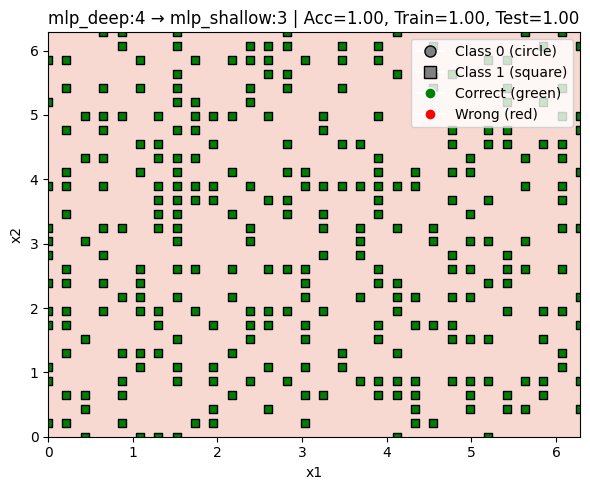

Training MLP_DEEP(3) on data from MLP_DEEP(4)
Time taken: 3.56 seconds


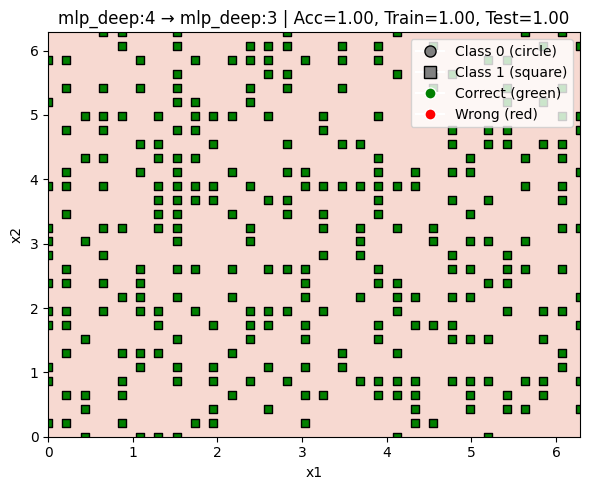

Training MLP_SHALLOW(4) on data from MLP_DEEP(4)
Time taken: 1.69 seconds


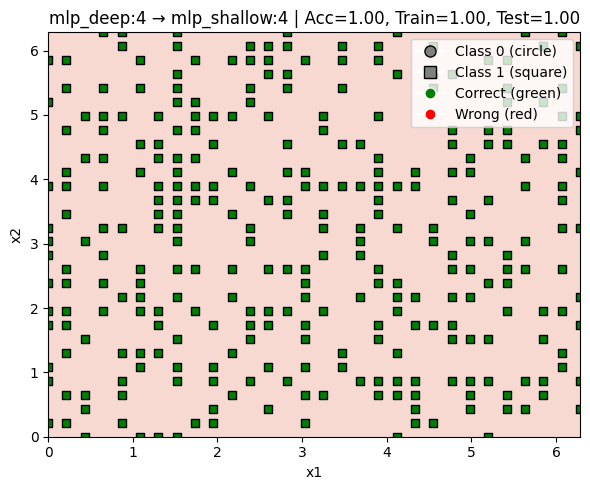

Training MLP_DEEP(4) on data from MLP_DEEP(4)
Time taken: 3.46 seconds


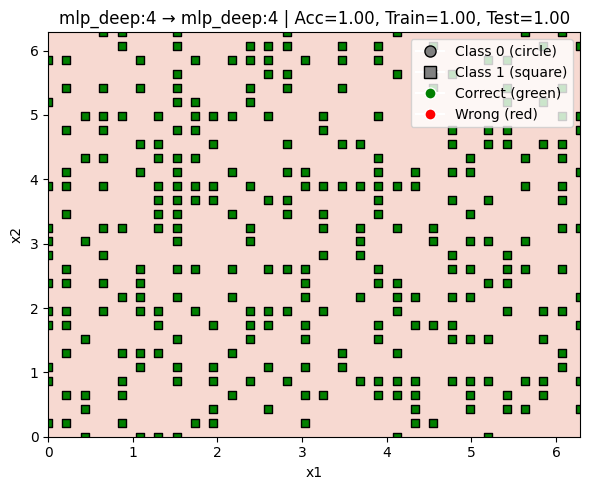

Training PQC(1) on data from MLP_DEEP(4)
Time taken: 78.06 seconds


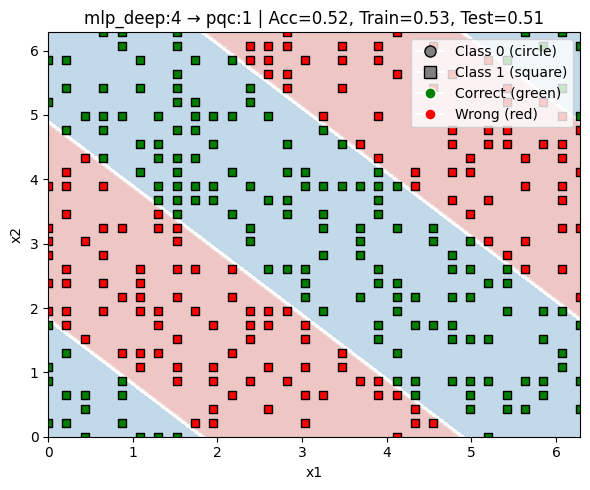

Training PQC(2) on data from MLP_DEEP(4)
Time taken: 169.98 seconds


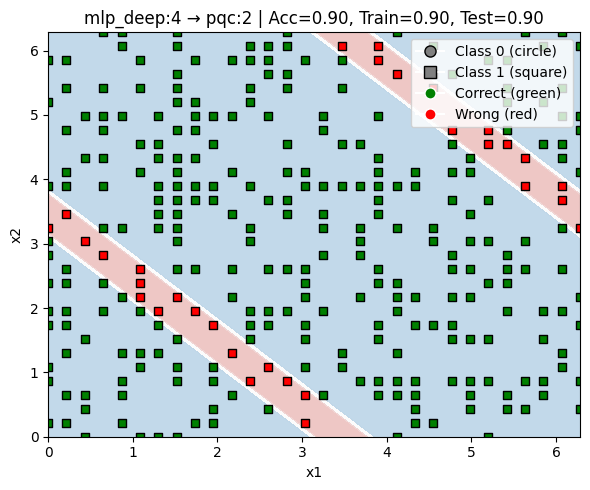

Training PQC(3) on data from MLP_DEEP(4)
Time taken: 256.36 seconds


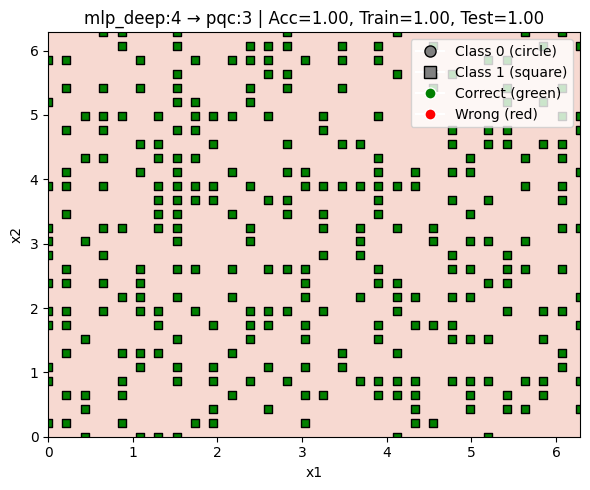

Training PQC(4) on data from MLP_DEEP(4)
Time taken: 349.48 seconds


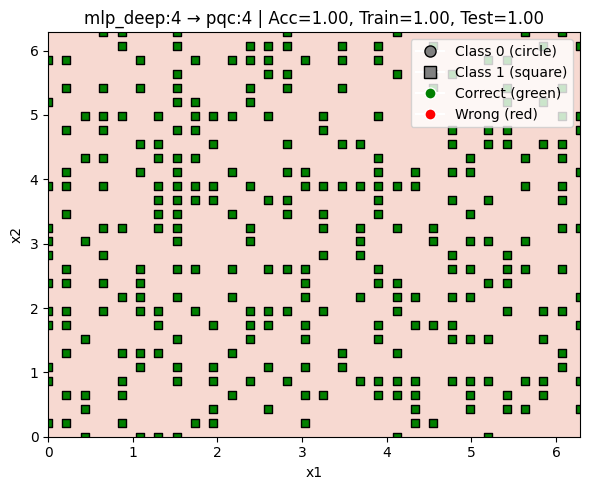

Generators:  67%|██████▋   | 8/12 [2:07:47<1:00:03, 900.79s/it]

Quantum circuit used to generate data (PQC with 1 qubits and depth 3):


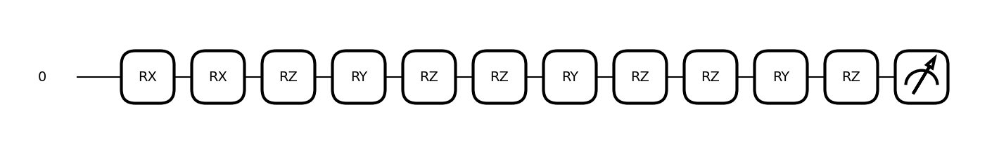

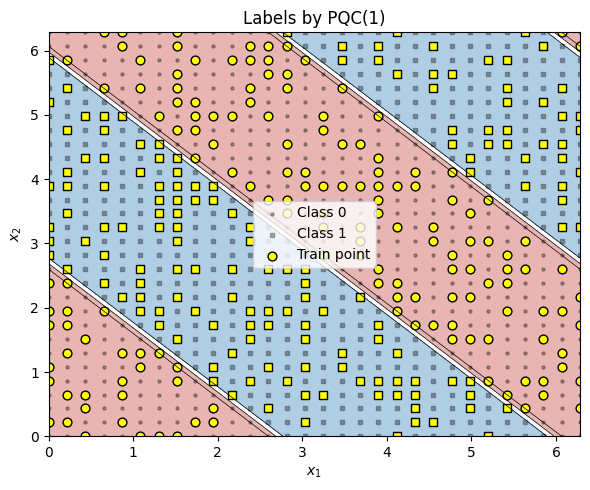

Training MLP_SHALLOW(1) on data from PQC(1)
Time taken: 1.67 seconds


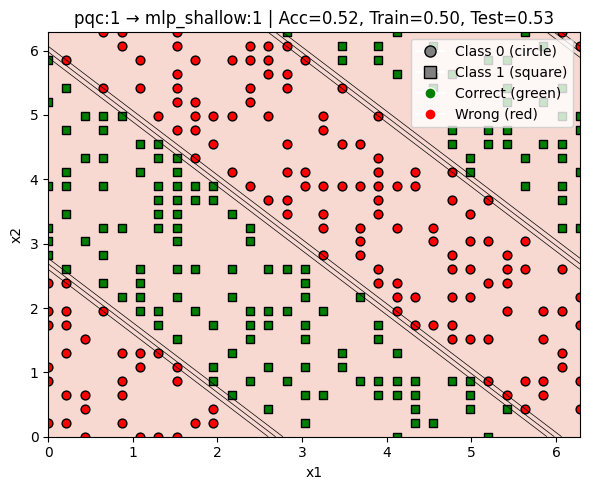

Training MLP_DEEP(1) on data from PQC(1)
Time taken: 3.67 seconds


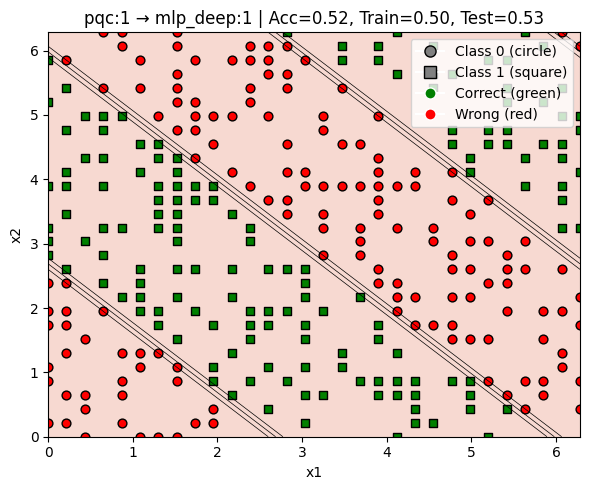

Training MLP_SHALLOW(2) on data from PQC(1)
Time taken: 1.68 seconds


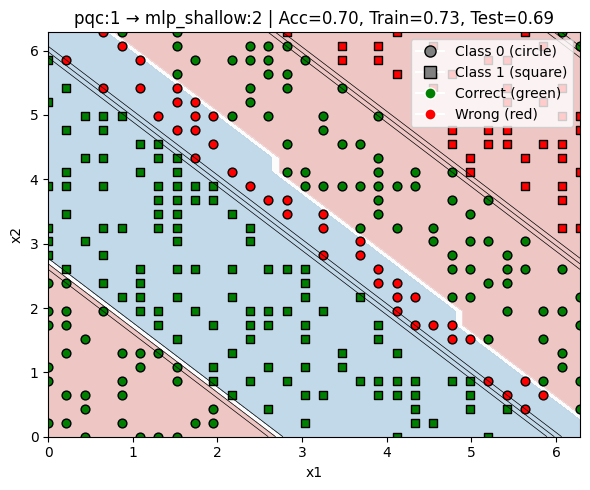

Training MLP_DEEP(2) on data from PQC(1)
Time taken: 3.57 seconds


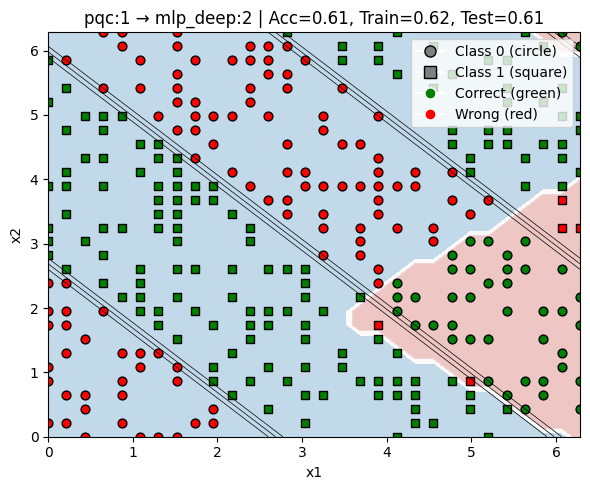

Training MLP_SHALLOW(3) on data from PQC(1)
Time taken: 1.64 seconds


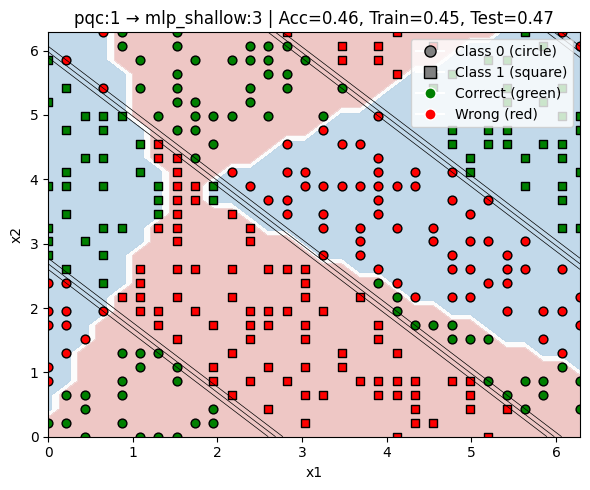

Training MLP_DEEP(3) on data from PQC(1)
Time taken: 3.57 seconds


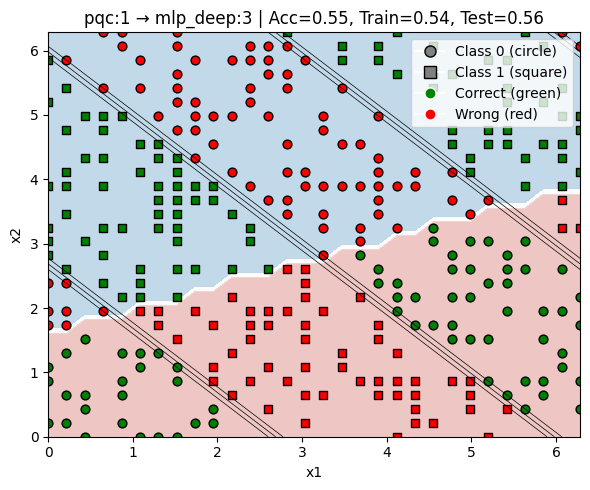

Training MLP_SHALLOW(4) on data from PQC(1)
Time taken: 1.65 seconds


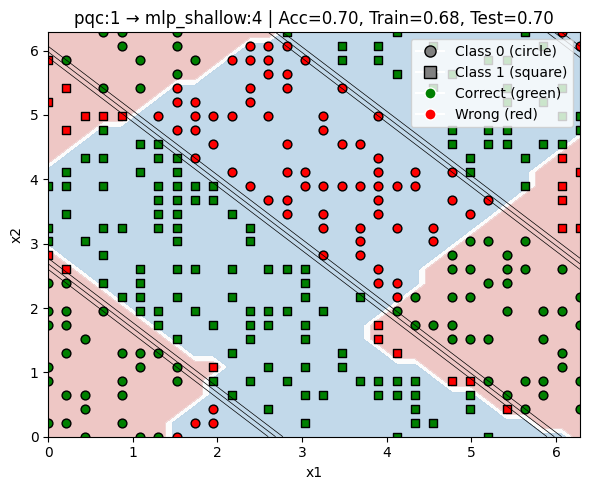

Training MLP_DEEP(4) on data from PQC(1)
Time taken: 3.62 seconds


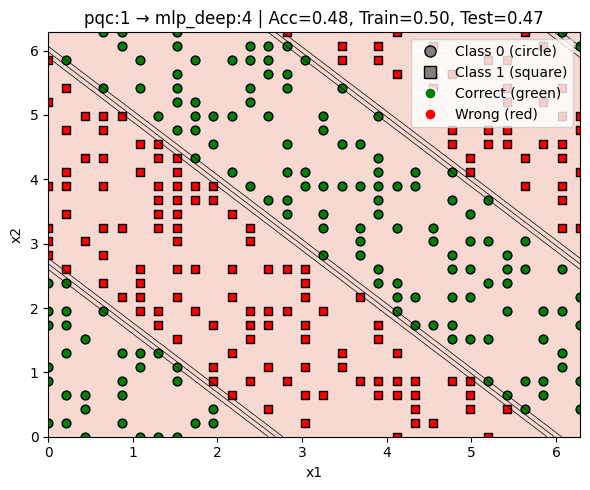

Training PQC(1) on data from PQC(1)
Time taken: 78.93 seconds


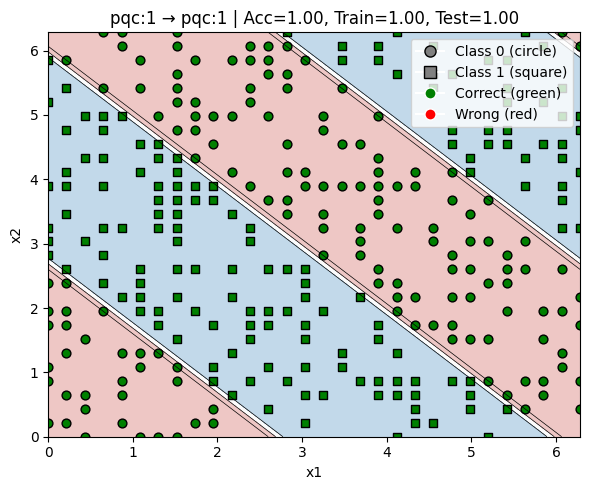

Training PQC(2) on data from PQC(1)
Time taken: 170.94 seconds


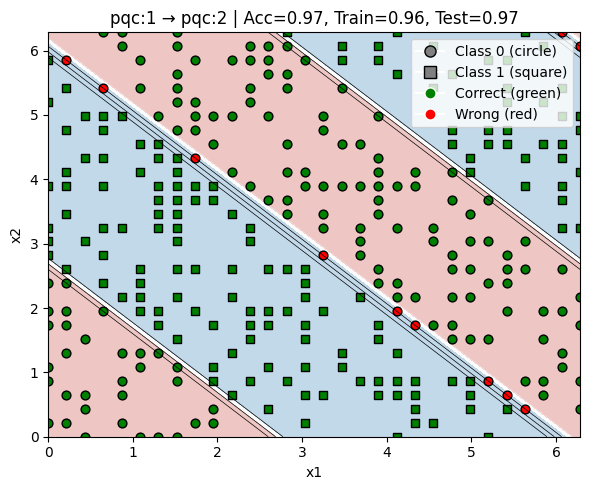

Training PQC(3) on data from PQC(1)
Time taken: 255.72 seconds


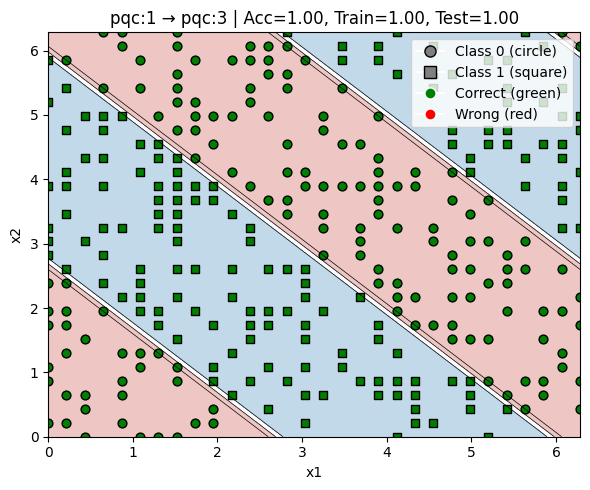

Training PQC(4) on data from PQC(1)
Time taken: 348.32 seconds


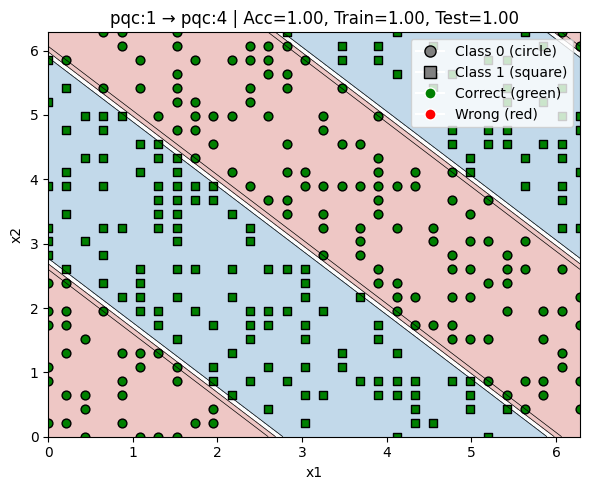

Generators:  75%|███████▌  | 9/12 [2:22:32<44:47, 895.87s/it]  

Quantum circuit used to generate data (PQC with 2 qubits and depth 3):


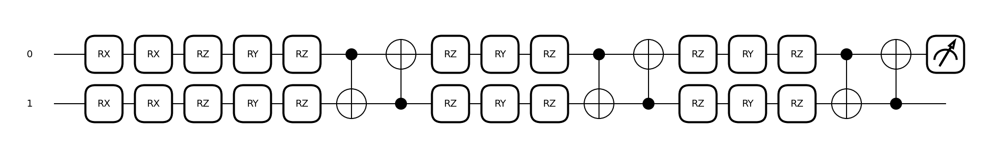

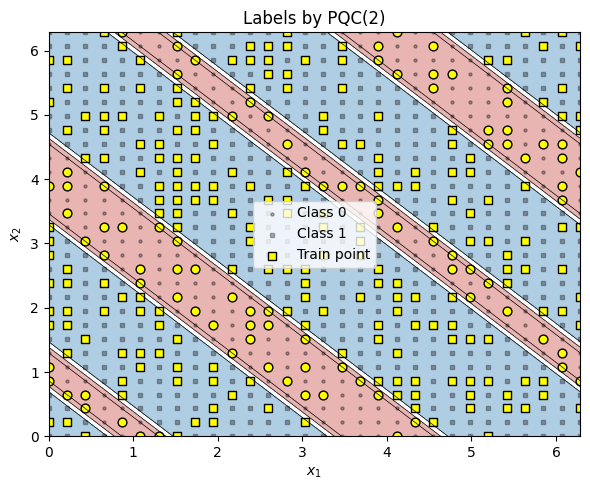

Training MLP_SHALLOW(1) on data from PQC(2)
Time taken: 1.68 seconds


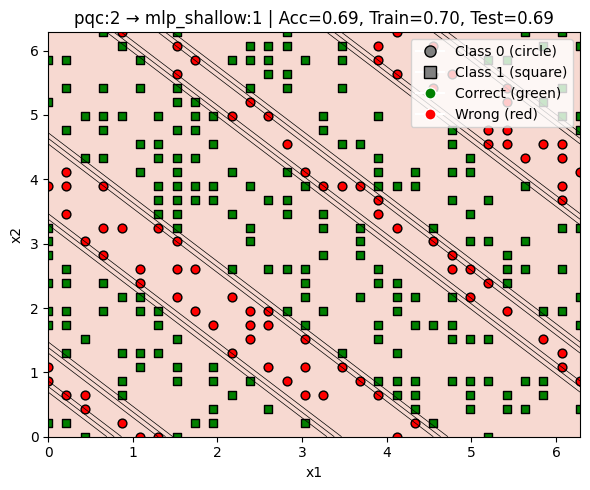

Training MLP_DEEP(1) on data from PQC(2)
Time taken: 3.58 seconds


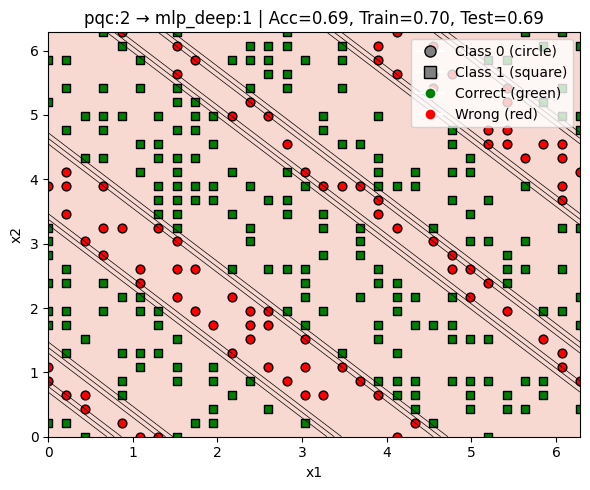

Training MLP_SHALLOW(2) on data from PQC(2)
Time taken: 1.68 seconds


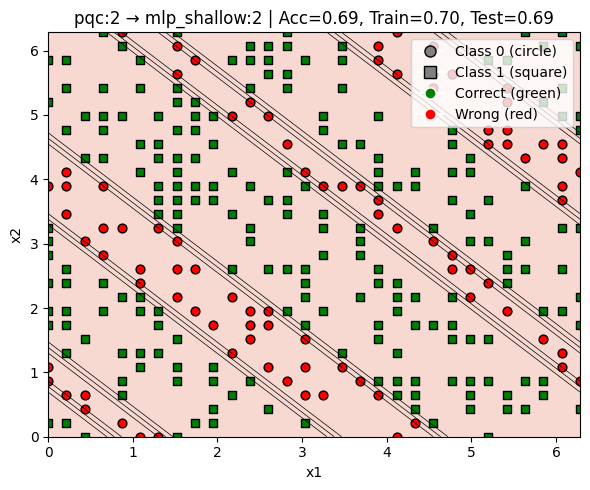

Training MLP_DEEP(2) on data from PQC(2)
Time taken: 3.60 seconds


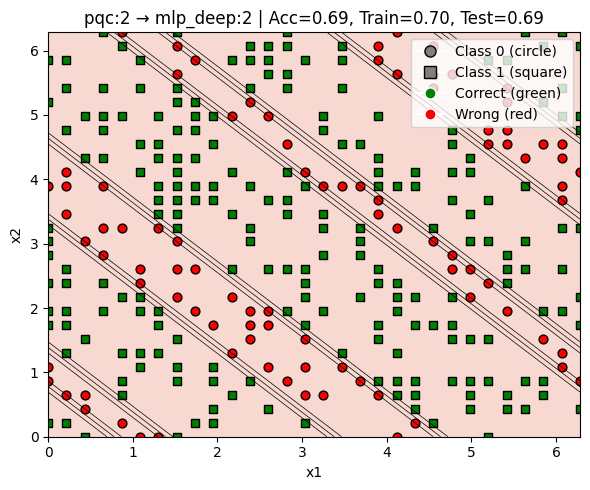

Training MLP_SHALLOW(3) on data from PQC(2)
Time taken: 1.68 seconds


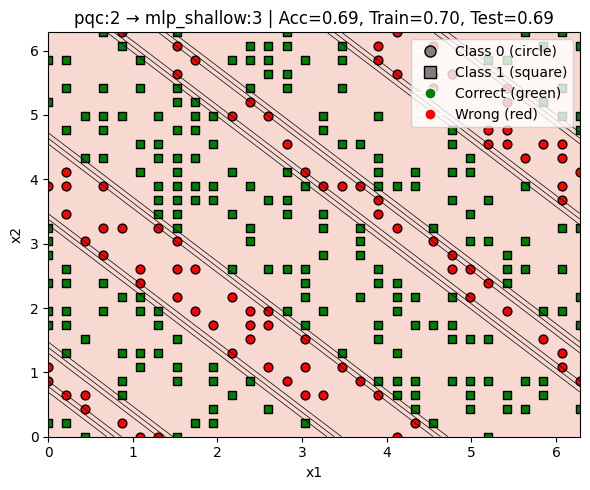

Training MLP_DEEP(3) on data from PQC(2)
Time taken: 3.56 seconds


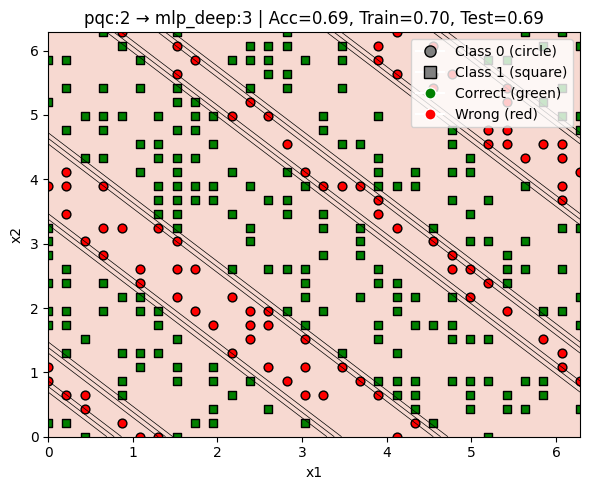

Training MLP_SHALLOW(4) on data from PQC(2)
Time taken: 1.67 seconds


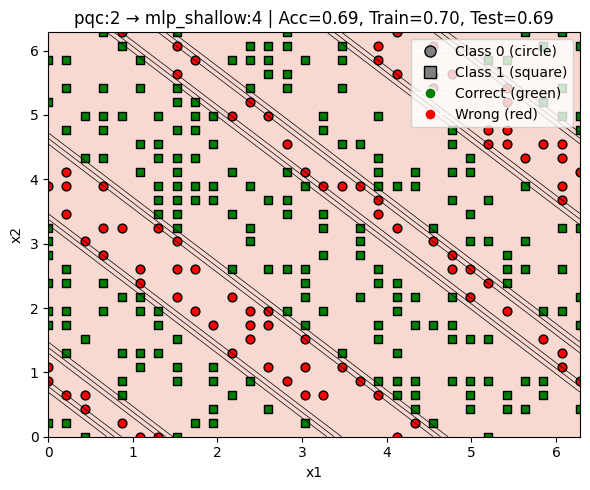

Training MLP_DEEP(4) on data from PQC(2)
Time taken: 3.57 seconds


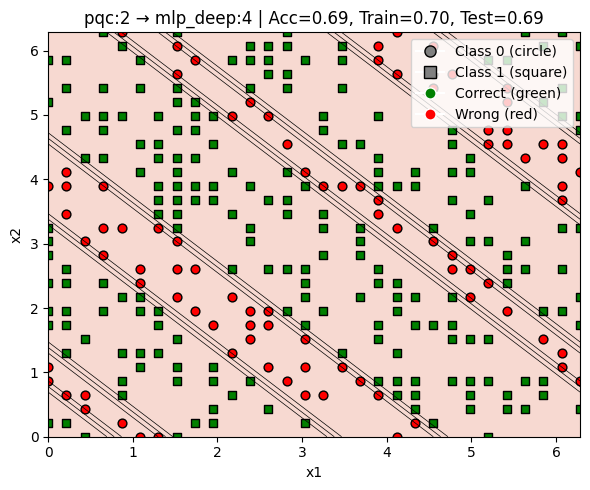

Training PQC(1) on data from PQC(2)
Time taken: 78.54 seconds


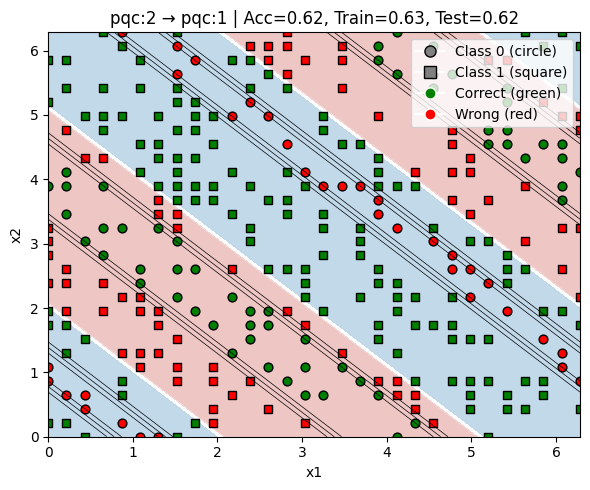

Training PQC(2) on data from PQC(2)
Time taken: 170.71 seconds


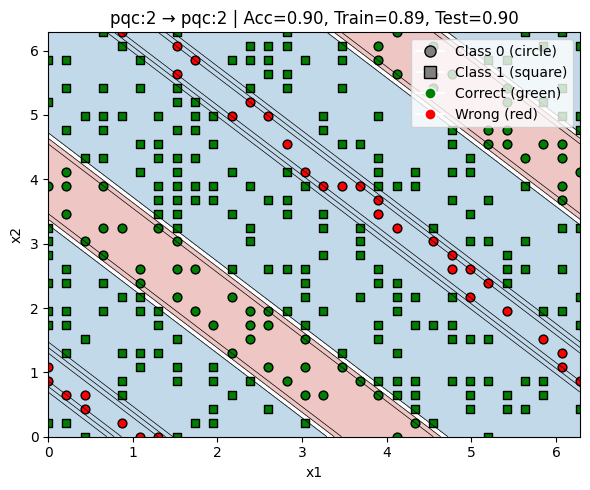

Training PQC(3) on data from PQC(2)
Time taken: 256.44 seconds


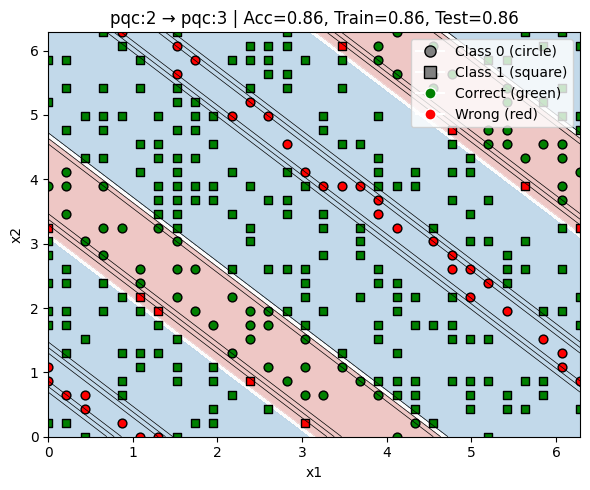

Training PQC(4) on data from PQC(2)
Time taken: 349.05 seconds


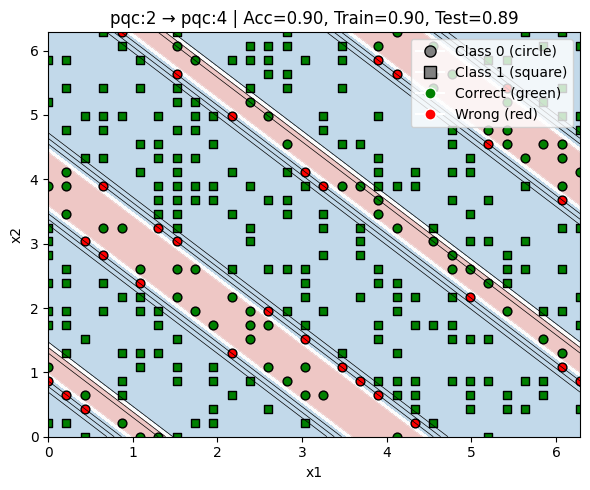

Generators:  83%|████████▎ | 10/12 [2:37:19<29:46, 893.04s/it]

Quantum circuit used to generate data (PQC with 3 qubits and depth 3):


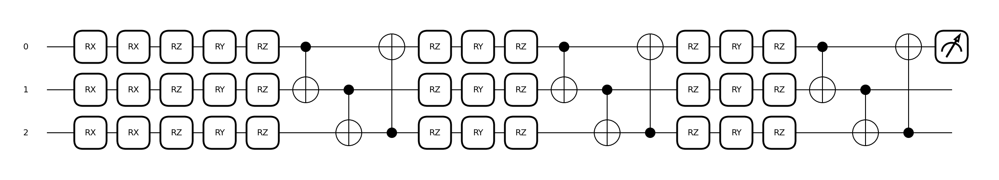

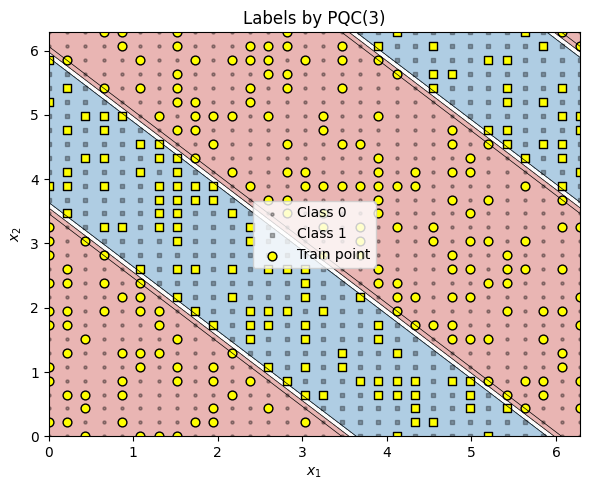

Training MLP_SHALLOW(1) on data from PQC(3)
Time taken: 1.81 seconds


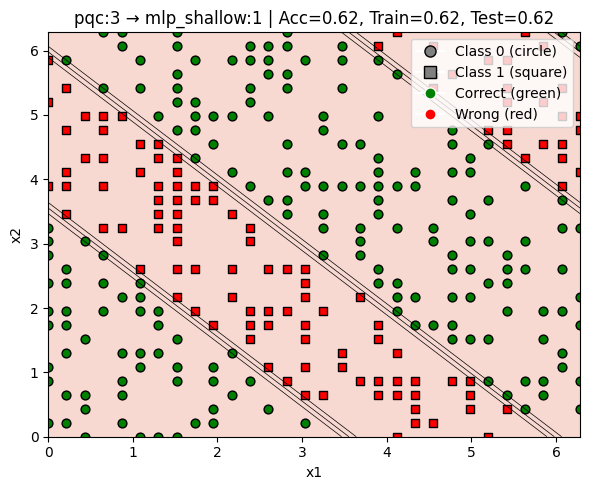

Training MLP_DEEP(1) on data from PQC(3)
Time taken: 3.56 seconds


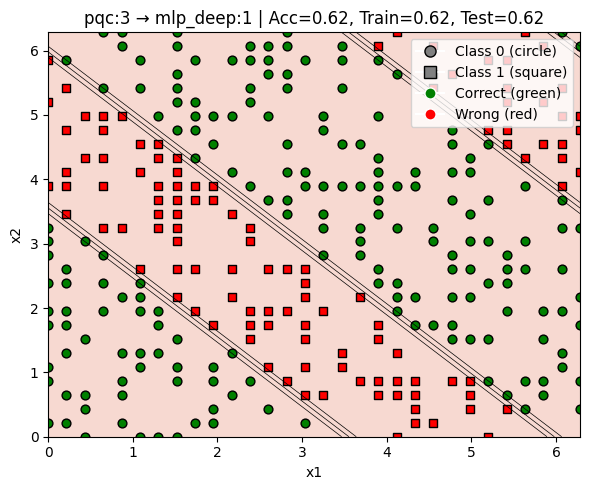

Training MLP_SHALLOW(2) on data from PQC(3)
Time taken: 1.70 seconds


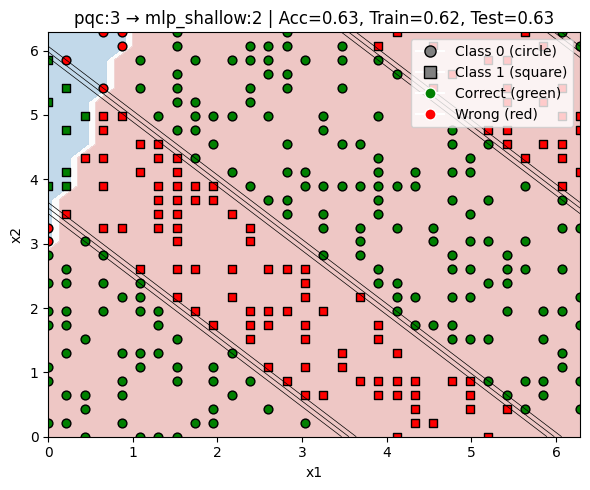

Training MLP_DEEP(2) on data from PQC(3)
Time taken: 3.58 seconds


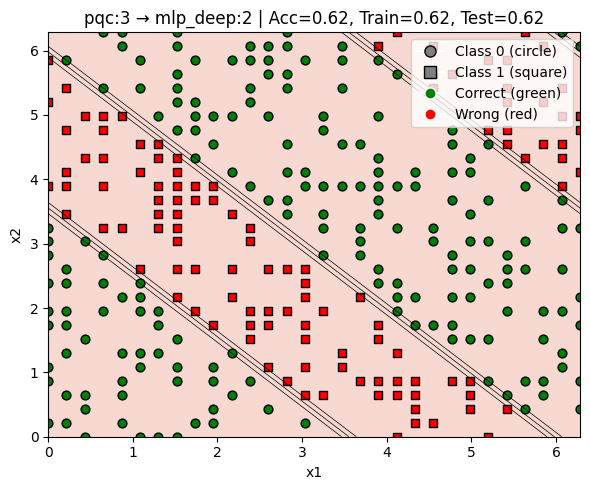

Training MLP_SHALLOW(3) on data from PQC(3)
Time taken: 1.70 seconds


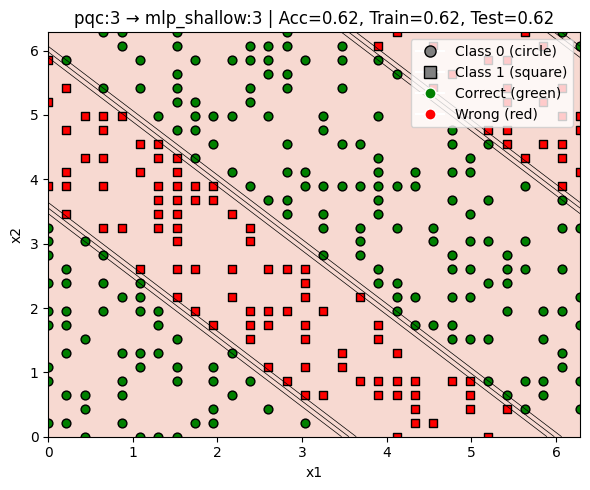

Training MLP_DEEP(3) on data from PQC(3)
Time taken: 3.61 seconds


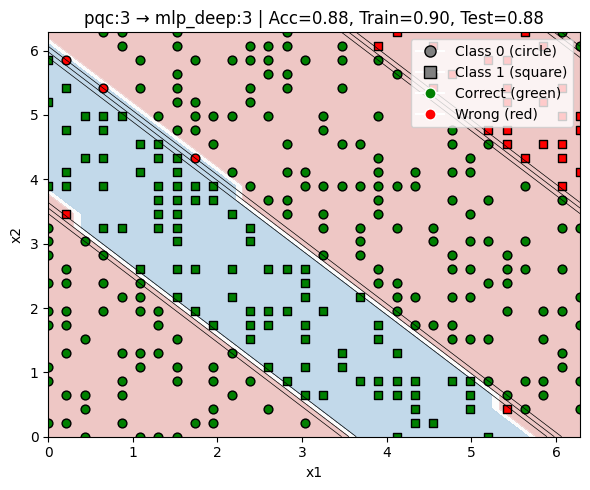

Training MLP_SHALLOW(4) on data from PQC(3)
Time taken: 1.70 seconds


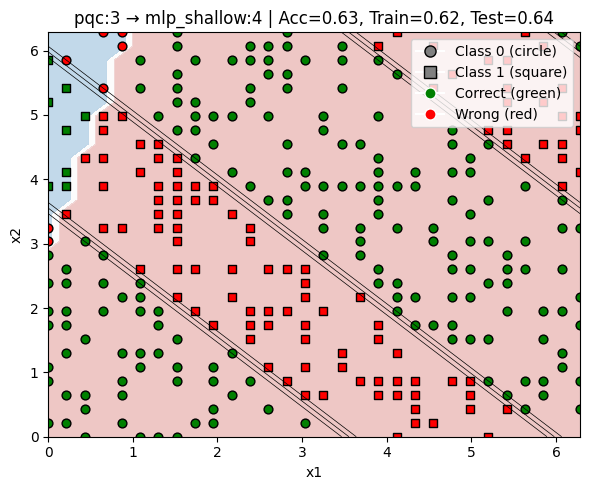

Training MLP_DEEP(4) on data from PQC(3)
Time taken: 3.62 seconds


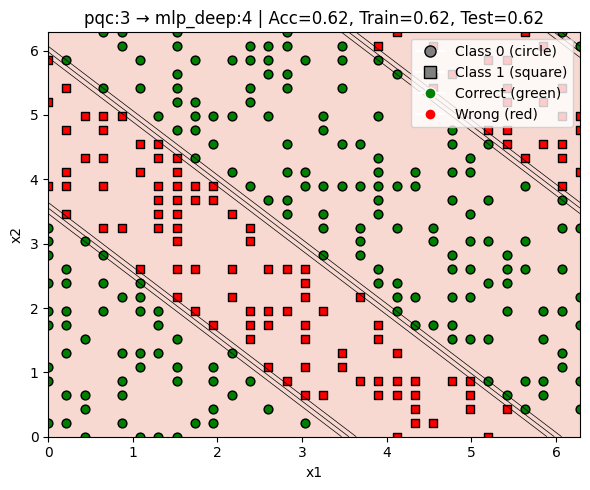

Training PQC(1) on data from PQC(3)
Time taken: 78.31 seconds


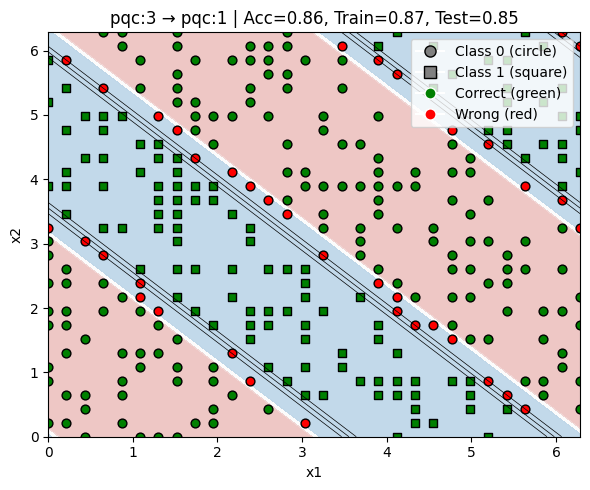

Training PQC(2) on data from PQC(3)
Time taken: 170.39 seconds


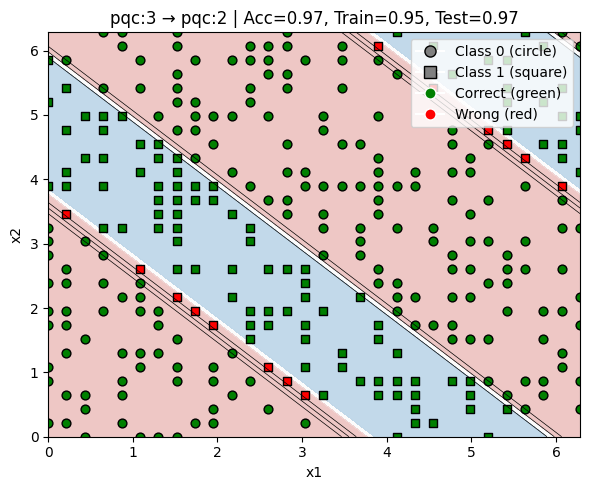

Training PQC(3) on data from PQC(3)
Time taken: 255.35 seconds


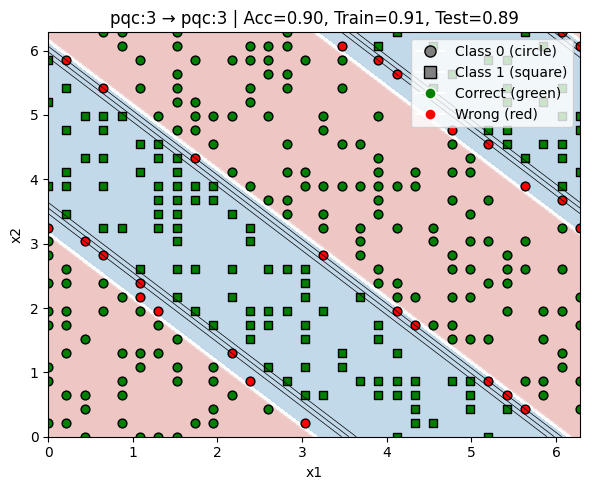

Training PQC(4) on data from PQC(3)
Time taken: 348.50 seconds


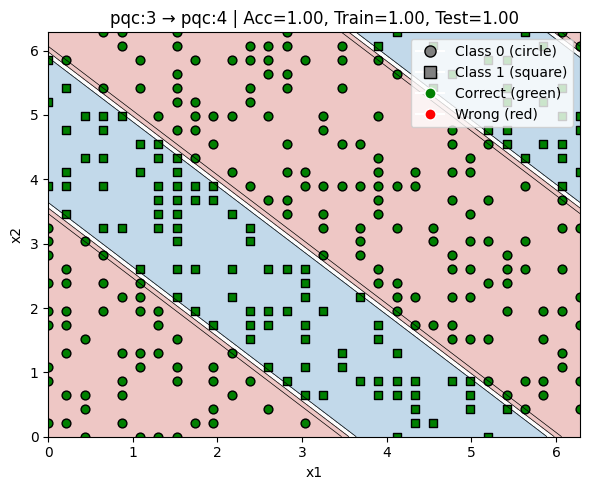

Generators:  92%|█████████▏| 11/12 [2:52:07<14:51, 891.42s/it]

Quantum circuit used to generate data (PQC with 4 qubits and depth 3):


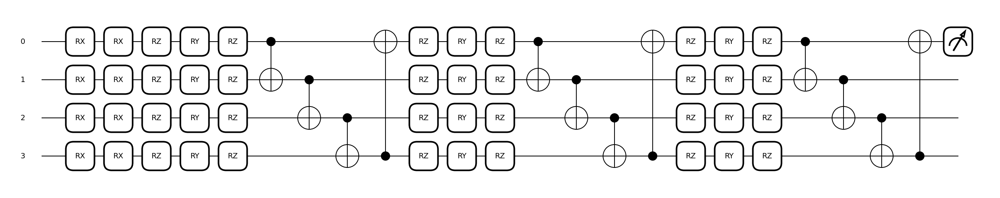

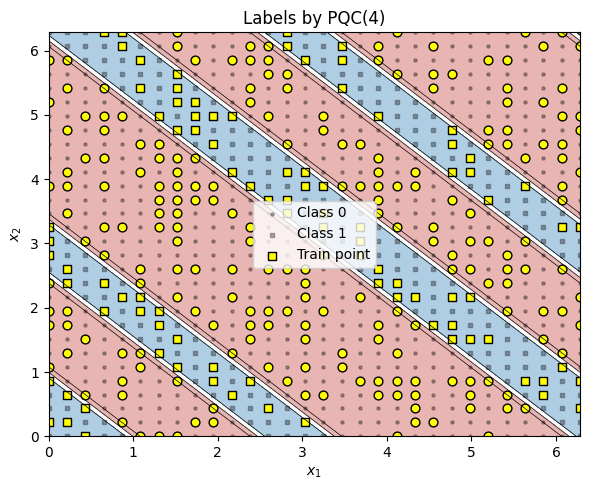

Training MLP_SHALLOW(1) on data from PQC(4)
Time taken: 1.63 seconds


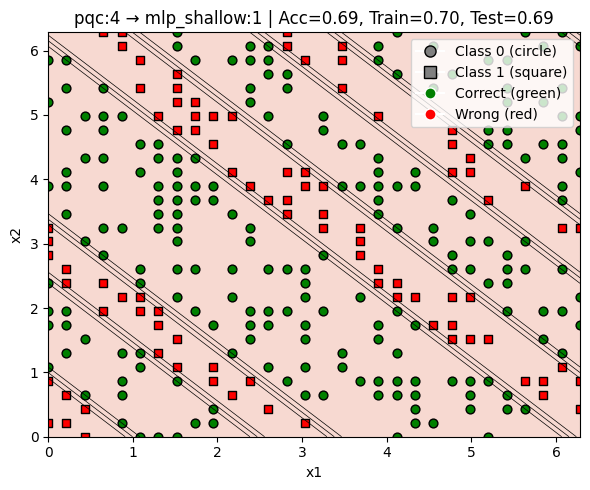

Training MLP_DEEP(1) on data from PQC(4)
Time taken: 3.57 seconds


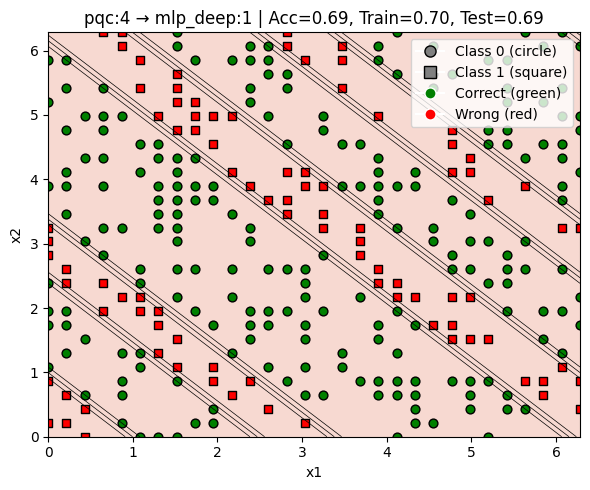

Training MLP_SHALLOW(2) on data from PQC(4)
Time taken: 1.76 seconds


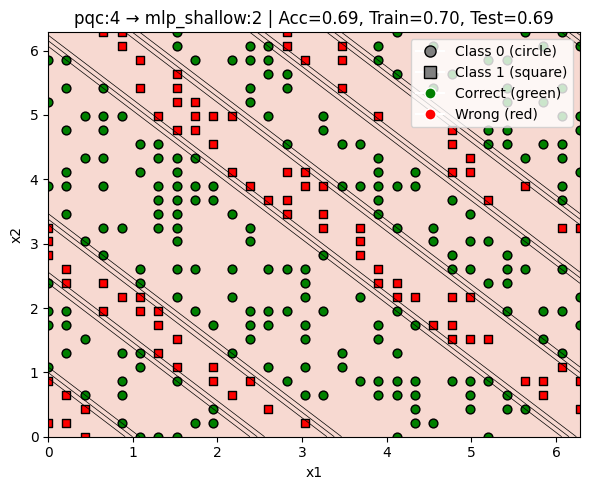

Training MLP_DEEP(2) on data from PQC(4)
Time taken: 3.52 seconds


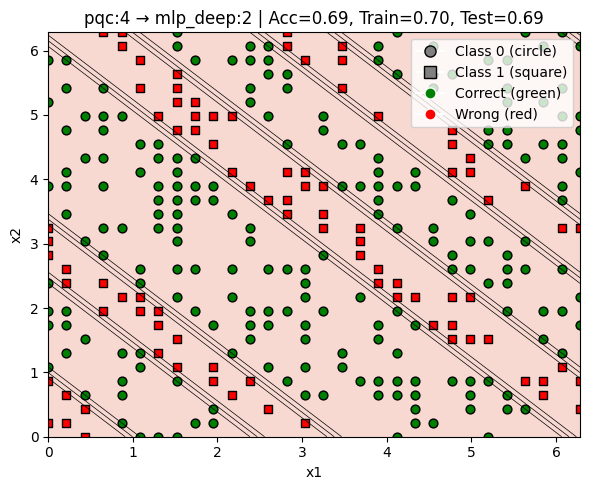

Training MLP_SHALLOW(3) on data from PQC(4)
Time taken: 1.67 seconds


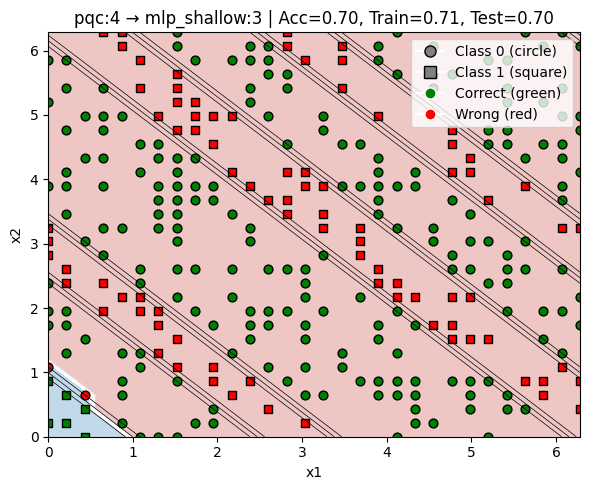

Training MLP_DEEP(3) on data from PQC(4)
Time taken: 3.53 seconds


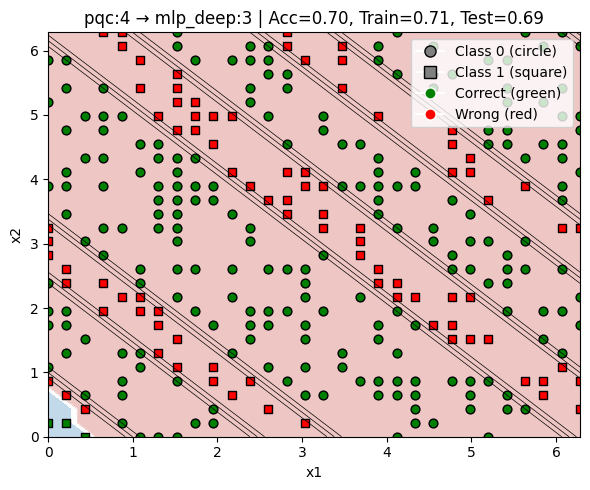

Training MLP_SHALLOW(4) on data from PQC(4)
Time taken: 1.67 seconds


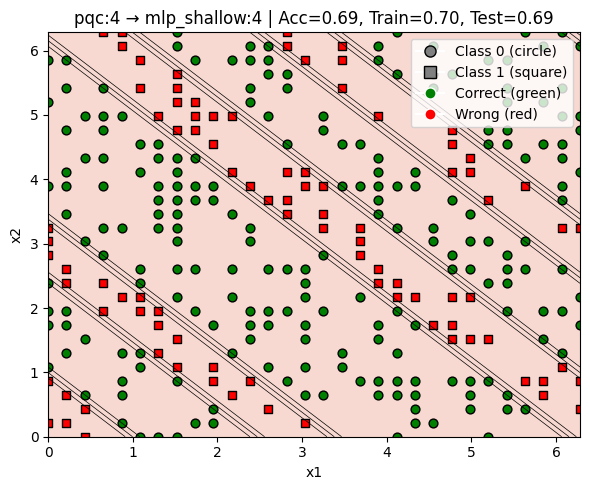

Training MLP_DEEP(4) on data from PQC(4)
Time taken: 3.67 seconds


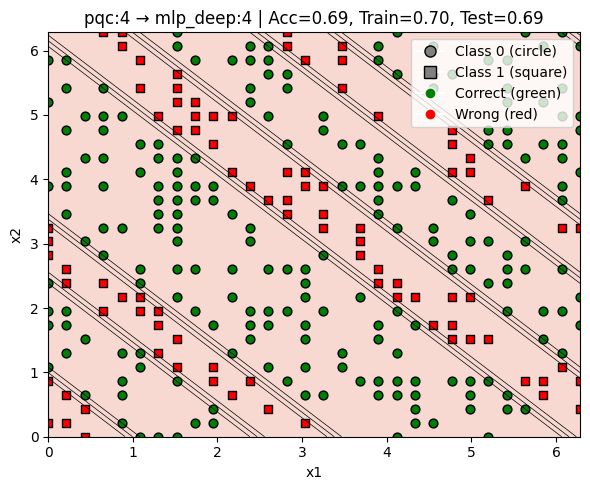

Training PQC(1) on data from PQC(4)
Time taken: 78.46 seconds


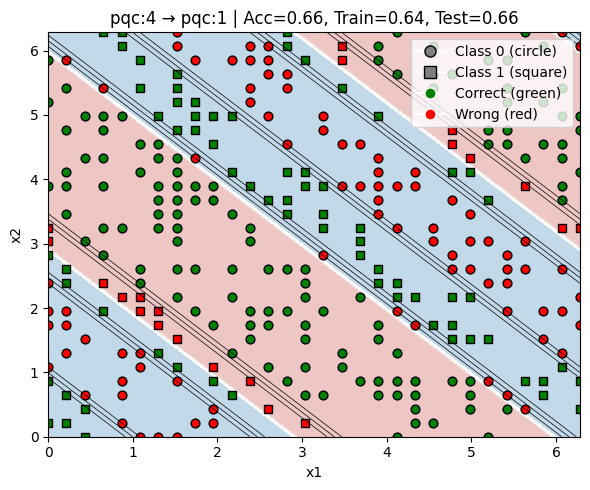

Training PQC(2) on data from PQC(4)
Time taken: 171.56 seconds


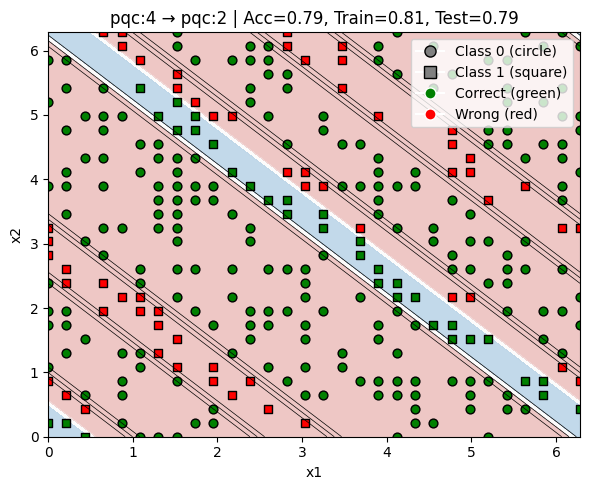

Training PQC(3) on data from PQC(4)
Time taken: 256.95 seconds


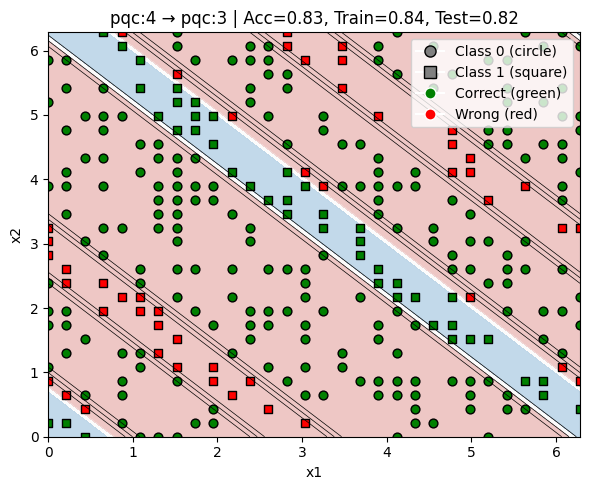

Training PQC(4) on data from PQC(4)
Time taken: 349.35 seconds


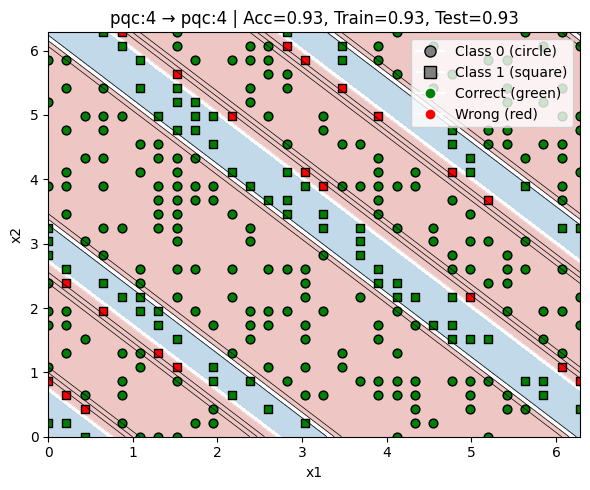

Generators: 100%|██████████| 12/12 [3:07:00<00:00, 935.02s/it]


In [12]:
for gen in tqdm(generators, desc="Generators"):
    gen_type = gen["type"]
    gen_width = gen["width"]
    gen_depth = gen["depth"]
    label_fn = gen["label_fn"]

    # Generate labels
    labels = label_fn(inputs)
    y_train = torch.tensor(labels[train_idx], dtype=torch.float32).unsqueeze(1)

    # --- Visualize generator ---
    if gen_type == "pqc":
        print(f"Quantum circuit used to generate data (PQC with {gen_width} qubits and depth {gen_depth}):")
        example_input = [0.5, 0.5]
        qml.drawer.draw_mpl(gen["circuit"])(example_input)
        plt.show()

    elif gen_type == "mlp_shallow" or gen_type == "mlp_deep":
        print(f"Classical MLP used to generate data (width={gen_width}, depth={gen_depth}):")
        mlp_model = gen["model"]
        print(mlp_model)
        summary(mlp_model, input_size=(2,))
        # x_sample = torch.randn(1, 2)
        # y_sample = mlp_model(x_sample)
        # make_dot(y_sample, params=dict(mlp_model.named_parameters())).render("mlp_structure", format="png")

    plot_generator_A(labels, f"Labels by {gen_type.upper()}({gen_width})", X=inputs, train_idx=train_idx)

    # --- Train learners ---
    for learner in generators:
        learner_type = learner["type"]
        learner_width = learner["width"]
        learner_depth = learner["depth"]

        print(f"Training {learner_type.upper()}({learner_width}) on data from {gen_type.upper()}({gen_width})")

        if learner_type == "pqc":
            dev = qml.device("default.qubit", wires=learner_width)
            model = get_torch_model(learner_depth, dev, learner_width)
        else:
            pqc_param_count = learner_depth * learner_width * 3
            model = create_mlp(input_dim, pqc_param_count, learner_depth)
        # print(gen_type)
        start_time = time.time()
        trained_model = train_model(model, X_train, y_train,gen_type=learner_type)

        with torch.no_grad():
            preds = torch.stack([trained_model(x) for x in torch.tensor(inputs, dtype=torch.float32)]).numpy().flatten()
        pred_labels = (preds > 0).astype(int)

        acc = accuracy_score(labels, pred_labels)
        train_acc = accuracy_score(labels[train_idx], pred_labels[train_idx])
        test_acc = accuracy_score(labels[test_idx], pred_labels[test_idx])
        print(f"Time taken: {time.time() - start_time:.2f} seconds")
        title = f"{gen_type}:{gen_width} → {learner_type}:{learner_width} | Acc={acc:.2f}, Train={train_acc:.2f}, Test={test_acc:.2f}"
        results.append((gen_type, gen_width, learner_type, learner_width, acc, train_acc, test_acc))
        plot_results(labels, pred_labels, title, inputs, train_idx)


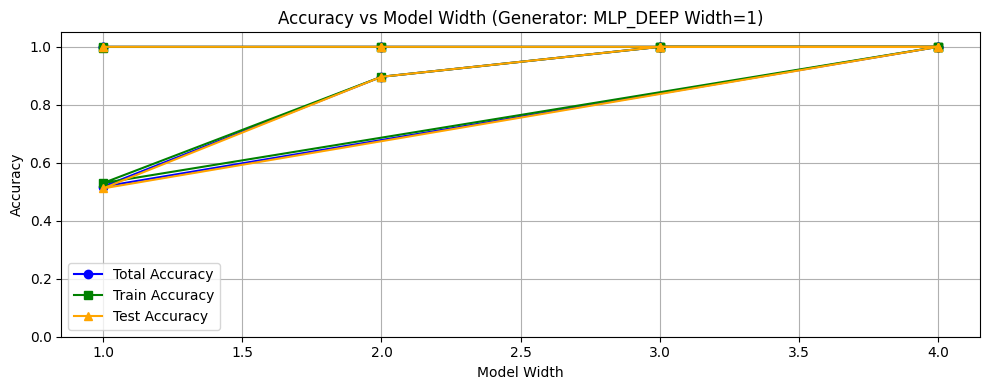

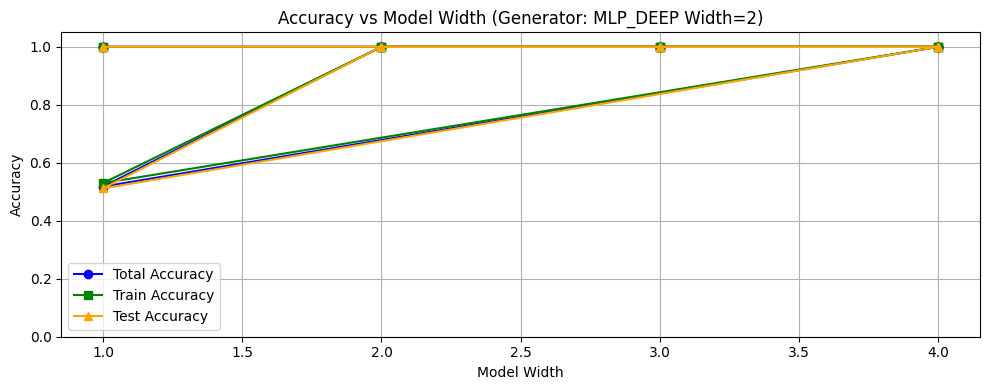

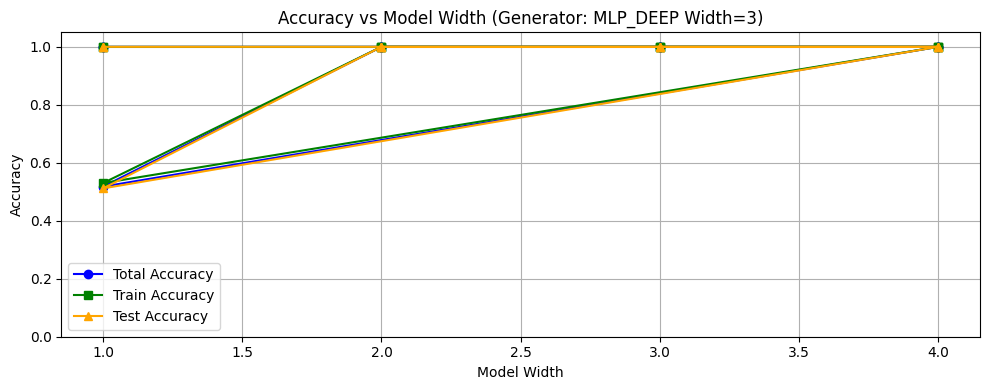

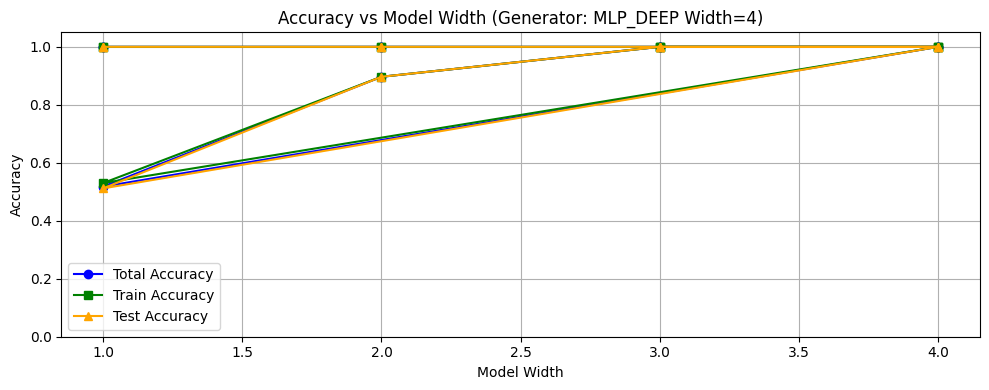

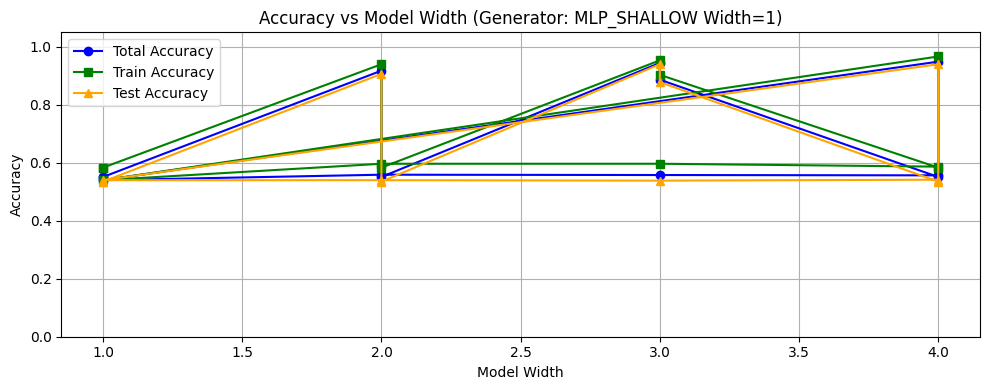

...

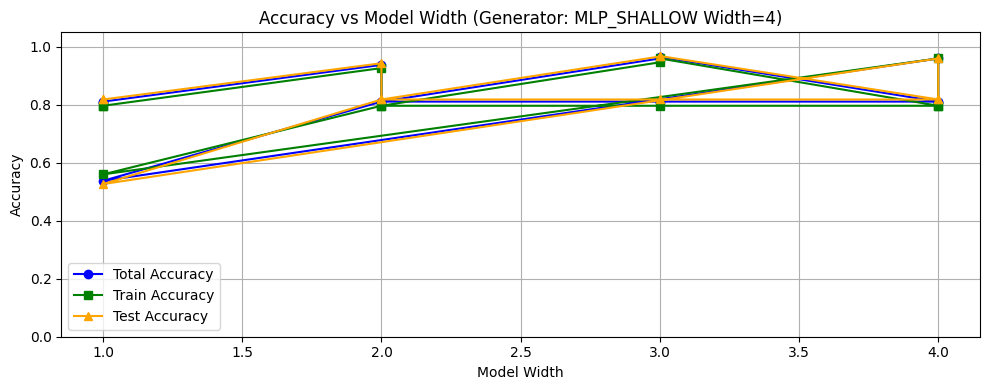

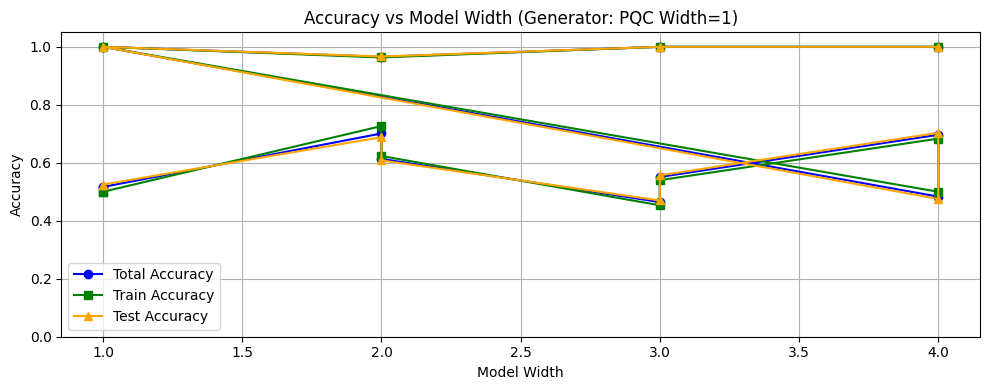

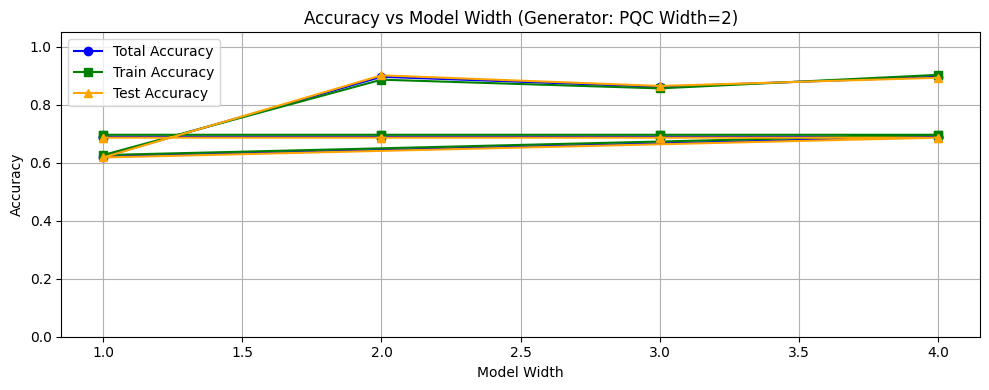

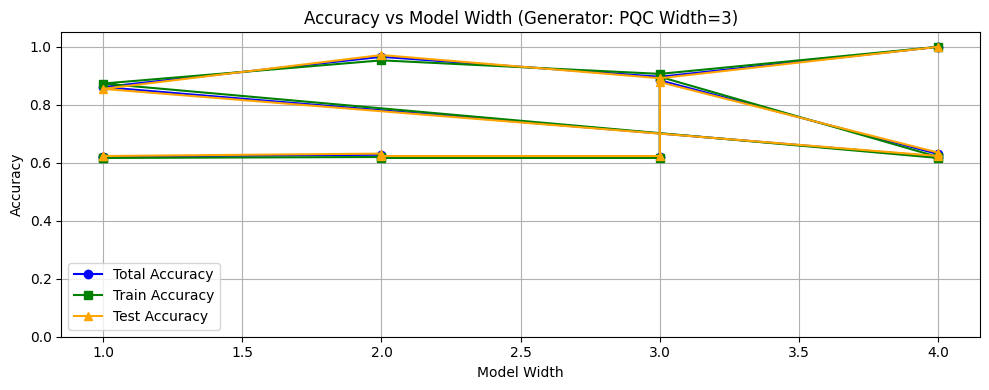

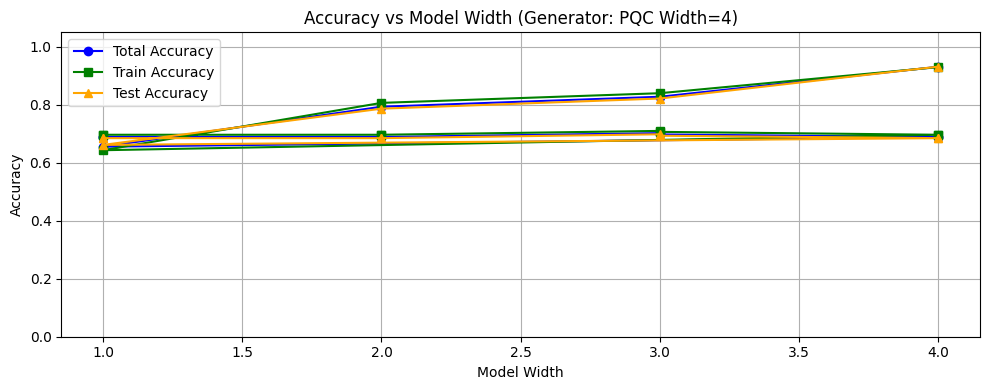

In [13]:
# Updated DataFrame with general model info
df_results = pd.DataFrame(results, columns=["gen_type", "gen_width", "model_type", "model_width", "total_acc", "train_acc", "test_acc"])

# Plot accuracy curves for each generator
for (gen_type, gen_width), subset in df_results.groupby(["gen_type", "gen_width"]):
    plt.figure(figsize=(10, 4))

    plt.plot(subset["model_width"], subset["total_acc"], marker='o', label="Total Accuracy", color='blue')
    plt.plot(subset["model_width"], subset["train_acc"], marker='s', label="Train Accuracy", color='green')
    plt.plot(subset["model_width"], subset["test_acc"], marker='^', label="Test Accuracy", color='orange')
    plt.title(f"Accuracy vs Model Width (Generator: {gen_type.upper()} Width={gen_width})")
    plt.xlabel("Model Width")
    plt.ylabel("Accuracy")
    plt.ylim(0, 1.05)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


In [14]:
print("done")

done


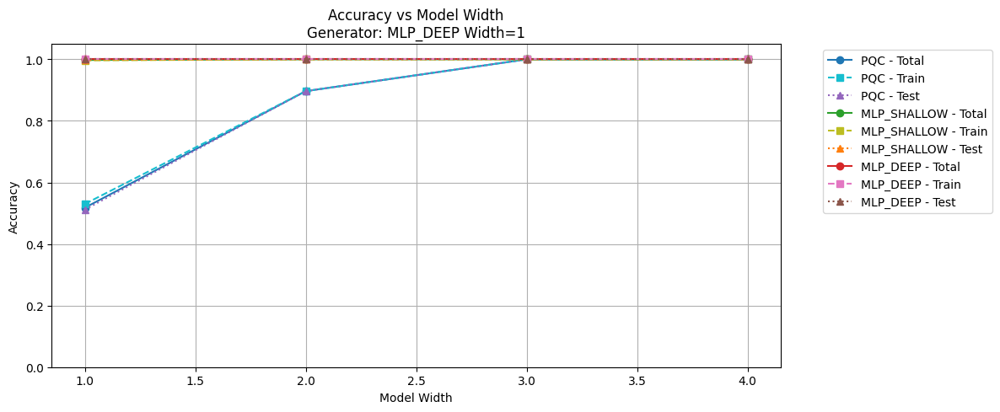

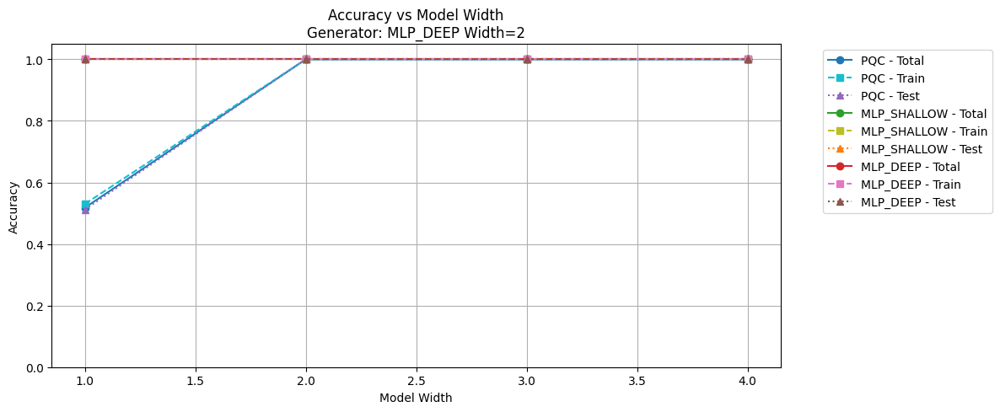

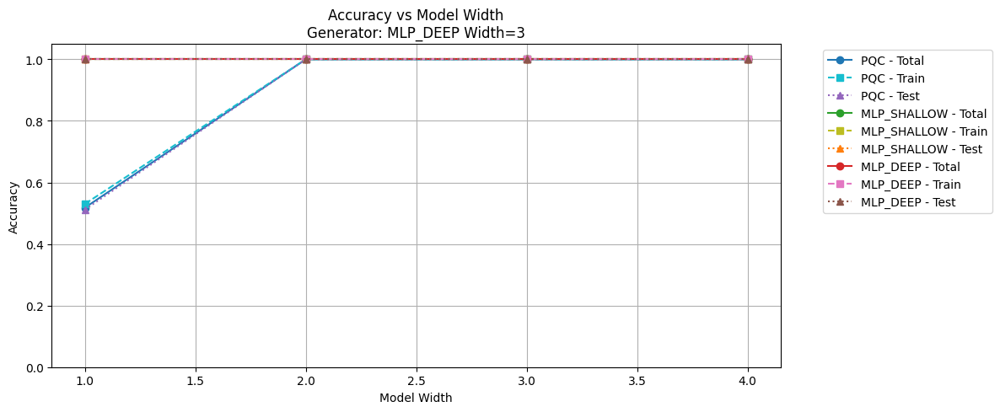

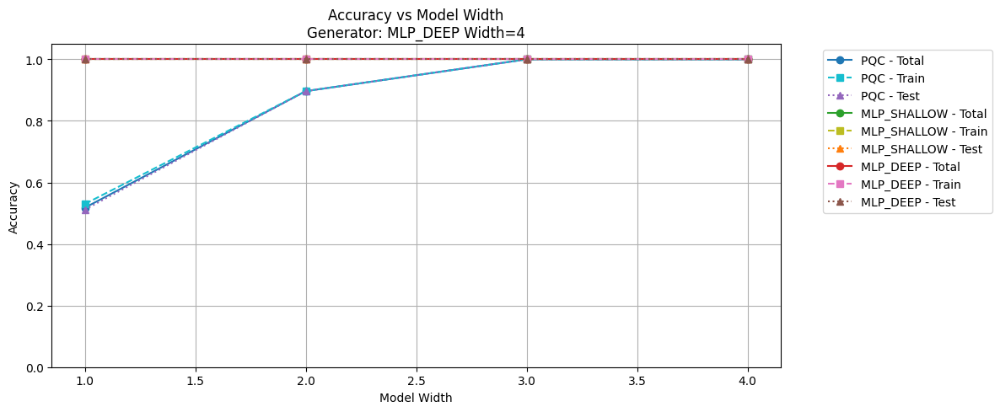

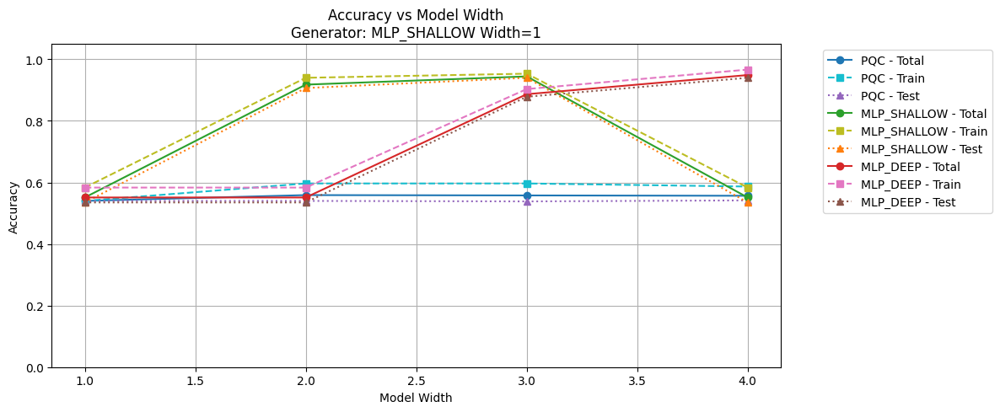

...

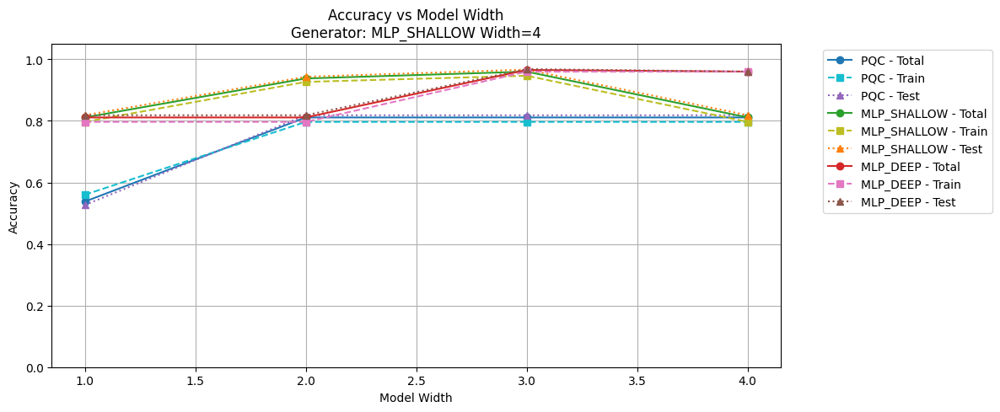

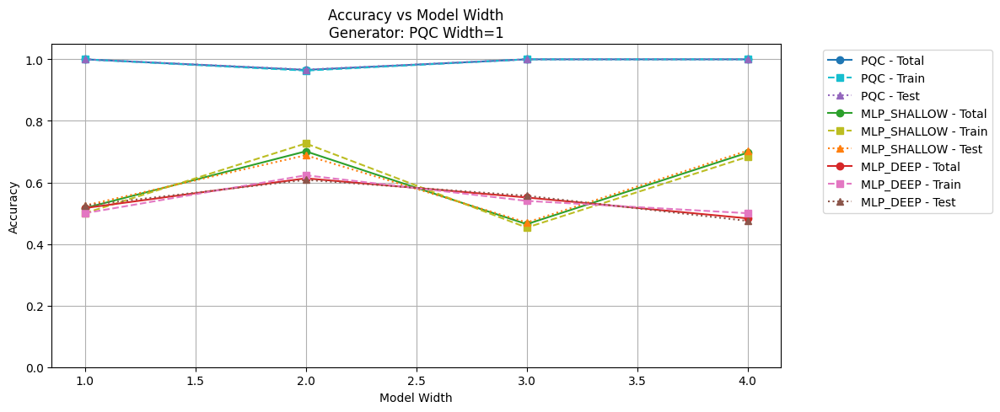

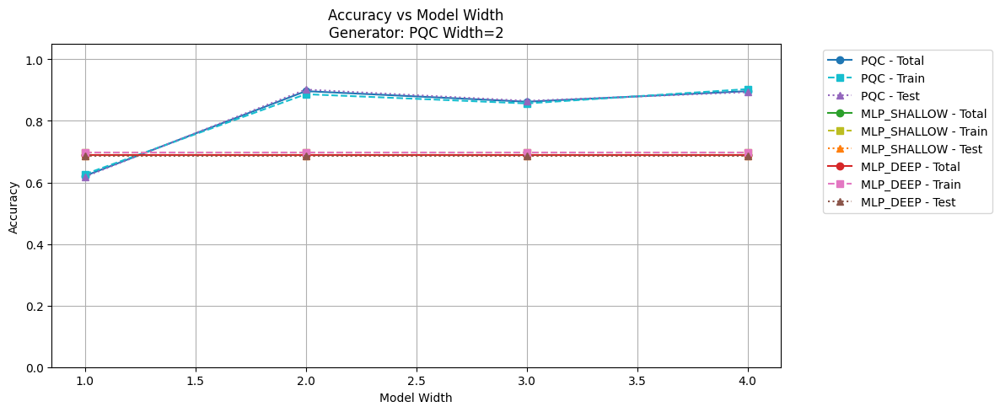

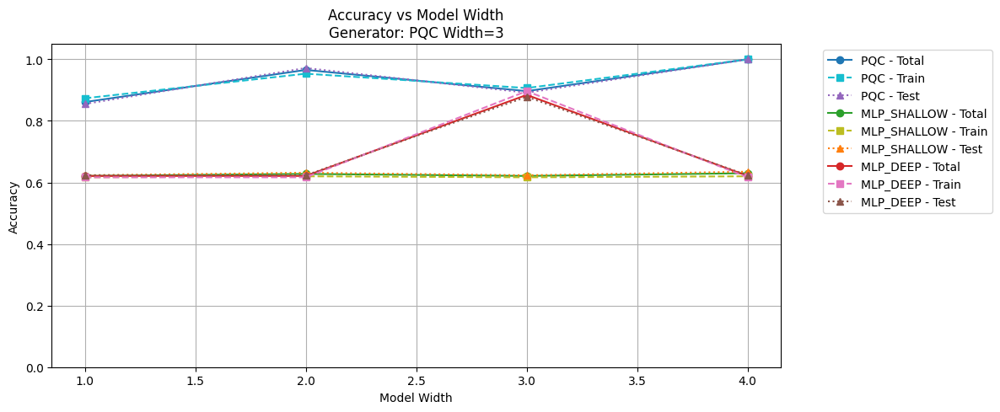

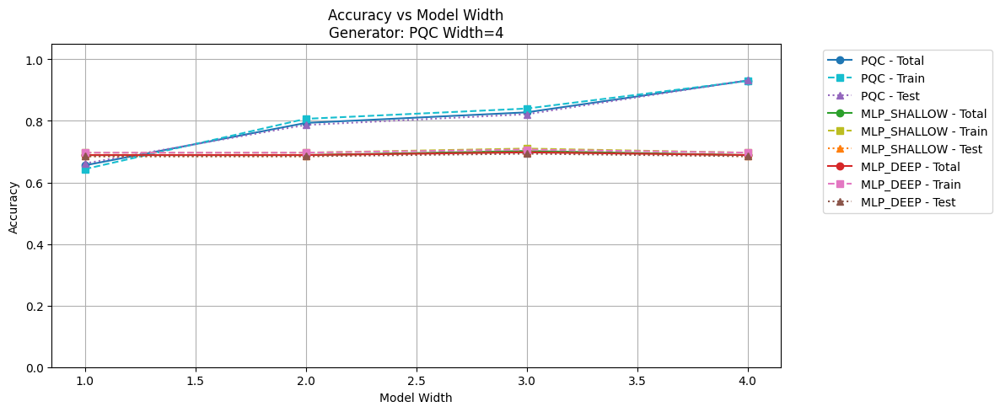

In [15]:
# Define distinct colors for each model_type and accuracy type
color_map = {
    ("pqc", "total"): "tab:blue",
    ("pqc", "train"): "tab:cyan",
    ("pqc", "test"): "tab:purple",
    ("mlp_shallow", "total"): "tab:green",
    ("mlp_shallow", "train"): "tab:olive",
    ("mlp_shallow", "test"): "tab:orange",
    ("mlp_deep", "total"): "tab:red",
    ("mlp_deep", "train"): "tab:pink",
    ("mlp_deep", "test"): "tab:brown",
}

line_styles = {
    "total": "-",
    "train": "--",
    "test": ":"
}

markers = {
    "total": "o",
    "train": "s",
    "test": "^"
}

# Plot for each generator group
for (gen_type, gen_width), subset in df_results.groupby(["gen_type", "gen_width"]):
    plt.figure(figsize=(12, 5))

    for model_type in ["pqc", "mlp_shallow", "mlp_deep"]:
        model_data = subset[subset["model_type"] == model_type]
        if model_data.empty:
            continue

        for acc_type in ["total", "train", "test"]:
            y = model_data[f"{acc_type}_acc"]
            x = model_data["model_width"]
            label = f"{model_type.upper()} - {acc_type.capitalize()}"
            color = color_map.get((model_type, acc_type), "black")
            linestyle = line_styles[acc_type]
            marker = markers[acc_type]

            plt.plot(x, y, label=label, color=color, linestyle=linestyle, marker=marker)

    plt.title(f"Accuracy vs Model Width\nGenerator: {gen_type.upper()} Width={gen_width}")
    plt.xlabel("Model Width")
    plt.ylabel("Accuracy")
    plt.ylim(0, 1.05)
    plt.grid(True)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

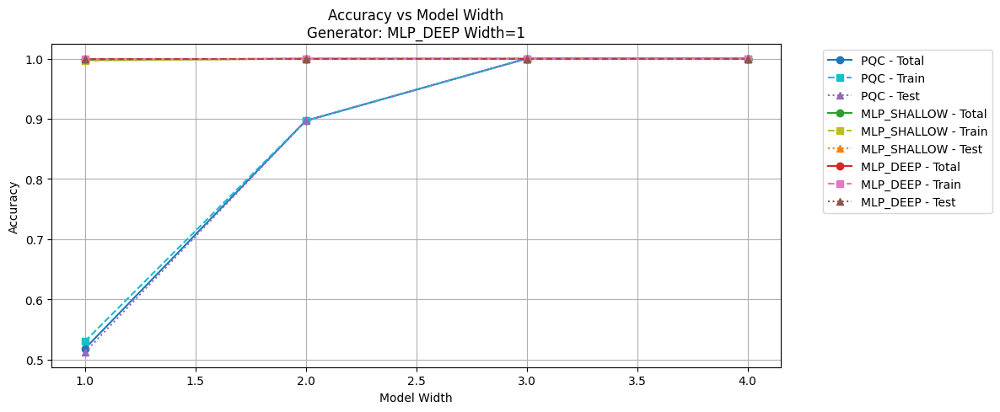

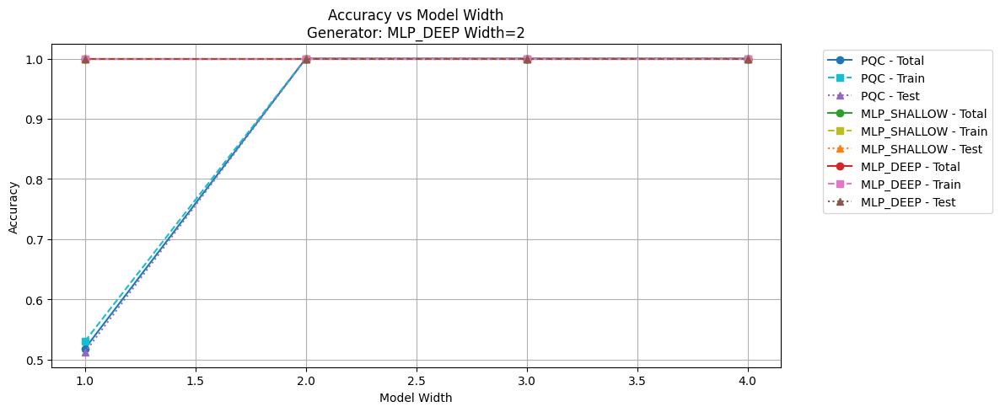

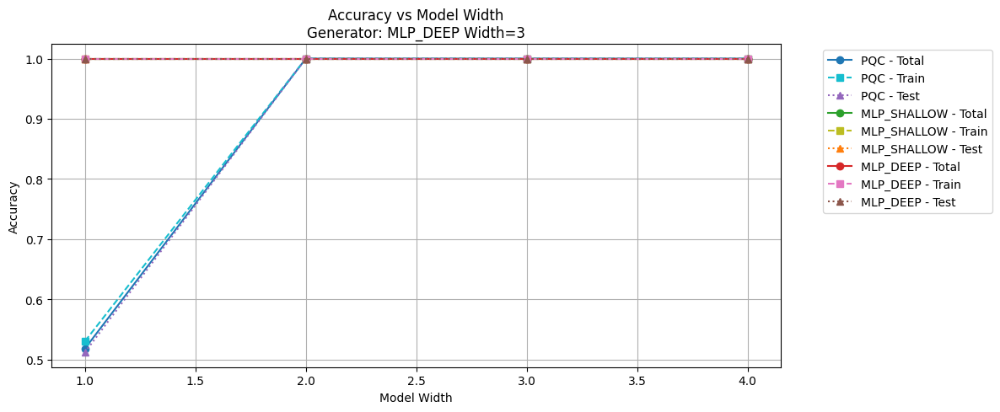

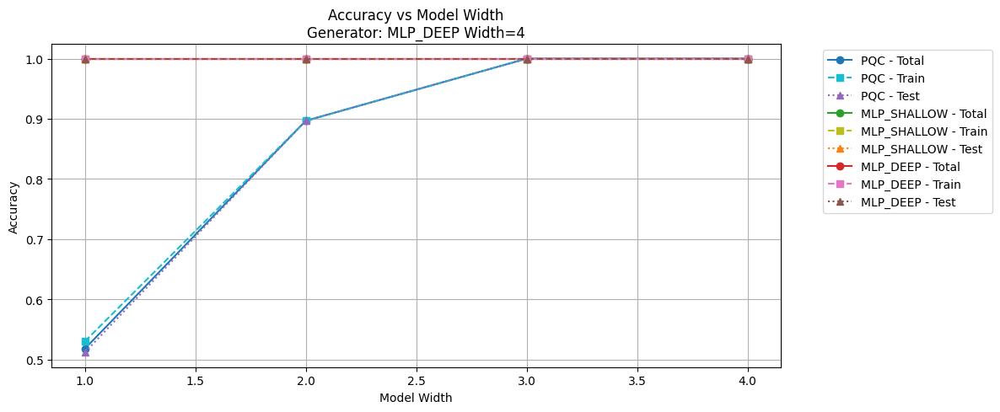

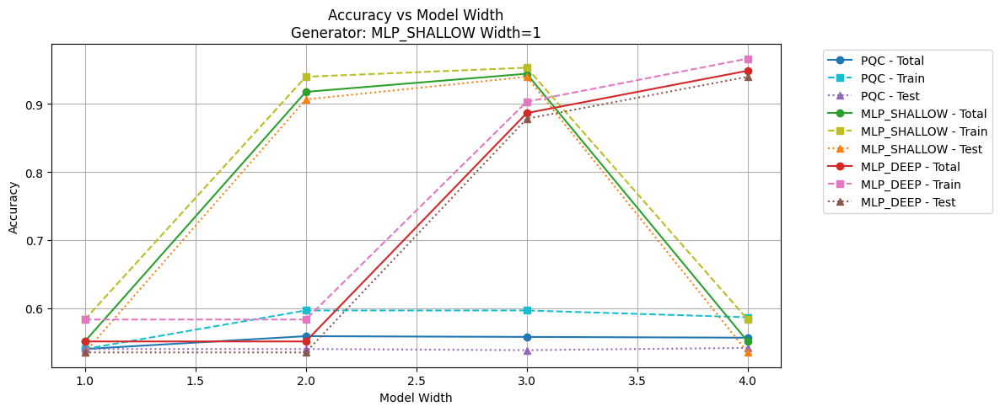

...

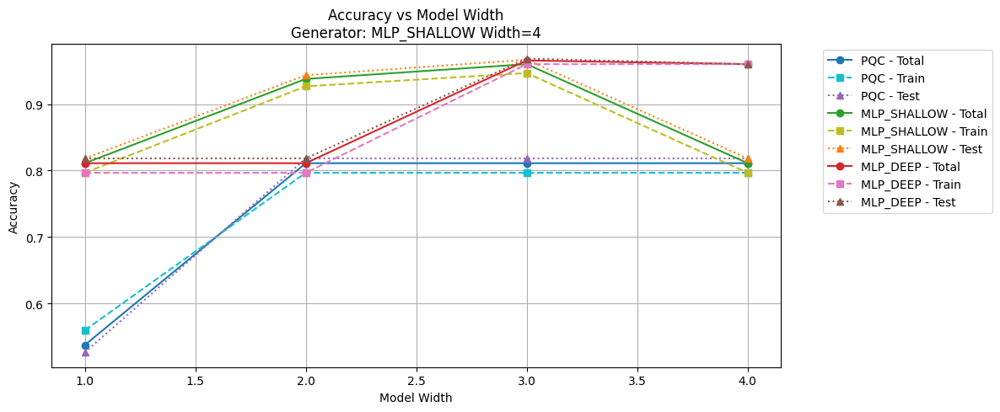

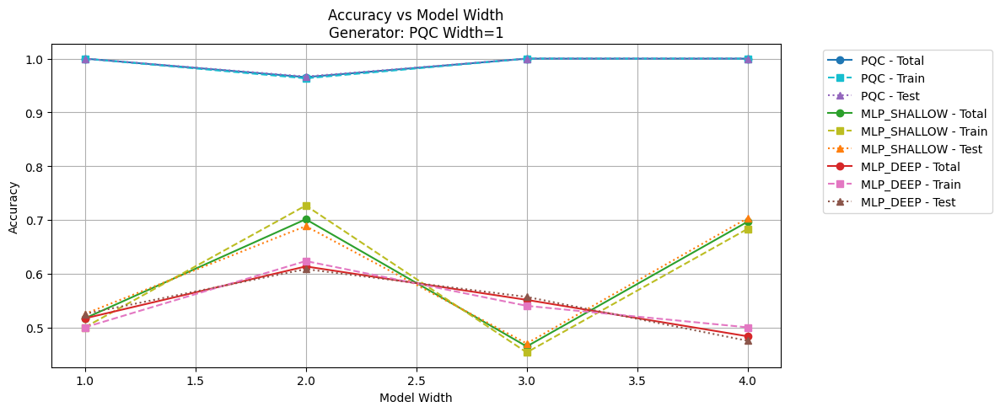

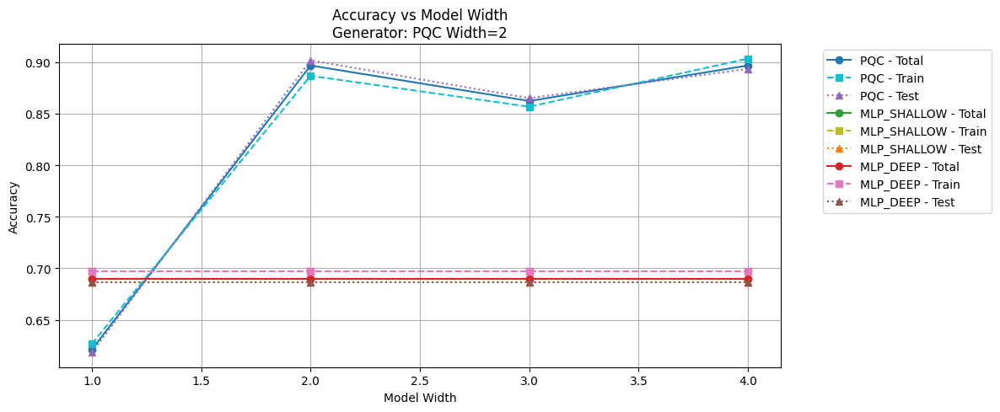

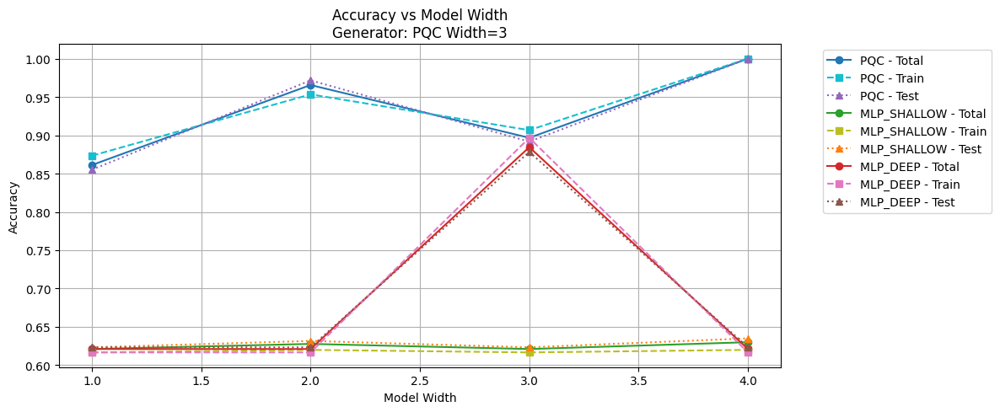

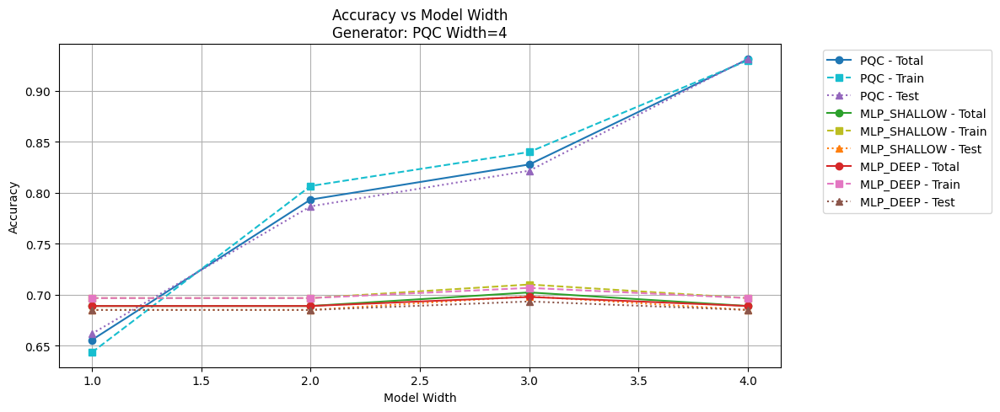

In [16]:
# Define distinct colors for each model_type and accuracy type
color_map = {
    ("pqc", "total"): "tab:blue",
    ("pqc", "train"): "tab:cyan",
    ("pqc", "test"): "tab:purple",
    ("mlp_shallow", "total"): "tab:green",
    ("mlp_shallow", "train"): "tab:olive",
    ("mlp_shallow", "test"): "tab:orange",
    ("mlp_deep", "total"): "tab:red",
    ("mlp_deep", "train"): "tab:pink",
    ("mlp_deep", "test"): "tab:brown",
}

line_styles = {
    "total": "-",
    "train": "--",
    "test": ":"
}

markers = {
    "total": "o",
    "train": "s",
    "test": "^"
}

# Plot for each generator group
for (gen_type, gen_width), subset in df_results.groupby(["gen_type", "gen_width"]):
    plt.figure(figsize=(12, 5))

    for model_type in ["pqc", "mlp_shallow", "mlp_deep"]:
        model_data = subset[subset["model_type"] == model_type]
        if model_data.empty:
            continue

        for acc_type in ["total", "train", "test"]:
            y = model_data[f"{acc_type}_acc"]
            x = model_data["model_width"]
            label = f"{model_type.upper()} - {acc_type.capitalize()}"
            color = color_map.get((model_type, acc_type), "black")
            linestyle = line_styles[acc_type]
            marker = markers[acc_type]

            plt.plot(x, y, label=label, color=color, linestyle=linestyle, marker=marker)

    plt.title(f"Accuracy vs Model Width\nGenerator: {gen_type.upper()} Width={gen_width}")
    plt.xlabel("Model Width")
    plt.ylabel("Accuracy")
    # plt.ylim(0, 1.05)
    plt.grid(True)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()